Kelompok 2

Ibrahim Frosly Alesandro (021)

Muhammad Faiz Munif Billah(028)

Gesang Nur Zamroji (145)

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# **1.Membuat Model**

## **EDA**

In [ ]:
from datetime import datetime
import csv
import pandas as pd
from bs4 import BeautifulSoup as bs
import requests as rs
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import re
import pandas as pd
import matplotlib.pyplot as plt
import string
nltk.download('stopwords')
nltk.download('wordnet')
from sklearn.feature_extraction.text import TfidfVectorizer
hades = {'user-agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/106.0.0.0 Safari/537.36'}

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


In [ ]:
df = pd.read_csv('/content/drive/MyDrive/projek_pemteks/data_train_gabungan15000.csv')
df

,title,label,label_score
0,Anak Penjaga Kebersihan Masjid Lantamal 1 Bela...,clickbait,1
1,Wakil Menkeu : Kenaikan Iuran BPJS Tidak Akan ...,non-clickbait,0
2,"Miliki Reputasi Kualitas Dunia, Powerbank G-Po...",non-clickbait,0
3,"Pendukung Jokowi Ngaku Diculik di Masjid, Ini ...",clickbait,1
4,"Sebentar Lagi, Minyak Curah Dilarang, Warga Ha...",clickbait,1
...,...,...,...
14995,"Penjelasan Menteri LHK Soal Karhutla, Asap dan...",clickbait,1
14996,MPR Sepakat Perlu Ada Haluan Negara,non-clickbait,0
14997,Inggris Mengaku Tak Tahu Dalang Serangan Kilan...,non-clickbait,0
14998,DPR Sahkan Revisi UU MD3 yang Atur Pemilihan 1...,non-clickbait,0


In [ ]:
df.isna().sum()

,0
title,1
label,0
label_score,0


In [ ]:
df.dropna(inplace=True)


In [ ]:
df.loc[df.duplicated(keep=False), :]


In [ ]:
df.value_counts('label')

,count
label,
non-clickbait,8709
clickbait,6290


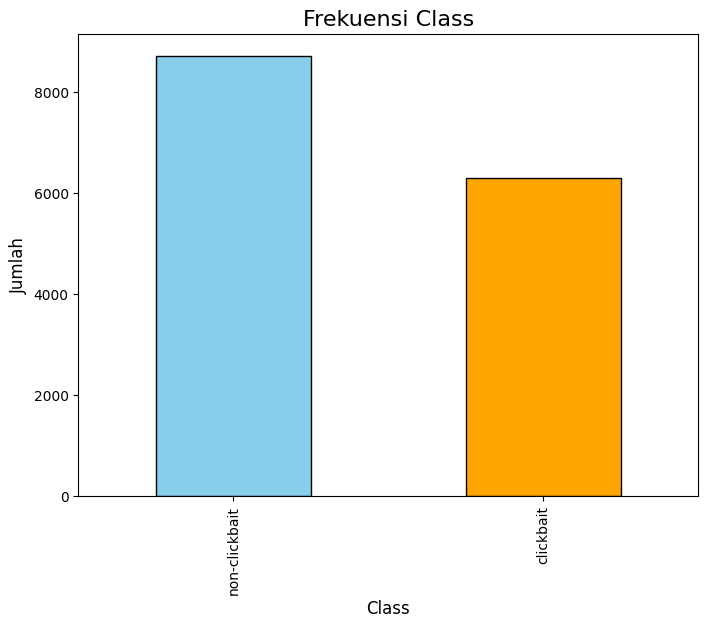

In [ ]:
counts = df['label'].value_counts()
# Plot diagram batang
plt.figure(figsize=(8, 6))
ax = counts.plot(kind='bar', color=['skyblue', 'orange'], edgecolor='black')

# Tambahkan judul dan label
plt.title('Frekuensi Class', fontsize=16)
plt.xlabel('Class', fontsize=12)
plt.ylabel('Jumlah', fontsize=12)

# Tampilkan diagram
plt.show()


In [ ]:
!pip install Sastrawi

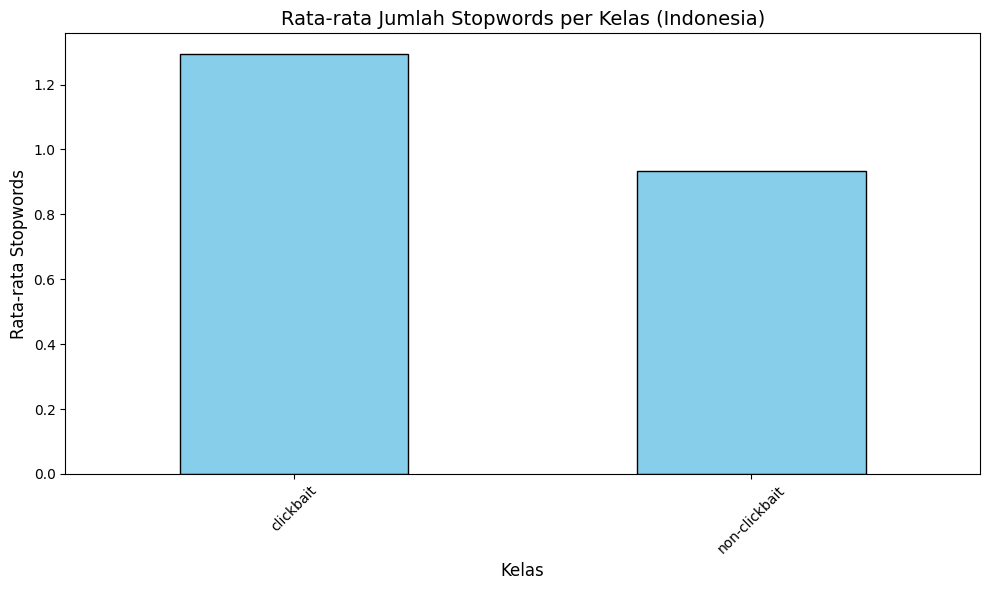

In [ ]:
import pandas as pd
from Sastrawi.StopWordRemover.StopWordRemoverFactory import StopWordRemoverFactory
import matplotlib.pyplot as plt

# Daftar stopword bahasa Indonesia
factory = StopWordRemoverFactory()
stop_words = set(factory.get_stop_words())

# Hitung jumlah stopwords per teks
df['stopword_count'] = df['title'].apply(
    lambda x: sum(1 for word in x.lower().split() if word in stop_words)
)

# Hitung total kata dalam setiap teks
df['word_count'] = df['title'].apply(lambda x: len(x.split()))

# Hitung statistik (rata-rata jumlah stopwords per kelas)
stats = df.groupby('label').agg(
    mean_stopword_count=('stopword_count', 'mean')
)

# Plot rata-rata jumlah stopwords
plt.figure(figsize=(10, 6))

# Subplot: Rata-rata jumlah stopwords
stats['mean_stopword_count'].plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata Jumlah Stopwords per Kelas (Indonesia)', fontsize=14)
plt.xlabel('Kelas', fontsize=12)
plt.ylabel('Rata-rata Stopwords', fontsize=12)
plt.xticks(rotation=45)

# Menyempurnakan tampilan
plt.tight_layout()
plt.show()


## **Preposesing**

####PREPROCESSING WITH REMOVE STOPWORDS

In [ ]:
# Stemming
factory = StemmerFactory()
stemmer = factory.create_stemmer()
stopword_factory = StopWordRemoverFactory()
stop_words = set(stopword_factory.get_stop_words())

# Clean
def clean_teks(text):
    if pd.isnull(text):
        return ''

    text = text.lower()
    text = re.sub(r'\d+', '', text)
    text = re.sub(r'[^\x00-\x7f]', r' ', text)
    text = text.translate(str.maketrans(string.punctuation, ' ' * len(string.punctuation)))
    text = re.sub(r'(.)\1+', r'\1\1', text)
    tokens = text.split()
    processed_tokens = [stemmer.stem(word) for word in tokens if word not in stop_words]
    return ' '.join(processed_tokens)

filepath = "/content/drive/MyDrive/projek_pemteks/data_train_gabungan15000.csv"
df = pd.read_csv(filepath).dropna()
df['title_beritaclean'] = df['title'].apply(clean_teks)

df.to_csv("/content/drive/MyDrive/projek_pemteks/Data_kaggle_remove_stopwords.csv", index=False)
df

,title,label,label_score,title_beritaclean
0,Anak Penjaga Kebersihan Masjid Lantamal 1 Bela...,clickbait,1,anak jaga bersih masjid lantamal belawan lulus...
1,Wakil Menkeu : Kenaikan Iuran BPJS Tidak Akan ...,non-clickbait,0,wakil menkeu naik iur bpjs pengaruh duduk miskin
2,"Miliki Reputasi Kualitas Dunia, Powerbank G-Po...",non-clickbait,0,milik reputasi kualitas dunia powerbank g powe...
3,"Pendukung Jokowi Ngaku Diculik di Masjid, Ini ...",clickbait,1,dukung jokowi ngaku culik masjid bantah pihak dkm
4,"Sebentar Lagi, Minyak Curah Dilarang, Warga Ha...",clickbait,1,sebentar minyak curah larang warga beli minyak...
...,...,...,...,...
14995,"Penjelasan Menteri LHK Soal Karhutla, Asap dan...",clickbait,1,jelas menteri lhk soal karhutla asap tega hukum
14996,MPR Sepakat Perlu Ada Haluan Negara,non-clickbait,0,mpr sepakat perlu haluan negara
14997,Inggris Mengaku Tak Tahu Dalang Serangan Kilan...,non-clickbait,0,inggris aku tak tahu dalang serang kilang miny...
14998,DPR Sahkan Revisi UU MD3 yang Atur Pemilihan 1...,non-clickbait,0,dpr sahkan revisi uu md atur pilih kursi mpr


####PREPROCESSING WITHOUT REMOVE STOPWORDS

In [ ]:
import pandas as pd
import re
import string
from Sastrawi.Stemmer.StemmerFactory import StemmerFactory

# Stemming
factory = StemmerFactory()
stemmer = factory.create_stemmer()

# Clean
def clean_teks(text):
    if pd.isnull(text):
        return ''

    text = text.lower()
    text = re.sub(r'\d+', '', text)
    text = re.sub(r'[^\x00-\x7f]', r' ', text)
    text = text.translate(str.maketrans(string.punctuation, ' ' * len(string.punctuation)))
    text = re.sub(r'(.)\1+', r'\1\1', text)
    tokens = text.split()
    processed_tokens = [stemmer.stem(word) for word in tokens]
    return ' '.join(processed_tokens)

filepath = "/content/drive/MyDrive/projek_pemteks/data_train_gabungan15000.csv"
dff = pd.read_csv(filepath).dropna()

dff['title_clean'] = dff['title'].apply(clean_teks)

dff.to_csv("/content/drive/MyDrive/projek_pemteks/Data_kaggle_without_remove_stopwords.csv", index=False)
dff


,title,label,label_score,title_clean
0,Anak Penjaga Kebersihan Masjid Lantamal 1 Bela...,clickbait,1,anak jaga bersih masjid lantamal belawan lulus...
1,Wakil Menkeu : Kenaikan Iuran BPJS Tidak Akan ...,non-clickbait,0,wakil menkeu naik iur bpjs tidak akan pengaruh...
2,"Miliki Reputasi Kualitas Dunia, Powerbank G-Po...",non-clickbait,0,milik reputasi kualitas dunia powerbank g powe...
3,"Pendukung Jokowi Ngaku Diculik di Masjid, Ini ...",clickbait,1,dukung jokowi ngaku culik di masjid ini bantah...
4,"Sebentar Lagi, Minyak Curah Dilarang, Warga Ha...",clickbait,1,sebentar lagi minyak curah larang warga harus ...
...,...,...,...,...
14995,"Penjelasan Menteri LHK Soal Karhutla, Asap dan...",clickbait,1,jelas menteri lhk soal karhutla asap dan tega ...
14996,MPR Sepakat Perlu Ada Haluan Negara,non-clickbait,0,mpr sepakat perlu ada haluan negara
14997,Inggris Mengaku Tak Tahu Dalang Serangan Kilan...,non-clickbait,0,inggris aku tak tahu dalang serang kilang miny...
14998,DPR Sahkan Revisi UU MD3 yang Atur Pemilihan 1...,non-clickbait,0,dpr sahkan revisi uu md yang atur pilih kursi mpr


## **Fitur Enginering**

### TF-IDF

####**TF IDF WITHOUT EXTRA FEATURES**

In [ ]:
import nltk
nltk.download('punkt')
from sklearn.feature_extraction.text import TfidfVectorizer

tfidfvektorteks = TfidfVectorizer()
tfidfmetrikteks = tfidfvektorteks.fit_transform(df['teks_beritaclean'].to_list())
fiturteks = tfidfvektorteks.get_feature_names_out()
tfidf_dfteks = pd.DataFrame(tfidfmetrikteks.toarray(), columns=fiturteks)
tfidf_dfteks

####****TF IDF WITH REMOVE STOPWORDS****

In [ ]:
import pandas as pd
import re
from sklearn.feature_extraction.text import TfidfVectorizer

df = pd.read_csv('/content/drive/MyDrive/projek_pemteks/Data_kaggle_remove_stopwords.csv')
# Menambahkan fitur tambahan untuk analisis
df['title_length'] = df['title_beritaclean'].apply(lambda x: len(x.split()))  # Panjang judul
df['exclamation_count'] = df['title'].apply(lambda x: x.count('!'))  # Jumlah tanda seru
df['capital_ratio'] = df['title'].apply(lambda x: sum(1 for c in x if c.isupper()) / max(len(x), 1))  # Rasio huruf kapital
clickbait_words = [
    'heboh', 'wow', 'viral', 'tak disangka', 'terungkap', 'terheboh', 'membingungkan', 'membuat geger',
    'kamu harus tahu', 'kamu tidak akan percaya', 'rahasia', 'terbaru', 'terbaik', 'paling banyak dicari',
    'luar biasa', 'mengejutkan', 'misteri', 'paling hits', 'tidak terduga', 'mengungkap', 'fenomena',
    'apakah kamu siap', 'tak terbayangkan', 'mustahil', 'berita panas', 'selama ini', 'inilah yang terjadi',
    'akhirnya terungkap', 'bagaimana caranya', 'cara mudah', 'baca sebelum terlambat', 'bikin kaget',
    'harus kamu ketahui', 'terbaru di internet', 'berita sensasional', 'inilah faktanya', 'dulu tidak percaya',
    'wah', 'baru', 'terbaik', 'tidak boleh dilewatkan', 'muncul dengan', 'terungkap akhirnya', 'yang jarang diketahui',
    'sungguh', 'sesuatu yang tidak pernah dibayangkan', 'sedang ramai dibicarakan', 'gila', 'tidak akan kamu duga',
    'tidak masuk akal', 'pasti kamu tidak tahu', 'ketahui sekarang', 'lihat apa yang terjadi', 'baca selengkapnya',
    'mustahil namun benar', 'tidak percaya? buktikan sendiri', 'ini yang sebenarnya terjadi'
]

df['clickbait_word_count'] = df['title_beritaclean'].apply(lambda x: sum(1 for word in clickbait_words if word in x))
df['has_number'] = df['title'].str.contains(r'\d').astype(int)  # Apakah ada angka dalam judul


In [ ]:
TFIDFWITHREMOVESTOPWORDS_vektor = TfidfVectorizer()
tfidfmetrik = TFIDFWITHREMOVESTOPWORDS_vektor.fit_transform(df['title_beritaclean'].to_list())
tfidf_df = pd.DataFrame(tfidfmetrik.toarray(), columns=TFIDFWITHREMOVESTOPWORDS_vektor.get_feature_names_out())

In [ ]:
additional_features = df[['title_length', 'exclamation_count', 'capital_ratio', 'clickbait_word_count', 'has_number']]
final_features = pd.concat([tfidf_df, additional_features.reset_index(drop=True)], axis=1)

final_features.to_csv("/content/drive/MyDrive/projek_pemteks/tfidf_kaggle_remove_stopwords.csv", index=False)
final_features.head()


,aa,aachen,aaji,aaliyah,aap,aaron,abad,abadi,abah,abai,...,zulkifli,zumba,zun,zylgwyn,zylvechia,title_length,exclamation_count,capital_ratio,clickbait_word_count,has_number
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,13,0,0.159574,0,1
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,8,0,0.166667,0,0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,9,0,0.121622,0,0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,8,0,0.171875,0,0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,8,0,0.144928,0,0


####****TF IDF WITHOUT REMOVE STOPWORDS****

In [ ]:
import pandas as pd
import re
from sklearn.feature_extraction.text import TfidfVectorizer

dff = pd.read_csv('/content/drive/MyDrive/projek_pemteks/Data_kaggle_without_remove_stopwords.csv')
# Menambahkan fitur tambahan untuk analisis
dff['title_length'] = dff['title_clean'].apply(lambda x: len(x.split()))
dff['exclamation_count'] = dff['title'].apply(lambda x: x.count('!'))
dff['capital_ratio'] = dff['title'].apply(lambda x: sum(1 for c in x if c.isupper()) / max(len(x), 1))
clickbait_words = [
    'heboh', 'wow', 'viral', 'tak disangka', 'terungkap', 'terheboh', 'membingungkan', 'membuat geger',
    'kamu harus tahu', 'kamu tidak akan percaya', 'rahasia', 'terbaru', 'terbaik', 'paling banyak dicari',
    'luar biasa', 'mengejutkan', 'misteri', 'paling hits', 'tidak terduga', 'mengungkap', 'fenomena',
    'apakah kamu siap', 'tak terbayangkan', 'mustahil', 'berita panas', 'selama ini', 'inilah yang terjadi',
    'akhirnya terungkap', 'bagaimana caranya', 'cara mudah', 'baca sebelum terlambat', 'bikin kaget',
    'harus kamu ketahui', 'terbaru di internet', 'berita sensasional', 'inilah faktanya', 'dulu tidak percaya',
    'wah', 'baru', 'terbaik', 'tidak boleh dilewatkan', 'muncul dengan', 'terungkap akhirnya', 'yang jarang diketahui',
    'sungguh', 'sesuatu yang tidak pernah dibayangkan', 'sedang ramai dibicarakan', 'gila', 'tidak akan kamu duga',
    'tidak masuk akal', 'pasti kamu tidak tahu', 'ketahui sekarang', 'lihat apa yang terjadi', 'baca selengkapnya',
    'mustahil namun benar', 'tidak percaya? buktikan sendiri', 'ini yang sebenarnya terjadi'
]

dff['clickbait_word_count'] = dff['title_clean'].apply(lambda x: sum(1 for word in clickbait_words if word in x))
dff['has_number'] = dff['title'].str.contains(r'\d').astype(int)  # Apakah ada angka dalam judul

In [ ]:
TFIDFWITH_out_REMOVESTOPWORDS_vektor = TfidfVectorizer()
tfidfmetrik = TFIDFWITH_out_REMOVESTOPWORDS_vektor.fit_transform(dff['title_clean'].to_list())
tfidf_df = pd.DataFrame(tfidfmetrik.toarray(), columns=TFIDFWITH_out_REMOVESTOPWORDS_vektor.get_feature_names_out())

In [ ]:
# Menggabungkan fitur TF-IDF dengan fitur tambahan
additional_features = dff[['title_length', 'exclamation_count', 'capital_ratio', 'clickbait_word_count', 'has_number']]
final_features2 = pd.concat([tfidf_df, additional_features.reset_index(drop=True)], axis=1)

final_features2.to_csv("/content/drive/MyDrive/projek_pemteks/tfidf_kaggle_without_remove_stopwords.csv", index=False)
final_features2.head()

,aa,aachen,aaji,aaliyah,aap,aaron,abad,abadi,abah,abai,...,zulkifli,zumba,zun,zylgwyn,zylvechia,title_length,exclamation_count,capital_ratio,clickbait_word_count,has_number
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,14,0,0.159574,0,1
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,11,0,0.166667,0,0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,10,0,0.121622,0,0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,10,0,0.171875,0,0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,10,0,0.144928,0,0


###****WORD2VEC WITH REMOVE STOPWORDS****

In [ ]:
!pip install fasttext

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.4/73.4 kB 3.1 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Using cached pybind11-2.13.6-py3-none-any.whl.metadata (9.5 kB)
Using cached pybind11-2.13.6-py3-none-any.whl (243 kB)
  Created wheel for fasttext: filename=fasttext-0.9.3-cp310-cp310-linux_x86_64.whl size=4296186 sha256=5023f102e539844c7b0d03d1816f38d497250cbbb643317ae1a48010d4273737
  Stored in directory: /root/.cache/pip/wheels/0d/a2/00/81db54d3e6a8199b829d58e02cec2ddb20ce3e59fad8d3c92a
Successfully built fasttext


In [ ]:
import pandas as pd
import numpy as np
from gensim.models import Word2Vec

# Membaca data
df = pd.read_csv('/content/drive/MyDrive/projek_pemteks/Data_kaggle_remove_stopwords.csv')

# Pastikan 'title_beritaclean' sudah di-tokenisasi menjadi list kata
df['tokenized_title'] = df['title_beritaclean'].apply(lambda x: str(x).split())  # Tokenisasi sederhana dengan split()

# Gabungkan token dari semua dokumen
all_tokens = df['tokenized_title'].tolist()

# Latih model Word2Vec
word2vec_model = Word2Vec(
    sentences=all_tokens,  # Input berupa list tokenized sentences
    vector_size=100,       # Dimensi vektor embedding
    window=5,              # Window size
    min_count=1,           # Minimal frekuensi kata
    workers=4,             # Jumlah thread
    sg=0                   # CBOW model
)

# Fungsi untuk menghitung rata-rata vektor dokumen
def document_vector(tokens, model):
    valid_tokens = [token for token in tokens if token in model.wv]
    if not valid_tokens:  # Jika tidak ada kata yang valid, kembalikan vektor nol
        return np.zeros(model.vector_size)
    return np.mean([model.wv[token] for token in valid_tokens], axis=0)

# Terapkan fungsi pada setiap baris untuk menghasilkan embedding dokumen
df['embedding'] = df['tokenized_title'].apply(lambda tokens: document_vector(tokens, word2vec_model))

# Konversi embedding menjadi matriks
embedding_matrix = np.vstack(df['embedding'])

# Buat DataFrame untuk embeddings
embedding_df = pd.DataFrame(embedding_matrix, columns=[f'dim_{i}' for i in range(embedding_matrix.shape[1])])

# Gabungkan embeddings dengan data asli
result_df = pd.concat([df, embedding_df], axis=1)

# Simpan hasil ke file CSV
result_df.to_csv("/content/drive/MyDrive/projek_pemteks/WORD2VEC_WITH_REMOVE_STOPWORDS.csv", index=False)
print("Embeddings berhasil ditambahkan!")


Embeddings berhasil ditambahkan!


###****WORD2VEC WITHOUT REMOVE STOPWORDS****

In [ ]:
import pandas as pd
import numpy as np
from gensim.models import Word2Vec

# Membaca data
df = pd.read_csv('/content/drive/MyDrive/projek_pemteks/Data_kaggle_without_remove_stopwords.csv')

# Pastikan 'title_beritaclean' sudah di-tokenisasi menjadi list kata
df['tokenized_title'] = df['title_clean'].apply(lambda x: str(x).split())  # Tokenisasi sederhana dengan split()

# Gabungkan token dari semua dokumen
all_tokens = df['tokenized_title'].tolist()

# Latih model Word2Vec
word2vec_model = Word2Vec(
    sentences=all_tokens,  # Input berupa list tokenized sentences
    vector_size=100,       # Dimensi vektor embedding
    window=5,              # Window size
    min_count=1,           # Minimal frekuensi kata
    workers=4,             # Jumlah thread
    sg=0                   # CBOW model
)

# Fungsi untuk menghitung rata-rata vektor dokumen
def document_vector(tokens, model):
    valid_tokens = [token for token in tokens if token in model.wv]
    if not valid_tokens:  # Jika tidak ada kata yang valid, kembalikan vektor nol
        return np.zeros(model.vector_size)
    return np.mean([model.wv[token] for token in valid_tokens], axis=0)

# Terapkan fungsi pada setiap baris untuk menghasilkan embedding dokumen
df['embedding'] = df['tokenized_title'].apply(lambda tokens: document_vector(tokens, word2vec_model))

# Konversi embedding menjadi matriks
embedding_matrix = np.vstack(df['embedding'])

# Buat DataFrame untuk embeddings
embedding_df = pd.DataFrame(embedding_matrix, columns=[f'dim_{i}' for i in range(embedding_matrix.shape[1])])

# Gabungkan embeddings dengan data asli
result_df = pd.concat([df, embedding_df], axis=1)

# Simpan hasil ke file CSV
result_df.to_csv("/content/drive/MyDrive/projek_pemteks/WORD2VEC_WITHOUT_REMOVE_STOPWORDS.csv", index=False)
print("Embeddings berhasil ditambahkan!")


Embeddings berhasil ditambahkan!


## **Modeling**

### Random forest

####****RANDOM FOREST WITH DATA REMOVE STOPWORDS USE TF IDF****

In [ ]:
import pandas as pd
import re
import string
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier  # Import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
import numpy as np
final_features = pd.read_csv('/content/drive/MyDrive/projek_pemteks/tfidf_kaggle_remove_stopwords.csv')
df = pd.read_csv('/content/drive/MyDrive/projek_pemteks/Data_kaggle_remove_stopwords.csv')

# Split data menjadi training dan testing
X_train, X_test, y_train, y_test = train_test_split(final_features, df['label_score'], test_size=0.2, random_state=42)

# Inisialisasi model RandomForestClassifier
rf_tfidf_remove_stopword = RandomForestClassifier(n_estimators=100, random_state=42)
# Membuat model Random Forest dengan class_weight balanced
# rf_tfidf_remove_stopword = RandomForestClassifier(n_estimators=100, random_state=42, class_weight='balanced')

rf_tfidf_remove_stopword.fit(X_train, y_train)
y_pred = rf_tfidf_remove_stopword.predict(X_test)

# Evaluasi model
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
class_report = classification_report(y_test, y_pred)

print(f"Accuracy: {accuracy}")
print(f"Confusion Matrix:\n{conf_matrix}")
print(f"Classification Report:\n{class_report}")
# Menyimpan model untuk digunakan pada prediksi data scraping
import joblib
rf_data = {
    'model' : rf_tfidf_remove_stopword,
    'TFIDF' : TFIDFWITHREMOVESTOPWORDS_vektor}
joblib.dump(rf_data, "/content/drive/MyDrive/projek_pemteks/RANDOM_FOREST_WITH_DATA_REMOVE_STOPWORDS_USE_TF_IDF.joblib")

Accuracy: 0.76
Confusion Matrix:
[[1522  207]
 [ 513  758]]
Classification Report:
              precision    recall  f1-score   support

           0       0.75      0.88      0.81      1729
           1       0.79      0.60      0.68      1271

    accuracy                           0.76      3000
   macro avg       0.77      0.74      0.74      3000
weighted avg       0.76      0.76      0.75      3000



['/content/drive/MyDrive/projek_pemteks/RANDOM_FOREST_WITH_DATA_REMOVE_STOPWORDS_USE_TF_IDF.joblib']

####****RANDOM FOREST WITHOUT DATA REMOVE STOPWORDS USE TF IDF****

In [ ]:
import pandas as pd
import re
import string
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier  # Import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
import numpy as np

dff = pd.read_csv('/content/drive/MyDrive/projek_pemteks/Data_kaggle_without_remove_stopwords.csv')
final_features2 = pd.read_csv('/content/drive/MyDrive/projek_pemteks/tfidf_kaggle_without_remove_stopwords.csv')
# Split data menjadi training dan testing
X_train, X_test, y_train, y_test = train_test_split(final_features2, dff['label_score'], test_size=0.2, random_state=42)

# Inisialisasi model RandomForestClassifier
rf_tfidf_with_out_remove_ = RandomForestClassifier(n_estimators=100, random_state=42)
# Membuat model Random Forest dengan class_weight balanced
# rf_tfidf_with_out_remove_ = RandomForestClassifier(n_estimators=100, random_state=42, class_weight='balanced')

rf_tfidf_with_out_remove_.fit(X_train, y_train)

y_pred = rf_tfidf_with_out_remove_.predict(X_test)

# Evaluasi model
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
class_report = classification_report(y_test, y_pred)

print(f"Accuracy: {accuracy}")
print(f"Confusion Matrix:\n{conf_matrix}")
print(f"Classification Report:\n{class_report}")
# Menyimpan model untuk digunakan pada prediksi data scraping
import joblib
rf_data = {
    'model' : rf_tfidf_with_out_remove_,
    'TFIDF' : TFIDFWITH_out_REMOVESTOPWORDS_vektor
}
joblib.dump(rf_data, "/content/drive/MyDrive/projek_pemteks/RANDOM_FOREST_WITH_OUT_DATA_REMOVE_STOPWORDS_USE_TF_IDF.joblib")

Accuracy: 0.7876666666666666
Confusion Matrix:
[[1537  192]
 [ 445  826]]
Classification Report:
              precision    recall  f1-score   support

           0       0.78      0.89      0.83      1729
           1       0.81      0.65      0.72      1271

    accuracy                           0.79      3000
   macro avg       0.79      0.77      0.78      3000
weighted avg       0.79      0.79      0.78      3000



['/content/drive/MyDrive/projek_pemteks/RANDOM_FOREST_WITH_OUT_DATA_REMOVE_STOPWORDS_USE_TF_IDF.joblib']

### **RANDOM FOREST WITHOUT DATA REMOVE STOPWORDS USE WORD2VEC**

              precision    recall  f1-score   support

           0       0.69      0.80      0.74      1729
           1       0.65      0.50      0.57      1271

    accuracy                           0.67      3000
   macro avg       0.67      0.65      0.65      3000
weighted avg       0.67      0.67      0.67      3000



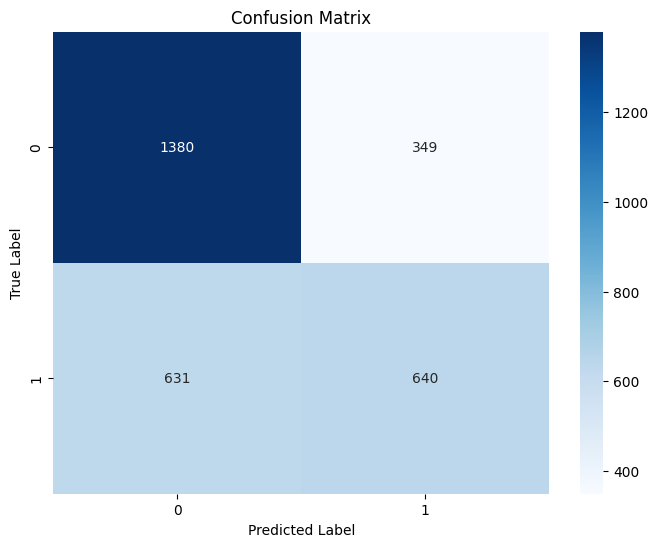

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt


dff_fas = pd.read_csv('/content/drive/MyDrive/projek_pemteks/WORD2VEC_WITHOUT_REMOVE_STOPWORDS.csv')
dff_fas
# Kolom fitur (dim_0 hingga dim_99)
X = dff_fas[[f'dim_{i}' for i in range(100)]]

# Kolom target (label)
y = dff_fas['label_score']

# Membagi data menjadi training dan testing set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Inisialisasi model
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)

# Melatih model
rf_model.fit(X_train, y_train)

# Evaluasi model
y_pred = rf_model.predict(X_test)

# Menampilkan classification report
print(classification_report(y_test, y_pred))

# Membuat dan menampilkan confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Visualisasi Confusion Matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=rf_model.classes_, yticklabels=rf_model.classes_)
plt.title("Confusion Matrix")
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()


### **RANDOM FOREST WITH DATA REMOVE STOPWORDS USE WORD2VEC**

              precision    recall  f1-score   support

           0       0.66      0.76      0.70      1729
           1       0.58      0.46      0.51      1271

    accuracy                           0.63      3000
   macro avg       0.62      0.61      0.61      3000
weighted avg       0.62      0.63      0.62      3000



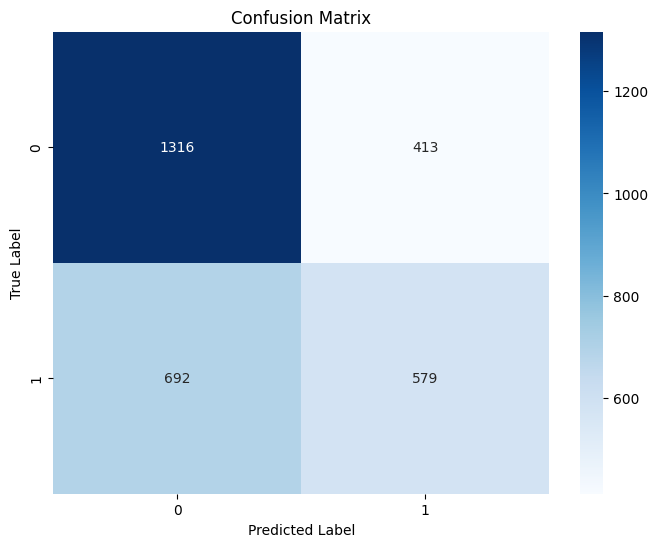

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
df_fas = pd.read_csv('/content/drive/MyDrive/projek_pemteks/WORD2VEC_WITH_REMOVE_STOPWORDS.csv')
df_fas
# Kolom fitur (dim_0 hingga dim_99)
X = df_fas[[f'dim_{i}' for i in range(100)]]

# Kolom target (label)
y = df_fas['label_score']

# Membagi data menjadi training dan testing set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Inisialisasi model
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)

# Melatih model
rf_model.fit(X_train, y_train)

# Evaluasi model
y_pred = rf_model.predict(X_test)

# Menampilkan classification report
print(classification_report(y_test, y_pred))

# Membuat dan menampilkan confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Visualisasi Confusion Matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=rf_model.classes_, yticklabels=rf_model.classes_)
plt.title("Confusion Matrix")
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()


### satu lagi

# **2.Labeling ke data Scrap**

## SCRAPPING

###CNN

In [ ]:
from datetime import datetime
import csv
import pandas as pd
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import re
import string
nltk.download('stopwords')
nltk.download('wordnet')
from sklearn.feature_extraction.text import TfidfVectorizer
hades = {'user-agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/106.0.0.0 Safari/537.36'}

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [ ]:
from datetime import datetime, timedelta
import requests as rs
from bs4 import BeautifulSoup as bs

# Inisialisasi list untuk menyimpan judul dan teks berita
list_tglberita = []
list_judulberita = []
list_teksberita = []
list_kategoriberita = []

# Tentukan tanggal awal dan akhir
start_date = datetime.strptime('2023/01/01', '%Y/%m/%d')
end_date = datetime.strptime('2023/12/31', '%Y/%m/%d')

# Loop setiap hari dalam rentang waktu
current_date = start_date
while current_date <= end_date and berita_terambil <= 4:
  berita_terambil = 0
# Format tanggal sesuai yang diperlukan URL
  formatted_date = current_date.strftime('%Y/%m/%d')

  for page in range(1, 2):
    url = f'https://www.cnnindonesia.com/indeks/2?date={formatted_date}'
    ge = rs.get(url).text
    soup = bs(ge, 'html.parser')

    # Temukan div yang berisi daftar artikel
    berita = soup.find('div', {'class': "flex flex-col gap-5"})

    if not berita:
      break
    # Ambil semua item artikel pada halaman
    berita_berita = berita.find_all('article', {"class": "flex-grow"})
    for i in berita_berita:
      if berita_terambil >= 4:  # Jika sudah 4 berita, hentikan pengambilan berita
        break
      link = i.find('a', href=True)
      judul_kategori = i.find("span", {"class": "flex-grow"})
      judul_berita = judul_kategori.find("h2").string # --------------------------------------judul
      kategori = judul_kategori.find("span" ,{"class" : "text-xs text-cnn_red"}).string #------------- kategori

      # Ambil konten lengkap berita
      href = link['href']
      response = rs.get(href).text
      article_soup = bs(response, 'html.parser')
      article_content = article_soup.find('div', {'class': 'detail-text text-cnn_black text-sm grow min-w-0'})
      if article_content:
        a = article_content.find_all('p')
        y  = [y.text for y in a]
        teks_berita = ''.join(y).replace('\n', '').replace('ADVERTISEMENT', "").replace("SCROLL TO CONTINUE WITH CONTENT",'').replace("[Gambas:Video CNN]","").replace("\r","")
      else:
        continue

      # Simpan judul dan teks berita ke dalam list

      list_tglberita.append(formatted_date)
      list_judulberita.append(judul_berita)
      list_teksberita.append(teks_berita)
      list_kategoriberita.append(kategori)

      berita_terambil += 1
    if berita_terambil >= 4:
      break

  current_date += timedelta(days=1)

print(len(list_tglberita))
print(len(list_judulberita))
print(len(list_teksberita))
print(len(list_kategoriberita))

data = {
    'tanggal': list_tglberita,
    'judul': list_judulberita,
    'teks': list_teksberita,
    'kategori': list_kategoriberita
}

df = pd.DataFrame(data)
df.to_csv("CNN.csv", index=False)



###Detikcom

In [ ]:
from datetime import datetime, timedelta
import requests as rs
from bs4 import BeautifulSoup as bs
import pandas as pd

# Inisialisasi variabel untuk menyimpan judul berita, teks berita, dan tanggal berita
listjudulberita = []
listteksberita = []
listtanggalberita = []

# Tentukan tanggal awal dan tanggal akhir
start_date = datetime.strptime('01/01/2023', '%m/%d/%Y')
end_date = datetime.strptime('12/31/2023', '%m/%d/%Y')

# Looping untuk setiap tanggal dalam rentang waktu tersebut
current_date = start_date
while current_date <= end_date:
    # Format tanggal sesuai dengan yang diperlukan URL
    formatted_date = current_date.strftime('%m/%d/%Y')
    berita_terkumpul = 0  # Counter untuk jumlah berita yang diambil per hari

    # Loop untuk setiap halaman (1 hingga 23)
    for page in range(1, 2):
        if berita_terkumpul >= 4:  # Batasi pengambilan berita per hari
            break

        url = f'https://news.detik.com/indeks/{page}?date={formatted_date}'
        ge = rs.get(url).text
        soup = bs(ge, 'html.parser')
        berita = soup.find_all('h3', {'class': "media__title"})

        # Ambil setiap judul berita dan tautannya
        for i in berita:
            if berita_terkumpul >= 4:  # Batasi pengambilan berita per hari
                break

            link = i.find('a', href=True)
            judul_berita = link.text.strip()
            href = link['href']
            response = rs.get(href)

            if response.status_code == 200:
                soup2 = bs(response.content, 'html.parser')
                quest1 = soup2.find("div", {"class": "detail__body-text itp_bodycontent"})
                quest2 = soup2.find("div", {"class": "detail__body-text"})

                if quest1:
                    quest_a = quest1.find_all("p")
                    y = [p.text for p in quest_a]
                    content_ = ''.join(y).replace('\n', '').replace('ADVERTISEMENT', '').replace('SCROLL TO CONTINUE WITH CONTENT', '')
                    listjudulberita.append(judul_berita)
                    listteksberita.append(content_)
                    listtanggalberita.append(formatted_date)
                    berita_terkumpul += 1
                    print(f"Berita tanggal {formatted_date}: {judul_berita}")

                elif quest2:
                    quest_b = quest2.find_all("p")
                    y = [p.text for p in quest_b]
                    content__ = ''.join(y).replace('\n', '').replace('ADVERTISEMENT', '').replace('SCROLL TO CONTINUE WITH CONTENT', '')
                    listjudulberita.append(judul_berita)
                    listteksberita.append(content__)
                    listtanggalberita.append(formatted_date)
                    berita_terkumpul += 1
                    print(f"Berita tanggal {formatted_date}: {judul_berita}")

    # Tambahkan 1 hari pada tanggal saat ini
    current_date += timedelta(days=1)
    print(f"Total berita pada {formatted_date}: {berita_terkumpul} berita\n")

# Buat DataFrame dan simpan ke CSV
data = {
    "tanggal_berita": listtanggalberita,
    "judul_berita": listjudulberita,
    "teks_berita": listteksberita,
}

df = pd.DataFrame(data)
df.to_csv("detikcoml.csv", index=False)

print("\nJudul Berita:")
print(listjudulberita)
print(f"Jumlah Total Judul Berita: {len(listjudulberita)}")

print("\nIsi Berita:")
print(listteksberita)
print(f"Jumlah Total Judul Berita: {len(listteksberita)}")

print("\nJudul Berita:")
print(listtanggalberita)
print(f"Jumlah Total Judul Berita: {len(listtanggalberita)}")

### kompas

In [ ]:
import requests
from bs4 import BeautifulSoup
import datetime
import pandas as pd

def ambil_artikel(article_url):
    response = requests.get(article_url)
    soup = BeautifulSoup(response.text, 'html.parser')

    read_content = soup.find('div', class_='read__content')
    if read_content:
        clearfix_div = read_content.find('div', class_='clearfix')
        if clearfix_div:
            paragraphs = clearfix_div.find_all('p')
            article_text = "\n".join([para.get_text(strip=True) for para in paragraphs])
            return article_text
    return "Isi berita tidak ditemukan"


def scrapes_3(date):
    url = f"https://indeks.kompas.com/terpopuler/?site=all&date={date}"
    response = requests.get(url)
    soup = BeautifulSoup(response.text, 'html.parser')

    articles = soup.find_all('div', class_='articleItem')

    details = []
    for article in articles[:4]:
        h2 = article.find('h2', class_='articleTitle')
        title = h2.get_text(strip=True) if h2 else "No title found"

        article_post = article.find('div', class_='articlePost')
        if article_post:
            category = article_post.find('div', class_='articlePost-subtitle')
            category = category.get_text(strip=True) if category else "No category found"

            date_div = article_post.find('div', class_='articlePost-date')
            date = date_div.get_text(strip=True) if date_div else "No date found"

        article_link = article.find('a', class_='article-link')
        article_url = article_link['href'] if article_link else ""
        article_content = ambil_artikel(article_url)

        details.append({
            "title": title,
            "category": category,
            "date": date,
            "content": article_content
        })

    return details

# Rentang tanggal
start_date = datetime.date(2023, 1, 1)
end_date = datetime.date(2023, 12, 31)

all_details = []

current_date = start_date
while current_date <= end_date:
    date_str = current_date.strftime('%Y-%m-%d')
    print(f"Judul berita untuk tanggal {date_str}:")

    details = scrapes_3(date_str)
    for detail in details:
        all_details.append(detail)

    # Lanjutkan ke tanggal berikutnya
    current_date += datetime.timedelta(days=1)

df = pd.DataFrame(all_details)
print(df)

df.to_csv('kompas_berita.csv', index=False, encoding='utf-8')
print("Data berhasil disimpan ke kompas_berita.csv")


### menggabungkan 3 file

In [ ]:
kompas = pd.read_csv('/content/drive/MyDrive/projek_pemteks/kompas_berita_yo.csv')
kompas["sumber"]="Kompas"

detikcom = pd.read_csv('/content/drive/MyDrive/projek_pemteks/detikcom.csv')
detikcom["sumber"]="Detikcom"

cnn = pd.read_csv('/content/drive/MyDrive/projek_pemteks/CNN.csv')
cnn["sumber"]="CNN"

In [ ]:
kompas.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 987 entries, 0 to 986
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   title     987 non-null    object
 1   category  987 non-null    object
 2   date      987 non-null    object
 3   content   987 non-null    object
 4   sumber    987 non-null    object
dtypes: object(5)
memory usage: 38.7+ KB


In [ ]:
detikcom.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 4 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   tanggal_berita  1460 non-null   object
 1   judul_berita    1460 non-null   object
 2   teks_berita     1459 non-null   object
 3   sumber          1460 non-null   object
dtypes: object(4)
memory usage: 45.8+ KB


In [ ]:
cnn.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1461 entries, 0 to 1460
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   tanggal   1461 non-null   object
 1   judul     1459 non-null   object
 2   teks      1418 non-null   object
 3   kategori  1459 non-null   object
 4   sumber    1461 non-null   object
dtypes: object(5)
memory usage: 57.2+ KB


In [ ]:
kompas.drop("category",axis=1,inplace=True)

In [ ]:
columns = ['date'] + [col for col in kompas.columns if col != 'date']
kompas = kompas[columns]

In [ ]:
detikcom.rename(columns={
    'tanggal_berita': 'date',
    'judul_berita': 'title',
    'teks_berita': 'content'
}, inplace=True)

In [ ]:
cnn.drop("kategori",axis=1,inplace=True)

In [ ]:
cnn.rename(columns={
    'tanggal': 'date',
    'judul': 'title',
    'teks': 'content'
}, inplace=True)

In [ ]:
kompas.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 987 entries, 0 to 986
Data columns (total 4 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   date     987 non-null    object
 1   title    987 non-null    object
 2   content  987 non-null    object
 3   sumber   987 non-null    object
dtypes: object(4)
memory usage: 31.0+ KB


In [ ]:
detikcom.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 4 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   date     1460 non-null   object
 1   title    1460 non-null   object
 2   content  1459 non-null   object
 3   sumber   1460 non-null   object
dtypes: object(4)
memory usage: 45.8+ KB


In [ ]:
cnn.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1461 entries, 0 to 1460
Data columns (total 4 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   date     1461 non-null   object
 1   title    1459 non-null   object
 2   content  1418 non-null   object
 3   sumber   1461 non-null   object
dtypes: object(4)
memory usage: 45.8+ KB


In [ ]:
gabungan = pd.concat([kompas, detikcom, cnn], ignore_index=True)

# Menyimpan hasil penggabungan ke file CSV
gabungan.to_csv('/content/drive/MyDrive/projek_pemteks/data_scrap.csv', index=False)


In [ ]:
data_srap = pd.read_csv('/content/drive/MyDrive/projek_pemteks/data_scrap.csv')
data_srap

,date,title,content,sumber
0,31/12/2022,Aturan Baru Sri Mulyani: Gaji Minimal Rp 5 Jut...,KOMPAS.com -Pemerintah dan DPR mengubah batas ...,Kompas
1,31/12/2022,Paus Benediktus XVI Meninggal Dunia di Usia 95...,"VATIKAN, KOMPAS.com -MantanPaus Benediktus XVI...",Kompas
2,31/12/2022,"Kondisi Indra Bekti Menurun, Penglihatan Kabur...","JAKARTA, KOMPAS.com -Adik presenterIndra Bekti...",Kompas
3,1/1/2023,Aldila Jelita Dikritik Usai Buka Donasi untuk ...,"JAKARTA, KOMPAS.com- Istri presenterIndra Bekt...",Kompas
4,1/1/2023,"Banjir Semarang Telan Korban Jiwa, Dua Mahasis...",KOMPAS.com- Dua mahasiswa tewas akibat terseng...,Kompas
...,...,...,...,...
3903,2023/12/30,15 Prajurit TNI Ditahan Usai Diduga Aniaya Rel...,Sebanyak 15 prajurit TNI ditahan buntut dugaan...,CNN
3904,2023/12/31,Istri Kesal Calon Anak Diberi Nama Seperti Kuc...,Nama adalah doa. Tak ayal semua orangtua pasti...,CNN
3905,2023/12/31,"RSUD Sumedang Retak Imbas Gempa M 4,8 di Malam...","Gempa bumi yang mengguncang Sumedang, Jawa Bar...",CNN
3906,2023/12/31,"Arsenal di Akhir 2023: Mimpi Posisi Satu, Terd...",Harapan Arsenal mengakhiri tahun 2023 di posis...,CNN


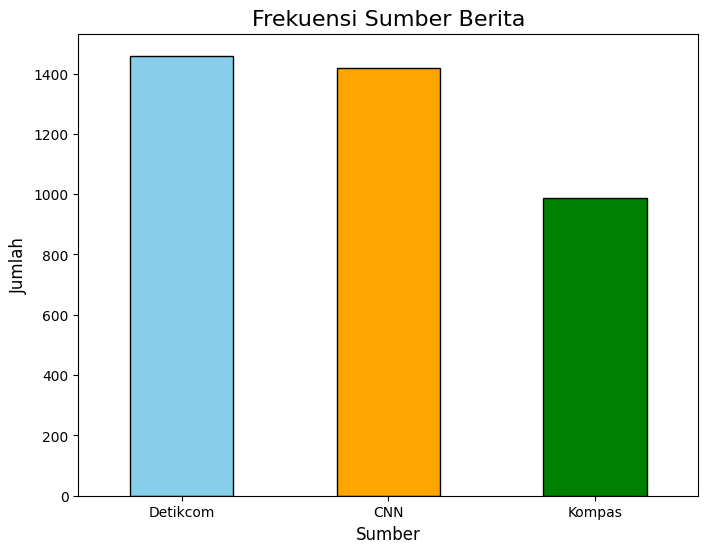

In [ ]:
import matplotlib.pyplot as plt

# Hitung frekuensi sumber
counts = data_srap['sumber'].value_counts()

# Plot diagram batang
plt.figure(figsize=(8, 6))
counts.plot(kind='bar', color=['skyblue', 'orange', 'green'], edgecolor='black')

# Tambahkan judul dan label
plt.title('Frekuensi Sumber Berita', fontsize=16)
plt.xlabel('Sumber', fontsize=12)
plt.ylabel('Jumlah', fontsize=12)

# Menambahkan legenda secara otomatis
plt.xticks(rotation=0)

# Tampilkan diagram
plt.show()

## PREPOSESING

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
data_srap = pd.read_csv('/content/drive/MyDrive/projek_pemteks/data_scrap.csv')
data_srap

,date,title,content,sumber
0,31/12/2022,Aturan Baru Sri Mulyani: Gaji Minimal Rp 5 Jut...,KOMPAS.com -Pemerintah dan DPR mengubah batas ...,Kompas
1,31/12/2022,Paus Benediktus XVI Meninggal Dunia di Usia 95...,"VATIKAN, KOMPAS.com -MantanPaus Benediktus XVI...",Kompas
2,31/12/2022,"Kondisi Indra Bekti Menurun, Penglihatan Kabur...","JAKARTA, KOMPAS.com -Adik presenterIndra Bekti...",Kompas
3,1/1/2023,Aldila Jelita Dikritik Usai Buka Donasi untuk ...,"JAKARTA, KOMPAS.com- Istri presenterIndra Bekt...",Kompas
4,1/1/2023,"Banjir Semarang Telan Korban Jiwa, Dua Mahasis...",KOMPAS.com- Dua mahasiswa tewas akibat terseng...,Kompas
...,...,...,...,...
3903,2023/12/30,15 Prajurit TNI Ditahan Usai Diduga Aniaya Rel...,Sebanyak 15 prajurit TNI ditahan buntut dugaan...,CNN
3904,2023/12/31,Istri Kesal Calon Anak Diberi Nama Seperti Kuc...,Nama adalah doa. Tak ayal semua orangtua pasti...,CNN
3905,2023/12/31,"RSUD Sumedang Retak Imbas Gempa M 4,8 di Malam...","Gempa bumi yang mengguncang Sumedang, Jawa Bar...",CNN
3906,2023/12/31,"Arsenal di Akhir 2023: Mimpi Posisi Satu, Terd...",Harapan Arsenal mengakhiri tahun 2023 di posis...,CNN


#### Cek Null

In [ ]:
data_srap.isna().sum()

,0
date,0
title,2
content,44
sumber,0


In [ ]:
baris_null = data_srap[data_srap.isna().any(axis=1)]
baris_null

,date,title,content,sumber
1156,02/12/2023,Tim Gegana Sisir PN Jaksel Jelang Sidang Vonis...,NaN,Detikcom
2464,2023/01/05,FOTO: Deretan Teknologi Canggih Pada Ajang CES...,NaN,CNN
2477,2023/01/08,FOTO: Warna-warni Dunia Es Harbin China ke-39,NaN,CNN
2483,2023/01/10,FOTO: Kacau Balau Ribuan Demonstran Serbu Band...,NaN,CNN
2491,2023/01/12,FOTO: Ngeri Rusuh Peru sampai Polisi Dibakar H...,NaN,CNN
2629,2023/02/15,FOTO: Kedai Kuno Berusia Nyaris 5.000 Tahun Di...,NaN,CNN
2634,2023/02/16,FOTO: Israel Gunakan Robot untuk Percepat Bela...,NaN,CNN
2684,2023/03/01,FOTO: Robot Anjing Curi Perhatian Pengunjung M...,NaN,CNN
2715,2023/03/09,FOTO: India Rayakan Festival Holi dengan 'Pera...,NaN,CNN
2737,2023/03/14,FOTO: Luluh Lantak Malawi-Mozambik Diterjang T...,NaN,CNN


In [ ]:
data_srap.dropna(inplace=True)

#### menyamakan format kolom date

In [ ]:
import pandas as pd

def convert_datetime(value):
    if pd.isna(value):
        return pd.NaT
    for fmt in ( '%m/%d/%Y', '%Y/%m/%d', '%d/%m/%Y'):
        try:
            return pd.to_datetime(value, format=fmt, errors='raise')
        except ValueError:
            continue
    print(f"Gagal mengonversi: {value}")
    return pd.NaT

# Mengonversi kolom 'date' ke format datetime dengan fungsi di atas
data_srap['date_convert'] = data_srap['date'].apply(convert_datetime)


In [ ]:
data_srap[['date', 'date_convert']]


,date,date_convert
0,31/12/2022,2022-12-31
1,31/12/2022,2022-12-31
2,31/12/2022,2022-12-31
3,1/1/2023,2023-01-01
4,1/1/2023,2023-01-01
...,...,...
3903,2023/12/30,2023-12-30
3904,2023/12/31,2023-12-31
3905,2023/12/31,2023-12-31
3906,2023/12/31,2023-12-31


In [ ]:
data_srap.drop("date",axis=1,inplace=True)

In [ ]:
data_srap.to_csv("/content/drive/MyDrive/projek_pemteks/data_scrap_prepos.csv", index=False)


In [ ]:
data_srap

,title,content,sumber,date_convert
0,Aturan Baru Sri Mulyani: Gaji Minimal Rp 5 Jut...,KOMPAS.com -Pemerintah dan DPR mengubah batas ...,Kompas,2022-12-31
1,Paus Benediktus XVI Meninggal Dunia di Usia 95...,"VATIKAN, KOMPAS.com -MantanPaus Benediktus XVI...",Kompas,2022-12-31
2,"Kondisi Indra Bekti Menurun, Penglihatan Kabur...","JAKARTA, KOMPAS.com -Adik presenterIndra Bekti...",Kompas,2022-12-31
3,Aldila Jelita Dikritik Usai Buka Donasi untuk ...,"JAKARTA, KOMPAS.com- Istri presenterIndra Bekt...",Kompas,2023-01-01
4,"Banjir Semarang Telan Korban Jiwa, Dua Mahasis...",KOMPAS.com- Dua mahasiswa tewas akibat terseng...,Kompas,2023-01-01
...,...,...,...,...
3903,15 Prajurit TNI Ditahan Usai Diduga Aniaya Rel...,Sebanyak 15 prajurit TNI ditahan buntut dugaan...,CNN,2023-12-30
3904,Istri Kesal Calon Anak Diberi Nama Seperti Kuc...,Nama adalah doa. Tak ayal semua orangtua pasti...,CNN,2023-12-31
3905,"RSUD Sumedang Retak Imbas Gempa M 4,8 di Malam...","Gempa bumi yang mengguncang Sumedang, Jawa Bar...",CNN,2023-12-31
3906,"Arsenal di Akhir 2023: Mimpi Posisi Satu, Terd...",Harapan Arsenal mengakhiri tahun 2023 di posis...,CNN,2023-12-31


#### steming + NO REMOVE stopword

In [ ]:
!pip install Sastrawi

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 209.7/209.7 kB 4.1 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import re
import string
from Sastrawi.Stemmer.StemmerFactory import StemmerFactory

# Stemming
factory = StemmerFactory()
stemmer = factory.create_stemmer()

# Clean
def clean_teks(text):
    if pd.isnull(text):
        return ''

    text = text.lower()  # Mengubah teks menjadi huruf kecil
    text = re.sub(r'\d+', '', text)  # Menghapus angka
    text = re.sub(r'[^\x00-\x7f]', r' ', text)  # Menghapus karakter non-ASCII
    text = text.translate(str.maketrans(string.punctuation, ' ' * len(string.punctuation)))  # Menghapus tanda baca
    text = re.sub(r'(.)\1+', r'\1\1', text)  # Menghapus karakter yang berulang
    tokens = text.split()  # Memisahkan teks menjadi token (kata)
    processed_tokens = [stemmer.stem(word) for word in tokens]  # Melakukan stemming pada setiap kata
    return ' '.join(processed_tokens)  # Menggabungkan kembali kata-kata yang sudah diproses menjadi satu string

data_srap = pd.read_csv('/content/drive/MyDrive/projek_pemteks/data_scrap_prepos.csv')

data_srap['title_clean'] = data_srap['title'].apply(clean_teks)


data_srap.to_csv("/content/drive/MyDrive/projek_pemteks/data_scrap_no_remove_stopword.csv", index=False)

data_srap.head()


,title,content,sumber,date_convert,title_clean
0,Aturan Baru Sri Mulyani: Gaji Minimal Rp 5 Jut...,KOMPAS.com -Pemerintah dan DPR mengubah batas ...,Kompas,2022-12-31,atur baru sri mulyani gaji minimal rp juta ken...
1,Paus Benediktus XVI Meninggal Dunia di Usia 95...,"VATIKAN, KOMPAS.com -MantanPaus Benediktus XVI...",Kompas,2022-12-31,paus benediktus xvi tinggal dunia di usia tahun
2,"Kondisi Indra Bekti Menurun, Penglihatan Kabur...","JAKARTA, KOMPAS.com -Adik presenterIndra Bekti...",Kompas,2022-12-31,kondisi indra bekti turun lihat kabur dan tens...
3,Aldila Jelita Dikritik Usai Buka Donasi untuk ...,"JAKARTA, KOMPAS.com- Istri presenterIndra Bekt...",Kompas,2023-01-01,aldila jelita kritik usai buka donasi untuk bi...
4,"Banjir Semarang Telan Korban Jiwa, Dua Mahasis...",KOMPAS.com- Dua mahasiswa tewas akibat terseng...,Kompas,2023-01-01,banjir semarang telan korban jiwa dua mahasisw...


In [ ]:
data_srap

,title,content,sumber,date_convert,title_clean
0,Aturan Baru Sri Mulyani: Gaji Minimal Rp 5 Jut...,KOMPAS.com -Pemerintah dan DPR mengubah batas ...,Kompas,2022-12-31,atur baru sri mulyani gaji minimal rp juta ken...
1,Paus Benediktus XVI Meninggal Dunia di Usia 95...,"VATIKAN, KOMPAS.com -MantanPaus Benediktus XVI...",Kompas,2022-12-31,paus benediktus xvi tinggal dunia di usia tahun
2,"Kondisi Indra Bekti Menurun, Penglihatan Kabur...","JAKARTA, KOMPAS.com -Adik presenterIndra Bekti...",Kompas,2022-12-31,kondisi indra bekti turun lihat kabur dan tens...
3,Aldila Jelita Dikritik Usai Buka Donasi untuk ...,"JAKARTA, KOMPAS.com- Istri presenterIndra Bekt...",Kompas,2023-01-01,aldila jelita kritik usai buka donasi untuk bi...
4,"Banjir Semarang Telan Korban Jiwa, Dua Mahasis...",KOMPAS.com- Dua mahasiswa tewas akibat terseng...,Kompas,2023-01-01,banjir semarang telan korban jiwa dua mahasisw...
...,...,...,...,...,...
3858,15 Prajurit TNI Ditahan Usai Diduga Aniaya Rel...,Sebanyak 15 prajurit TNI ditahan buntut dugaan...,CNN,2023-12-30,prajurit tni tahan usai duga aniaya rawan ganj...
3859,Istri Kesal Calon Anak Diberi Nama Seperti Kuc...,Nama adalah doa. Tak ayal semua orangtua pasti...,CNN,2023-12-31,istri kesal calon anak beri nama seperti kucin...
3860,"RSUD Sumedang Retak Imbas Gempa M 4,8 di Malam...","Gempa bumi yang mengguncang Sumedang, Jawa Bar...",CNN,2023-12-31,rsud sumedang retak imbas gempa m di malam tah...
3861,"Arsenal di Akhir 2023: Mimpi Posisi Satu, Terd...",Harapan Arsenal mengakhiri tahun 2023 di posis...,CNN,2023-12-31,arsenal di akhir mimpi posisi satu dampar di p...


In [ ]:
data_srap.drop("title_clean",axis=1,inplace=True)

In [ ]:
data_srap

,title,content,sumber,date_convert
0,Aturan Baru Sri Mulyani: Gaji Minimal Rp 5 Jut...,KOMPAS.com -Pemerintah dan DPR mengubah batas ...,Kompas,2022-12-31
1,Paus Benediktus XVI Meninggal Dunia di Usia 95...,"VATIKAN, KOMPAS.com -MantanPaus Benediktus XVI...",Kompas,2022-12-31
2,"Kondisi Indra Bekti Menurun, Penglihatan Kabur...","JAKARTA, KOMPAS.com -Adik presenterIndra Bekti...",Kompas,2022-12-31
3,Aldila Jelita Dikritik Usai Buka Donasi untuk ...,"JAKARTA, KOMPAS.com- Istri presenterIndra Bekt...",Kompas,2023-01-01
4,"Banjir Semarang Telan Korban Jiwa, Dua Mahasis...",KOMPAS.com- Dua mahasiswa tewas akibat terseng...,Kompas,2023-01-01
...,...,...,...,...
3903,15 Prajurit TNI Ditahan Usai Diduga Aniaya Rel...,Sebanyak 15 prajurit TNI ditahan buntut dugaan...,CNN,2023-12-30
3904,Istri Kesal Calon Anak Diberi Nama Seperti Kuc...,Nama adalah doa. Tak ayal semua orangtua pasti...,CNN,2023-12-31
3905,"RSUD Sumedang Retak Imbas Gempa M 4,8 di Malam...","Gempa bumi yang mengguncang Sumedang, Jawa Bar...",CNN,2023-12-31
3906,"Arsenal di Akhir 2023: Mimpi Posisi Satu, Terd...",Harapan Arsenal mengakhiri tahun 2023 di posis...,CNN,2023-12-31


#### steming + REMOVE STOP WORD

In [ ]:
!pip install Sastrawi

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 209.7/209.7 kB 3.2 MB/s eta 0:00:00


In [ ]:
from Sastrawi.Stemmer.StemmerFactory import StemmerFactory
from Sastrawi.StopWordRemover.StopWordRemoverFactory import StopWordRemoverFactory
import pandas as pd
import re
import string
factory = StemmerFactory()
stemmer = factory.create_stemmer()
stopword_factory = StopWordRemoverFactory()
stop_words = set(stopword_factory.get_stop_words())

def clean_teks(text):
    if pd.isnull(text):
        return ''

    text = text.lower()
    text = re.sub(r'\d+', '', text)
    text = re.sub(r'[^\x00-\x7f]', r' ', text)
    text = text.translate(str.maketrans(string.punctuation, ' ' * len(string.punctuation)))
    text = re.sub(r'(.)\1+', r'\1\1', text)
    tokens = text.split()
    processed_tokens = [stemmer.stem(word) for word in tokens if word not in stop_words]
    return ' '.join(processed_tokens)

data_scrap = pd.read_csv('/content/drive/MyDrive/projek_pemteks/data_scrap.csv').dropna()
data_scrap['title_clean_removestopword'] = data_scrap['title'].apply(clean_teks)

data_scrap.to_csv("/content/drive/MyDrive/projek_pemteks/data_scrap_remove_stopword.csv", index=False)

# df_scrap.head()



In [ ]:
df_scrap_remove_stopword=pd.read_csv('/content/drive/MyDrive/projek_pemteks/data_scrap_remove_stopword.csv')
df_scrap_remove_stopword['title_clean_removestopword'][1]

'paus benediktus xvi tinggal dunia usia tahun'

In [ ]:
df_scrap_no_remove=pd.read_csv('/content/drive/MyDrive/projek_pemteks/data_scrap_no_remove_stopword.csv')
df_scrap_no_remove['title_clean'][1]

'paus benediktus xvi tinggal dunia di usia tahun'

In [ ]:
from joblib import load
load_model = load('/content/drive/MyDrive/projek_pemteks/RANDOM_FOREST_WITH_OUT_DATA_REMOVE_STOPWORDS_USE_TF_IDF.joblib')

In [ ]:
model =load_model['model']
tfidfvektor = load_model['TFIDF']

## Fitur Enginering

In [ ]:
df_scrap_no_remove=pd.read_csv('/content/drive/MyDrive/projek_pemteks/data_scrap_no_remove_stopword.csv')


In [ ]:

df_scrap_no_remove['title_length'] = df_scrap_no_remove['title_clean'].apply(lambda x: len(x.split()))
df_scrap_no_remove['exclamation_count'] = df_scrap_no_remove['title'].apply(lambda x: x.count('!'))
clickbait_words = [
    'heboh', 'wow', 'viral', 'tak disangka', 'terungkap', 'terheboh', 'membingungkan', 'membuat geger',
    'kamu harus tahu', 'kamu tidak akan percaya', 'rahasia', 'terbaru', 'terbaik', 'paling banyak dicari',
    'luar biasa', 'mengejutkan', 'misteri', 'paling hits', 'tidak terduga', 'mengungkap', 'fenomena',
    'apakah kamu siap', 'tak terbayangkan', 'mustahil', 'berita panas', 'selama ini', 'inilah yang terjadi',
    'akhirnya terungkap', 'bagaimana caranya', 'cara mudah', 'baca sebelum terlambat', 'bikin kaget',
    'harus kamu ketahui', 'terbaru di internet', 'berita sensasional', 'inilah faktanya', 'dulu tidak percaya',
    'wah', 'baru', 'terbaik', 'tidak boleh dilewatkan', 'muncul dengan', 'terungkap akhirnya', 'yang jarang diketahui',
    'sungguh', 'sesuatu yang tidak pernah dibayangkan', 'sedang ramai dibicarakan', 'gila', 'tidak akan kamu duga',
    'tidak masuk akal', 'pasti kamu tidak tahu', 'ketahui sekarang', 'lihat apa yang terjadi', 'baca selengkapnya',
    'mustahil namun benar', 'tidak percaya? buktikan sendiri', 'ini yang sebenarnya terjadi'
]
df_scrap_no_remove['capital_ratio'] = df_scrap_no_remove['title'].apply(lambda x: sum(1 for c in x if c.isupper()) / max(len(x), 1))
df_scrap_no_remove['clickbait_word_count'] = df_scrap_no_remove['title_clean'].apply(lambda x: sum(1 for word in clickbait_words if word in x))
df_scrap_no_remove['has_number'] = df_scrap_no_remove['title'].str.contains(r'\d').astype(int)

X_test_tfidf = tfidfvektor.transform(df_scrap_no_remove['title_clean'])

tfidf_test_df = pd.DataFrame(X_test_tfidf.toarray(), columns=tfidfvektor.get_feature_names_out())

additional_features_test = df_scrap_no_remove[['title_length', 'exclamation_count', 'capital_ratio', 'clickbait_word_count', 'has_number']]
final_test_features = pd.concat([tfidf_test_df, additional_features_test.reset_index(drop=True)], axis=1)

final_test_features.to_csv("/content/drive/MyDrive/projek_pemteks/data_scrap_final_features_nonstopwords.csv", index=False)

print(final_test_features.head())


    aa  aachen  aaji  aaliyah  aap  aaron  abad  abadi  abah  abai  ...  \
0  0.0     0.0   0.0      0.0  0.0    0.0   0.0    0.0   0.0   0.0  ...   
1  0.0     0.0   0.0      0.0  0.0    0.0   0.0    0.0   0.0   0.0  ...   
2  0.0     0.0   0.0      0.0  0.0    0.0   0.0    0.0   0.0   0.0  ...   
3  0.0     0.0   0.0      0.0  0.0    0.0   0.0    0.0   0.0   0.0  ...   
4  0.0     0.0   0.0      0.0  0.0    0.0   0.0    0.0   0.0   0.0  ...   

   zulkifli  zumba  zun  zylgwyn  zylvechia  title_length  exclamation_count  \
0       0.0    0.0  0.0      0.0        0.0            11                  0   
1       0.0    0.0  0.0      0.0        0.0             8                  0   
2       0.0    0.0  0.0      0.0        0.0            10                  0   
3       0.0    0.0  0.0      0.0        0.0            13                  0   
4       0.0    0.0  0.0      0.0        0.0            13                  0   

   capital_ratio  clickbait_word_count  has_number  
0       0.16417

## Modeling Menggunakan RANDOM FOREST WITHOUT DATA REMOVE STOPWORDS USE TF IDF

In [ ]:
X_scrape_tfidf = pd.read_csv('/content/drive/MyDrive/projek_pemteks/data_scrap_final_features_nonstopwords.csv')
dff1 = pd.read_csv('/content/drive/MyDrive/projek_pemteks/data_scrap_no_remove_stopword.csv')

y_pred_scrape = model.predict(X_scrape_tfidf)

dff1['prediksi_label'] = y_pred_scrape

dff1['prediksi_label_text'] = dff1['prediksi_label'].map({0: 'non-clickbait', 1: 'clickbait'})

dff1.to_csv('/content/drive/MyDrive/projek_pemteks/hasil_prediksi_scraping_rf_tfidf_no_remove_stopword.csv', index=False)


<ipython-input-44-a13c1c704770>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=label_counts.index, y=label_counts.values, palette="viridis")


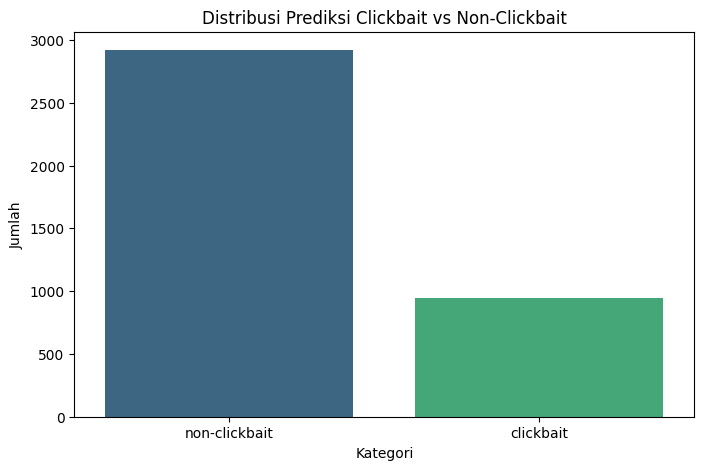

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

label_counts = dff1['prediksi_label_text'].value_counts()
plt.figure(figsize=(8, 5))
sns.barplot(x=label_counts.index, y=label_counts.values, palette="viridis")
plt.title('Distribusi Prediksi Clickbait vs Non-Clickbait')
plt.xlabel('Kategori')
plt.ylabel('Jumlah')
plt.show()


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [76]:
data_berlabel = pd.read_csv('/content/drive/MyDrive/projek_pemteks/hasil_prediksi_scraping_rf_tfidf_no_remove_stopword.csv')
data_berlabel.head()

,title,content,sumber,date_convert,title_clean,prediksi_label,prediksi_label_text
0,Aturan Baru Sri Mulyani: Gaji Minimal Rp 5 Jut...,KOMPAS.com -Pemerintah dan DPR mengubah batas ...,Kompas,2022-12-31,atur baru sri mulyani gaji minimal rp juta ken...,0,non-clickbait
1,Paus Benediktus XVI Meninggal Dunia di Usia 95...,"VATIKAN, KOMPAS.com -MantanPaus Benediktus XVI...",Kompas,2022-12-31,paus benediktus xvi tinggal dunia di usia tahun,0,non-clickbait
2,"Kondisi Indra Bekti Menurun, Penglihatan Kabur...","JAKARTA, KOMPAS.com -Adik presenterIndra Bekti...",Kompas,2022-12-31,kondisi indra bekti turun lihat kabur dan tens...,0,non-clickbait
3,Aldila Jelita Dikritik Usai Buka Donasi untuk ...,"JAKARTA, KOMPAS.com- Istri presenterIndra Bekt...",Kompas,2023-01-01,aldila jelita kritik usai buka donasi untuk bi...,1,clickbait
4,"Banjir Semarang Telan Korban Jiwa, Dua Mahasis...",KOMPAS.com- Dua mahasiswa tewas akibat terseng...,Kompas,2023-01-01,banjir semarang telan korban jiwa dua mahasisw...,0,non-clickbait


<ipython-input-5-78685072fbf7>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  clickbait_data['month'] = clickbait_data['date_convert'].dt.month_name()


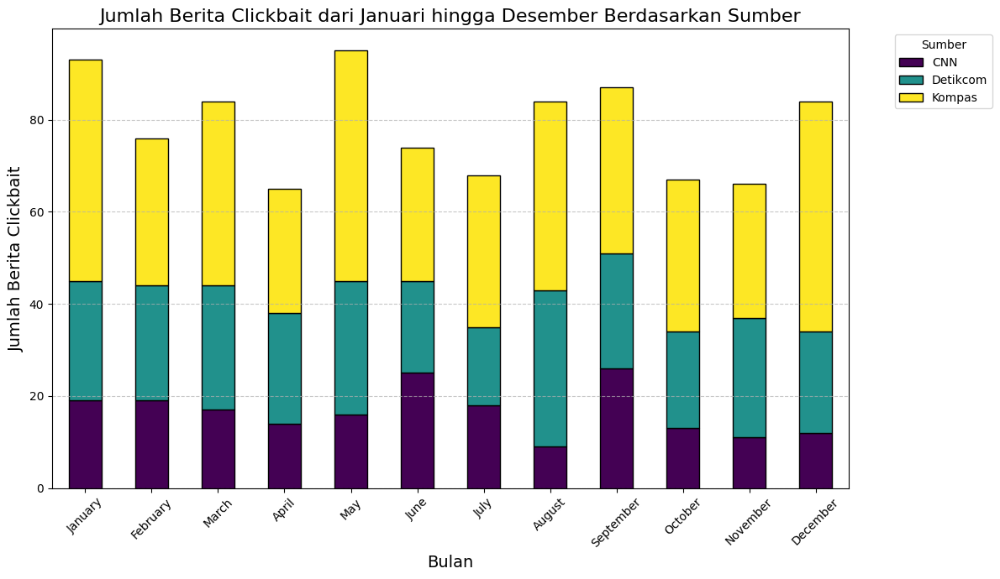

In [5]:
import pandas as pd
import matplotlib.pyplot as plt

# Baca data
data_berlabel = pd.read_csv('/content/drive/MyDrive/projek_pemteks/hasil_prediksi_scraping_rf_tfidf_no_remove_stopword.csv')

# Konversi kolom tanggal menjadi date_converttime
data_berlabel['date_convert'] = pd.to_datetime(data_berlabel['date_convert'], format='%Y-%m-%d')

# Filter data untuk berita dengan label clickbait
clickbait_data = data_berlabel[data_berlabel['prediksi_label_text'] == 'clickbait']

# Buat kolom bulan (nama bulan) berdasarkan tanggal
clickbait_data['month'] = clickbait_data['date_convert'].dt.month_name()

# Hitung jumlah berita clickbait per bulan untuk setiap sumber
monthly_clickbait_source = clickbait_data.groupby(['month', 'sumber']).size().unstack(fill_value=0)

# Urutkan data berdasarkan urutan bulan (Januari hingga Desember)
month_order = ['January', 'February', 'March', 'April', 'May', 'June',
               'July', 'August', 'September', 'October', 'November', 'December']
monthly_clickbait_source = monthly_clickbait_source.reindex(month_order)

# Visualisasi data
monthly_clickbait_source.plot(kind='bar', stacked=True, figsize=(12, 7), colormap='viridis', edgecolor='black')

plt.title('Jumlah Berita Clickbait dari Januari hingga Desember Berdasarkan Sumber', fontsize=16)
plt.xlabel('Bulan', fontsize=14)
plt.ylabel('Jumlah Berita Clickbait', fontsize=14)
plt.xticks(rotation=45)
plt.legend(title='Sumber', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


prediksi_label_text  clickbait  non-clickbait
sumber                                       
CNN                        199           1218
Detikcom                   296           1163
Kompas                     448            539


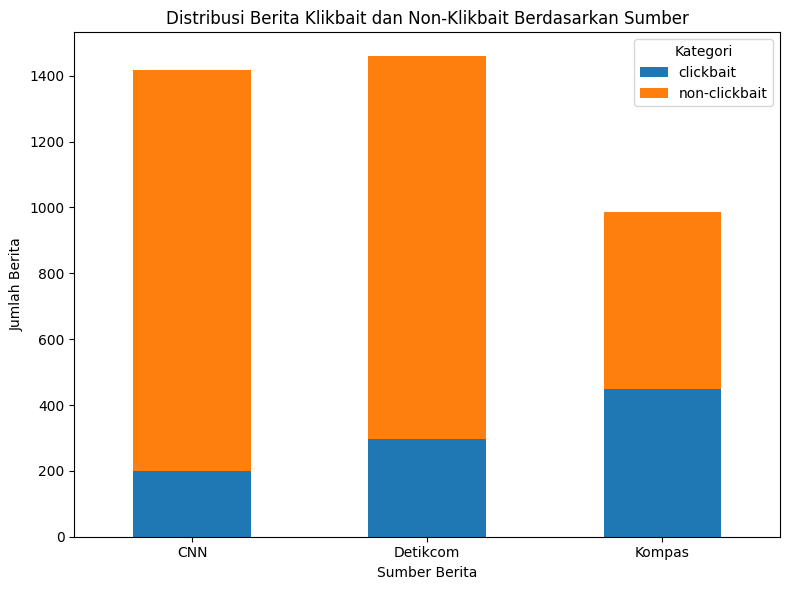

In [ ]:
# Menghitung jumlah berita klikbait dan non-klikbait per sumber
summary = data_berlabel.groupby(['sumber', 'prediksi_label_text']).size().unstack(fill_value=0)
print(summary)
# Membuat bar chart
summary.plot(kind='bar', stacked=True, figsize=(8, 6))

# Menambahkan judul dan label
plt.title('Distribusi Berita Klikbait dan Non-Klikbait Berdasarkan Sumber')
plt.xlabel('Sumber Berita')
plt.ylabel('Jumlah Berita')
plt.legend(title='Kategori')
plt.xticks(rotation=0)

# Menampilkan grafik
plt.tight_layout()
plt.show()



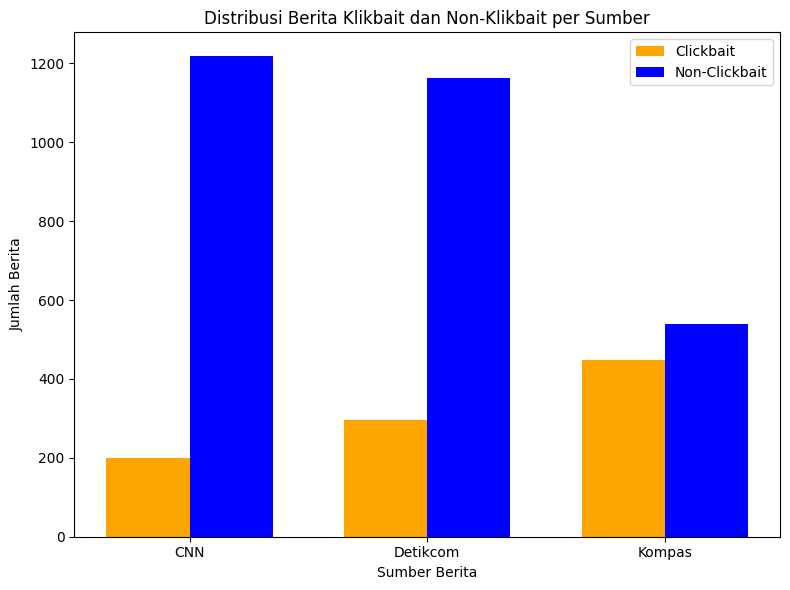

In [ ]:
# Menyiapkan data untuk visualisasi
categories = summary.columns  # ['clickbait', 'non-clickbait']
sources = summary.index  # ['Kompas', ...]
x = np.arange(len(sources))  # Posisi untuk sumber berita
width = 0.35  # Lebar bar

# Membuat grouped bar chart
fig, ax = plt.subplots(figsize=(8, 6))

# Bar untuk setiap kategori
bar1 = ax.bar(x - width/2, summary['clickbait'], width, label='Clickbait', color='orange')
bar2 = ax.bar(x + width/2, summary['non-clickbait'], width, label='Non-Clickbait', color='blue')

# Menambahkan label, judul, dan legenda
ax.set_xlabel('Sumber Berita')
ax.set_ylabel('Jumlah Berita')
ax.set_title('Distribusi Berita Klikbait dan Non-Klikbait per Sumber')
ax.set_xticks(x)
ax.set_xticklabels(sources)
ax.legend()

# Menampilkan grafik
plt.tight_layout()
plt.show()


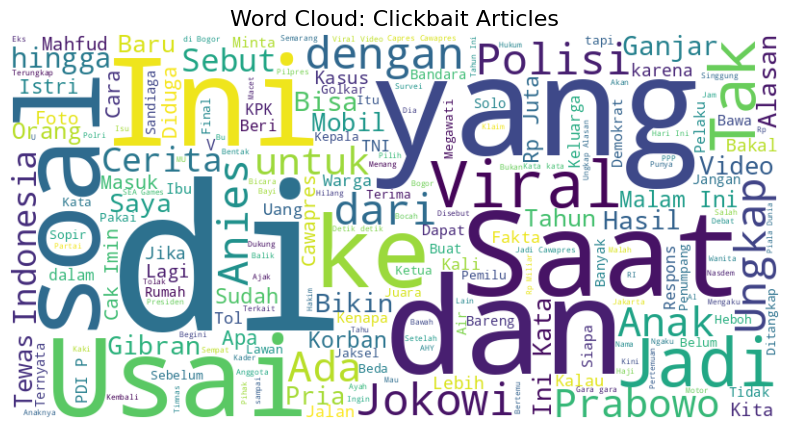

In [ ]:
from wordcloud import WordCloud

clickbait_text = ' '.join(dff1[dff1['prediksi_label_text'] == 'clickbait']['title'])
wordcloud_clickbait = WordCloud(width=800, height=400, background_color='white', colormap='viridis').generate(clickbait_text)
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud_clickbait, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud: Clickbait Articles', fontsize=16)
plt.show()




In [79]:
# Filter judul yang mengandung kata kunci clickbait
clickbait_titles = data_berlabel[data_berlabel['prediksi_label_text'] == 'clickbait']['title']


# Tampilkan judul clickbait yang benar-benar terlihat clickbait
print("Judul yang benar-benar terlihat Clickbait:")
for i, title in enumerate(clickbait_titles[:10], 1):  # Batasi hanya 10 judul
    print(f"{i}. {title}")


Judul yang benar-benar terlihat Clickbait:
1. Korban Pembunuhan Berantai di Cianjur Sudah Lama Hilang, Kenapa Baru Terungkap?
2. Identitas Prajurit Gadungan yang Ajak Wanita Foto Studio Terungkap, TNI: Domisili Bandung
3. Terungkap Alasan Pria Buka Pintu Darurat Asiana Airlines saat Penerbangan
4. Warganet Mengeluh Nomor Pribadinya Dijadikan Kontak Darurat Pinjol, Ini Saran OJK
5. Terungkap, Bayi Tertukar di Bogor karena Gelang Dipasangkan Suster Rumah Sakit Dobel
6. Bocah di Ponorogo 3 Hari Tinggal dengan Jenazah Ibu, Terungkap Saat Tetangga Terima WA
7. Terungkap! Dekan FMIPA Unila Pakai APBN untuk Beri THR Eks Rektor Karomani
8. Anies Baswedan: Kalau di Survei Nomor 3 Buat Apa Dijegal?
9. Terungkap! Fredrich Yunadi Sudah Bebas dari Penjara
10. Siksa Kubur Rampung Syuting, Aksi Reza Rahadian Terungkap


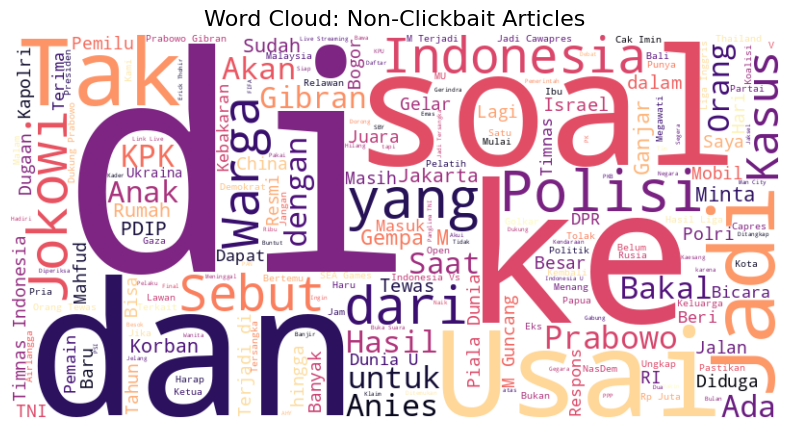

In [ ]:
non_clickbait_text = ' '.join(dff1[dff1['prediksi_label_text'] == 'non-clickbait']['title'])
wordcloud_non_clickbait = WordCloud(width=800, height=400, background_color='white', colormap='magma').generate(non_clickbait_text)
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud_non_clickbait, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud: Non-Clickbait Articles', fontsize=16)
plt.show()

In [80]:
# Filter judul yang mengandung kata kunci non-clickbait
non_clickbait_titles = data_berlabel[data_berlabel['prediksi_label_text'] != 'clickbait']['title']

# Tampilkan 10 judul berita non-clickbait
print("Top 10 Judul Berita Non-Clickbait dengan Keyword:")
for i, title in enumerate(non_clickbait_titles[:10], 1):  # Batasi hanya 10 judul
    print(f"{i}. {title}")


Top 10 Judul Berita Non-Clickbait dengan Keyword:
1. Aturan Baru Sri Mulyani: Gaji Minimal Rp 5 Juta Kena Pajak 5 Persen
2. Beda Perlakuan Polisi terhadap Kasus Kecelakaan yang Tewaskan Mahasiswa UI, Hasya dan Annisa
3. Kapolri Sebut Tidak Ada Orang yang Disandera di Kasus Pesawat Susi Air
4. Bareskrim Tetapkan 9 Tersangka Kasus "Robot Trading" Net89, 1 Meninggal, 2 DPO
5. Dukung Anies Capres, Amien Rais Doakan Prabowo jadi Presiden
6. Profil Lengkap Rafael Trisambodo, PNS Pajak Berharta Rp 56 Miliar
7. Kemenkeu Tolak Pengunduran Diri Rafael Alun dari ASN Ditjen Pajak
8. AG, Pacar Mario, Ditetapkan sebagai Pelaku Kasus Penganiayaan D
9. Surya Paloh Pastikan Anies Baswedan Lanjutkan Pembangunan Era Jokowi jika Terpilih Jadi Presiden
10. Buntut Kasus Rafael Alun Trisambodo, Kepala Bea dan Cukai Makassar Diperiksa Kemenkeu, Miliki Harta Rp 13,7 Miliar


# TES CLUSTERING

## LANGSUNG clustering no remove stop word

In [ ]:
data_hasil = pd.read_csv('/content/drive/MyDrive/projek_pemteks/hasil_prediksi_scraping_rf_tfidf_no_remove_stopword.csv')
data_hasil.head()

,title,content,sumber,date_convert,title_clean,prediksi_label,prediksi_label_text
0,Aturan Baru Sri Mulyani: Gaji Minimal Rp 5 Jut...,KOMPAS.com -Pemerintah dan DPR mengubah batas ...,Kompas,2022-12-31,atur baru sri mulyani gaji minimal rp juta ken...,0,non-clickbait
1,Paus Benediktus XVI Meninggal Dunia di Usia 95...,"VATIKAN, KOMPAS.com -MantanPaus Benediktus XVI...",Kompas,2022-12-31,paus benediktus xvi tinggal dunia di usia tahun,0,non-clickbait
2,"Kondisi Indra Bekti Menurun, Penglihatan Kabur...","JAKARTA, KOMPAS.com -Adik presenterIndra Bekti...",Kompas,2022-12-31,kondisi indra bekti turun lihat kabur dan tens...,0,non-clickbait
3,Aldila Jelita Dikritik Usai Buka Donasi untuk ...,"JAKARTA, KOMPAS.com- Istri presenterIndra Bekt...",Kompas,2023-01-01,aldila jelita kritik usai buka donasi untuk bi...,1,clickbait
4,"Banjir Semarang Telan Korban Jiwa, Dua Mahasis...",KOMPAS.com- Dua mahasiswa tewas akibat terseng...,Kompas,2023-01-01,banjir semarang telan korban jiwa dua mahasisw...,0,non-clickbait


In [ ]:
# Inisialisasi dan fit-transform TF-IDF
tfidfvektor = TfidfVectorizer()
tfidfmetrik = tfidfvektor.fit_transform(data_hasil['title_clean'].to_list())
fitur = tfidfvektor.get_feature_names_out()
tfidf_df = pd.DataFrame(tfidfmetrik.toarray(), columns=fitur)
tfidf_df.to_csv("/content/drive/MyDrive/projek_pemteks/TFIDF_Result_scrap_no_remove.csv", index=False)


KMeans with k=2
Silhouette Score: 0.0030052165486019883
SSE: 3814.7480388932854

KMeans with k=3
Silhouette Score: 0.004055100747460554
SSE: 3802.145805100735

KMeans with k=4
Silhouette Score: 0.004205769901277869
SSE: 3787.983064406107

KMeans with k=5
Silhouette Score: 0.005743279364559346
SSE: 3773.381395086399

KMeans with k=6
Silhouette Score: 0.006048531012903956
SSE: 3764.2774133342264

KMeans with k=7
Silhouette Score: 0.0070304547655765425
SSE: 3753.457503381287

KMeans with k=8
Silhouette Score: 0.007098631666269587
SSE: 3748.8685532028353

KMeans with k=9
Silhouette Score: 0.007209590371858666
SSE: 3741.5299128460874

KMeans with k=10
Silhouette Score: 0.007065439289614261
SSE: 3736.4394878077433

KMeans with k=11
Silhouette Score: 0.00778527274077881
SSE: 3724.2538556170334

KMeans with k=12
Silhouette Score: 0.008357984133274371
SSE: 3716.596360007859

KMeans with k=13
Silhouette Score: 0.008799879246778433
SSE: 3715.7928483765268

KMeans with k=14
Silhouette Score: 0.008

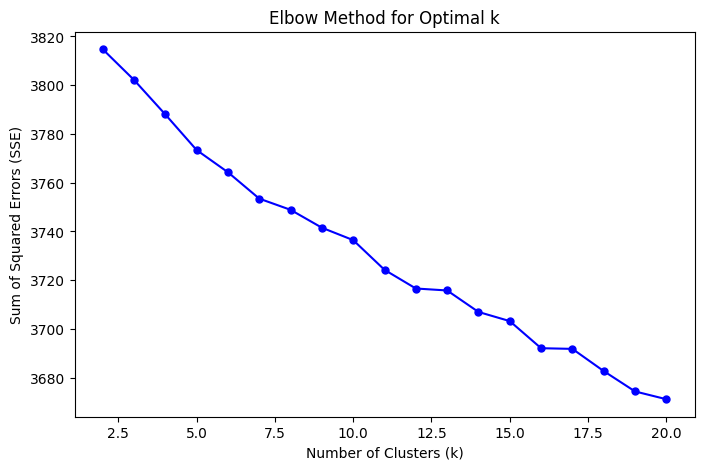

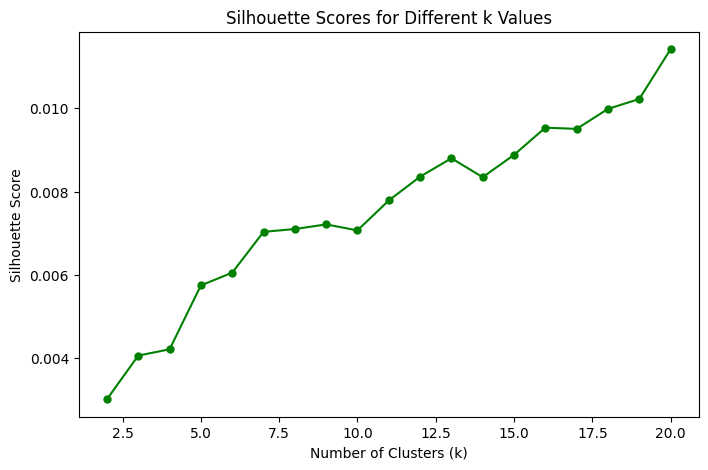

In [ ]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

results = {}
sse_values = []
silhouette_scores = []
k_values = range(2, 21)

data = pd.read_csv('/content/drive/MyDrive/projek_pemteks/TFIDF_Result_scrap_no_remove.csv')
for k in k_values:
    kmeans = KMeans(n_clusters=k, max_iter=1000, random_state=42,n_init=10)
    kmeans_labels = kmeans.fit_predict(data)
    silhouette_avg = silhouette_score(data, kmeans_labels)
    sse = kmeans.inertia_
    sse_values.append(sse)

    results[f'KMeans_k={k}'] = {'Silhouette Score': silhouette_avg, 'SSE': sse}
    silhouette_scores.append(silhouette_avg)

    print(f'KMeans with k={k}')
    print(f'Silhouette Score: {silhouette_avg}')
    print(f'SSE: {sse}\n')

plt.figure(figsize=(8, 5))
plt.plot(k_values, sse_values, 'bo-', markersize=5)
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Sum of Squared Errors (SSE)")
plt.title("Elbow Method for Optimal k")
plt.show()

plt.figure(figsize=(8, 5))
plt.plot(k_values, silhouette_scores, 'go-', markersize=5)
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Silhouette Score")
plt.title("Silhouette Scores for Different k Values")
plt.show()


## Mencoba Clustering

In [ ]:
!pip install Sastrawi

In [ ]:
from Sastrawi.StopWordRemover.StopWordRemoverFactory import StopWordRemoverFactory # Import the class
from Sastrawi.Stemmer.StemmerFactory import StemmerFactory # Import the class for StemmerFactory
import pandas as pd
import re
import string
factory = StemmerFactory()
stemmer = factory.create_stemmer()
stopword_factory = StopWordRemoverFactory()
stop_words = set(stopword_factory.get_stop_words())

def clean_teks(text):
    if pd.isnull(text):
        return ''

    text = text.lower()
    text = re.sub(r'\d+', '', text)
    text = re.sub(r'[^\x00-\x7f]', r' ', text)
    text = text.translate(str.maketrans(string.punctuation, ' ' * len(string.punctuation)))
    text = re.sub(r'(.)\1+', r'\1\1', text)
    tokens = text.split()
    processed_tokens = [stemmer.stem(word) for word in tokens if word not in stop_words]
    return ' '.join(processed_tokens)

data_hasil = pd.read_csv('/content/drive/MyDrive/projek_pemteks/hasil_prediksi_scraping_rf_tfidf_no_remove_stopword.csv')
data_hasil['title_clean_removestopword'] = data_hasil['title'].apply(clean_teks)

data_hasil.to_csv("/content/drive/MyDrive/projek_pemteks/hasil_data_scrap_remove_stopword.csv", index=False)

data_hasil.head()



,title,content,sumber,date_convert,title_clean,prediksi_label,prediksi_label_text,title_clean_removestopword
0,Aturan Baru Sri Mulyani: Gaji Minimal Rp 5 Jut...,KOMPAS.com -Pemerintah dan DPR mengubah batas ...,Kompas,2022-12-31,atur baru sri mulyani gaji minimal rp juta ken...,0,non-clickbait,atur baru sri mulyani gaji minimal rp juta ken...
1,Paus Benediktus XVI Meninggal Dunia di Usia 95...,"VATIKAN, KOMPAS.com -MantanPaus Benediktus XVI...",Kompas,2022-12-31,paus benediktus xvi tinggal dunia di usia tahun,0,non-clickbait,paus benediktus xvi tinggal dunia usia tahun
2,"Kondisi Indra Bekti Menurun, Penglihatan Kabur...","JAKARTA, KOMPAS.com -Adik presenterIndra Bekti...",Kompas,2022-12-31,kondisi indra bekti turun lihat kabur dan tens...,0,non-clickbait,kondisi indra bekti turun lihat kabur tensi da...
3,Aldila Jelita Dikritik Usai Buka Donasi untuk ...,"JAKARTA, KOMPAS.com- Istri presenterIndra Bekt...",Kompas,2023-01-01,aldila jelita kritik usai buka donasi untuk bi...,1,clickbait,aldila jelita kritik usai buka donasi biaya ru...
4,"Banjir Semarang Telan Korban Jiwa, Dua Mahasis...",KOMPAS.com- Dua mahasiswa tewas akibat terseng...,Kompas,2023-01-01,banjir semarang telan korban jiwa dua mahasisw...,0,non-clickbait,banjir semarang telan korban jiwa mahasiswa te...


In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
# Inisialisasi dan fit-transform TF-IDF
data_hasil = pd.read_csv('/content/drive/MyDrive/projek_pemteks/hasil_data_scrap_remove_stopword.csv')
tfidfvektor = TfidfVectorizer()
tfidfmetrik = tfidfvektor.fit_transform(data_hasil['title_clean_removestopword'].to_list())
fitur = tfidfvektor.get_feature_names_out()
tfidf_df = pd.DataFrame(tfidfmetrik.toarray(), columns=fitur)
tfidf_df.to_csv("/content/drive/MyDrive/projek_pemteks/TFIDF_Result_scrap_remove_stopword.csv", index=False)



In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
import numpy as np
# Membaca hasil TF-IDF dari file CSV
tfidf_df = pd.read_csv('/content/drive/MyDrive/projek_pemteks/TFIDF_Result_scrap_remove_stopword.csv')

from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
tfidf_scaled = scaler.fit_transform(tfidf_df)

pca = PCA()
pca_result = pca.fit_transform(tfidf_scaled)
u = np.transpose(pca.components_)
c = pd.DataFrame(tfidf_scaled .dot(u))
I = pd.DataFrame(pca_result.explained_variance_ratio_)

dataall = c.iloc[:,[0,1]]
dataall


In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
import numpy as np
from sklearn.preprocessing import StandardScaler

# Membaca hasil TF-IDF dari file CSV
tfidf_df = pd.read_csv('/content/drive/MyDrive/projek_pemteks/TFIDF_Result_scrap_remove_stopword.csv')

# Validasi data: pastikan hanya kolom numerik yang digunakan
numerical_cols = tfidf_df.select_dtypes(include=[np.number])

# Skalakan data menggunakan StandardScaler
scaler = StandardScaler()
tfidf_scaled = scaler.fit_transform(numerical_cols)

# Lakukan PCA
pca = PCA()
pca_result = pca.fit_transform(tfidf_scaled)

# Matriks komponen utama
u = np.transpose(pca.components_)

# Kalkulasi proyeksi data
c = pd.DataFrame(tfidf_scaled.dot(u))

# Explained variance ratio ke DataFrame
explained_variance_ratio = pd.DataFrame(pca.explained_variance_ratio_, columns=['Explained Variance Ratio'])

# Ambil dua komponen pertama untuk `dataall`
if c.shape[1] >= 2:  # Pastikan ada setidaknya dua komponen
    dataall = c.iloc[:, [0, 1]]

else:
    raise ValueError("PCA tidak menghasilkan cukup komponen untuk diambil.")

# Output hasil
print(dataall)


             0         1
0    -0.121426 -0.463617
1    -0.086858 -0.079705
2    -0.131936 -0.366620
3    -0.163860 -0.392518
4    -0.115045 -0.459282
...        ...       ...
3858 -0.098967 -0.466966
3859 -0.136497  0.535831
3860 -0.100347 -0.069139
3861 -0.195884  0.641090
3862 -0.111637 -0.295224

[3863 rows x 2 columns]


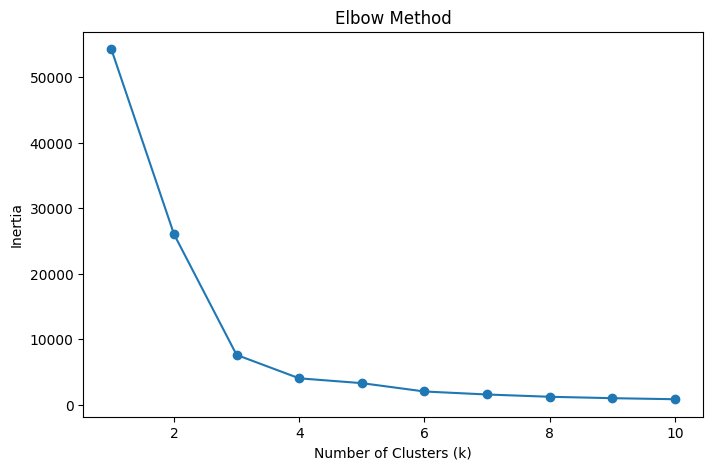

In [ ]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Step 1: Tentukan jumlah klaster menggunakan Elbow Method
inertia = []
k_values = range(1, 11)

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(dataall)
    inertia.append(kmeans.inertia_)

# Plot Elbow Method
plt.figure(figsize=(8, 5))
plt.plot(k_values, inertia, marker='o')
plt.title('Elbow Method')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.show()

# # Step 2: Pilih jumlah klaster, misalnya k = 3 (dari Elbow Method)
# optimal_k = 3
# kmeans = KMeans(n_clusters=optimal_k, random_state=42)
# kmeans.fit(dataall)

# # Step 3: Tambahkan hasil klaster ke DataFrame
# dataall['Cluster'] = kmeans.labels_

# # Step 4: Visualisasi klaster
# plt.figure(figsize=(8, 6))
# plt.scatter(dataall.iloc[:, 0], dataall.iloc[:, 1], c=dataall['Cluster'], cmap='viridis', s=50)
# plt.title('Clustering Result')
# plt.xlabel('PCA Component 1')
# plt.ylabel('PCA Component 2')
# plt.colorbar(label='Cluster')
# plt.show()


<ipython-input-20-aa1005f2a24d>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataall['Cluster'] = kmeans.labels_


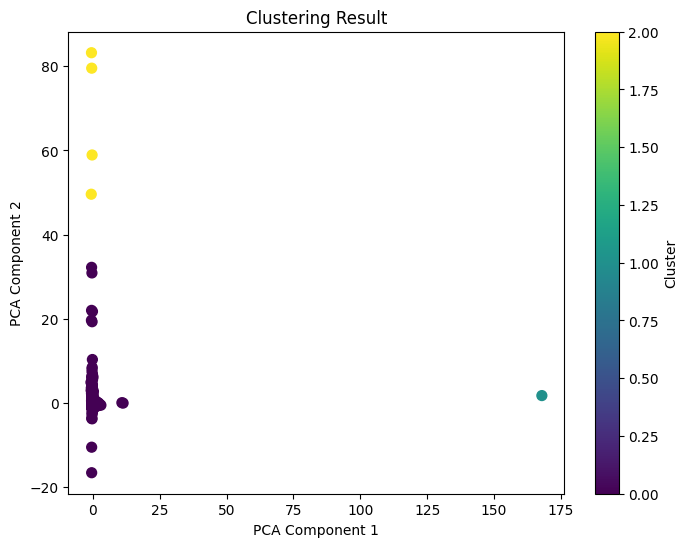

In [ ]:
# Step 2: Pilih jumlah klaster, misalnya k = 3 (dari Elbow Method)
optimal_k = 3
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
kmeans.fit(dataall)

# Step 3: Tambahkan hasil klaster ke DataFrame
dataall['Cluster'] = kmeans.labels_

# Step 4: Visualisasi klaster
plt.figure(figsize=(8, 6))
plt.scatter(dataall.iloc[:, 0], dataall.iloc[:, 1], c=dataall['Cluster'], cmap='viridis', s=50)
plt.title('Clustering Result')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.colorbar(label='Cluster')
plt.show()


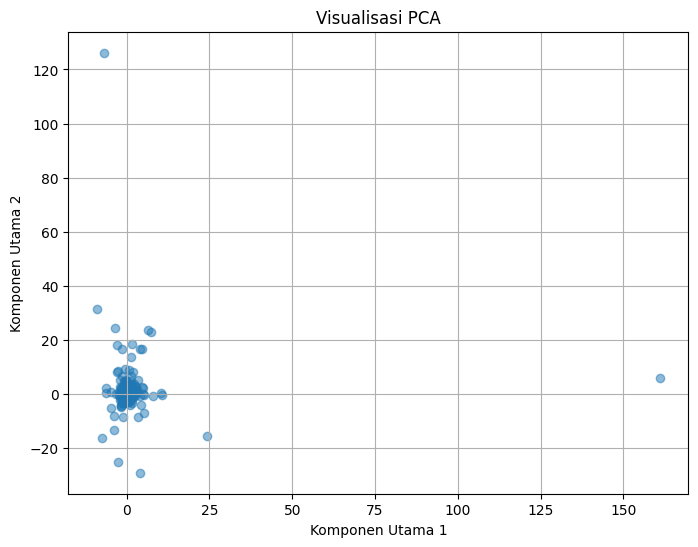

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Membaca hasil TF-IDF dari file CSV
tfidf_df = pd.read_csv('/content/drive/MyDrive/projek_pemteks/TFIDF_Result_scrap_remove_stopword.csv')

# Standarisasi data
scaler = StandardScaler()
tfidf_scaled = scaler.fit_transform(tfidf_df)

# Inisialisasi PCA dengan 2 komponen utama
pca_result = PCA(n_components=2).fit_transform(tfidf_scaled)

# Mengubah hasil PCA menjadi DataFrame
pca_df = pd.DataFrame(pca_result, columns=['PC1', 'PC2'])

# Plot hasil PCA
plt.figure(figsize=(8, 6))
plt.scatter(pca_df['PC1'], pca_df['PC2'], alpha=0.5)
plt.title('Visualisasi PCA')
plt.xlabel('Komponen Utama 1')
plt.ylabel('Komponen Utama 2')
plt.grid(True)
plt.show()

# Menyimpan hasil PCA ke CSV (Opsional)
# pca_df.to_csv('/content/drive/MyDrive/projek_pemteks/PCA_Result.csv', index=False)


In [ ]:
tfidf_df = pd.read_csv('/content/drive/MyDrive/projek_pemteks/TFIDF_Result_scrap_remove_stopword.csv')
tfidf_df.size

In [ ]:
pca = PCA(n_components=1500)
pca_result = pca.fit_transform(tfidf_scaled)
print("Explained variance ratio:", pca.explained_variance_ratio_)
print("Total variance explained:", sum(pca.explained_variance_ratio_))


Explained variance ratio: [0.00116479 0.0010398  0.00103075 ... 0.0002524  0.00025111 0.00025095]
Total variance explained: 0.7132951750795484


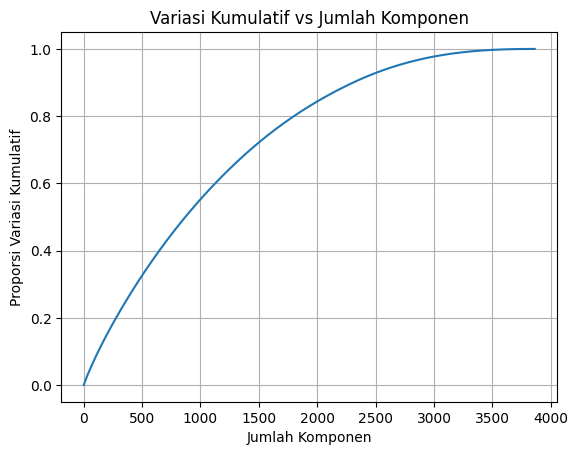

In [ ]:
pca = PCA()
pca.fit(tfidf_scaled)
plt.plot(range(1, len(pca.explained_variance_ratio_)+1), pca.explained_variance_ratio_.cumsum())
plt.xlabel('Jumlah Komponen')
plt.ylabel('Proporsi Variasi Kumulatif')
plt.title('Variasi Kumulatif vs Jumlah Komponen')
plt.grid()
plt.show()


## TFIDF

### label 0

1832
Total Variance TF-IDF: 0.994054435082204
Total Variance PCA (85% Components): 0.8966874500790073
PCA Variance >= 85% TF-IDF Variance? True


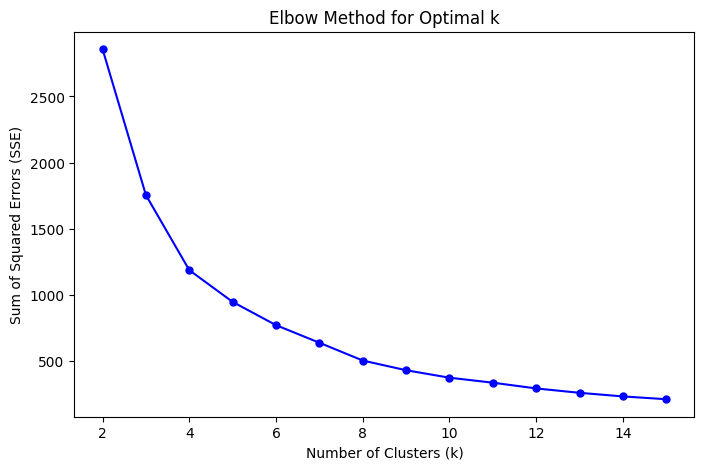

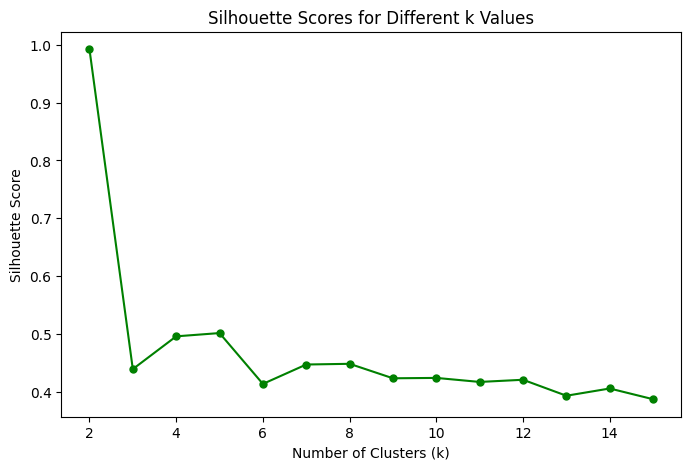

Jumlah cluster optimal untuk label 0 berdasarkan Elbow Method: 11
Jumlah cluster optimal untuk label 0 berdasarkan Silhouette Score: 2
Jumlah cluster optimal yang digunakan untuk label 0: 11
Silhouette Score untuk 11 cluster: 0.4353475073935835


<ipython-input-4-76b5298a16fc>:125: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='Cluster', data=subset_data, palette='viridis')


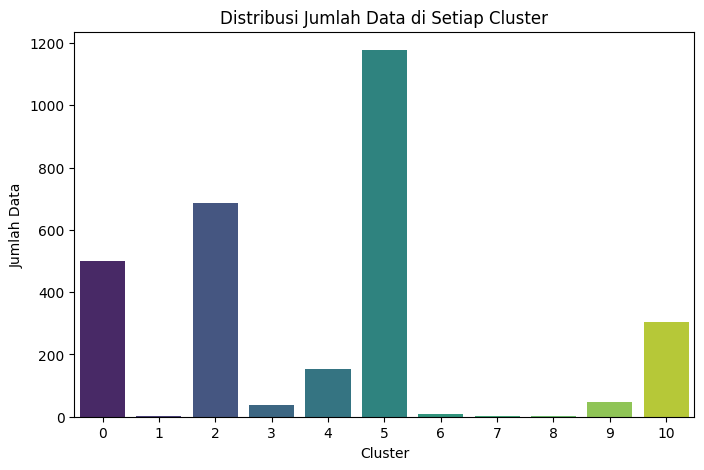

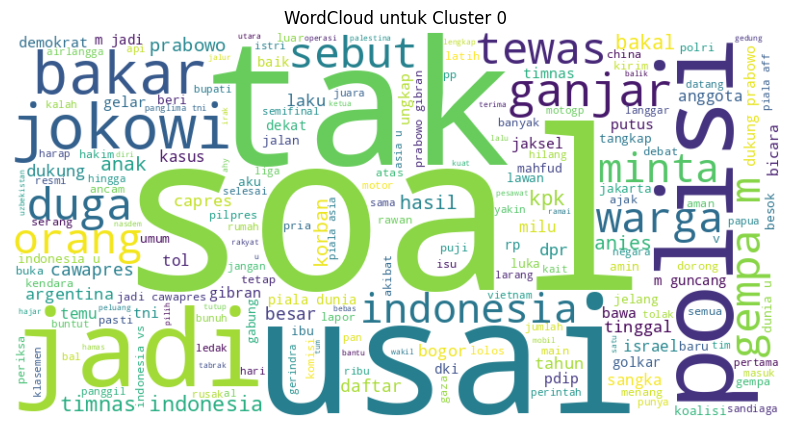

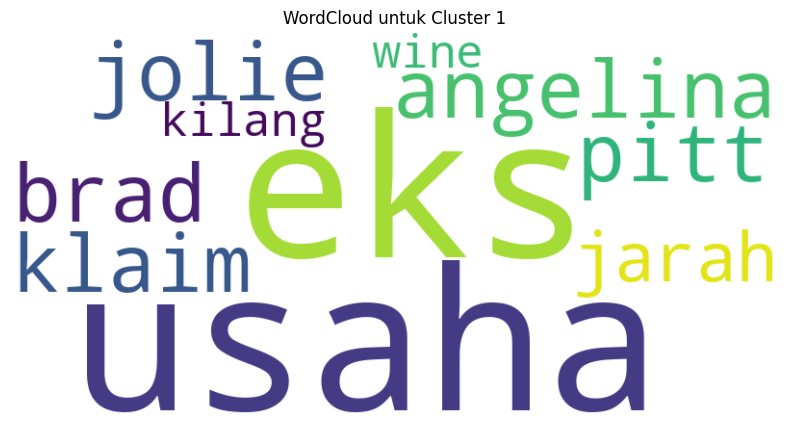

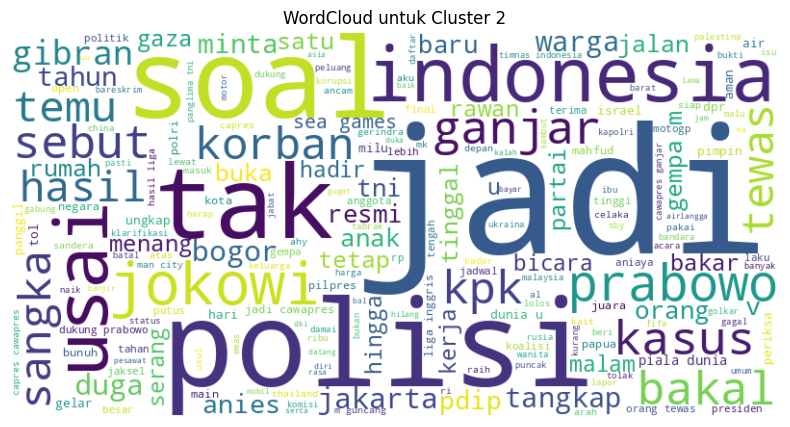

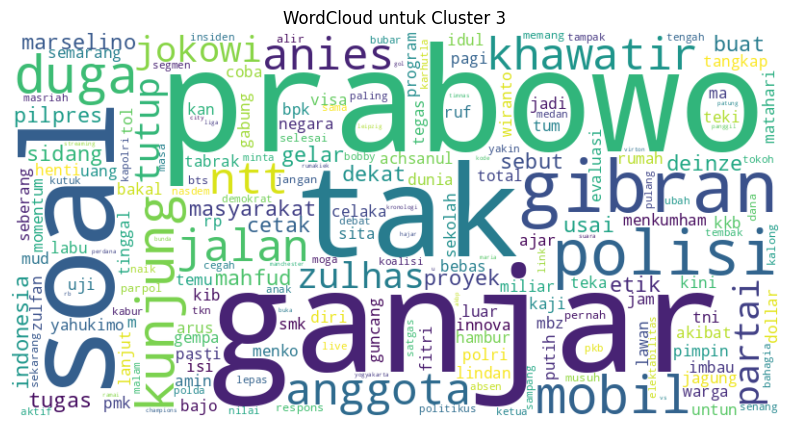

...

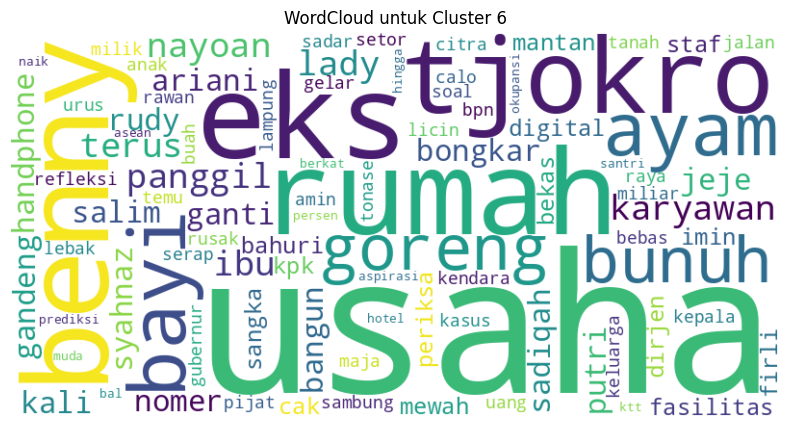

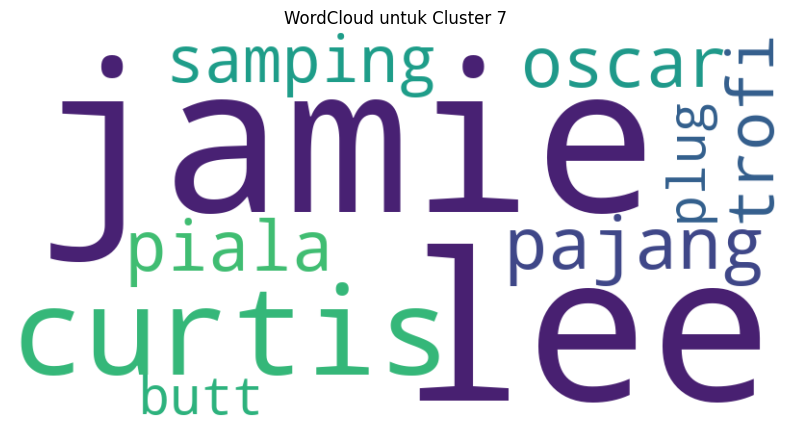

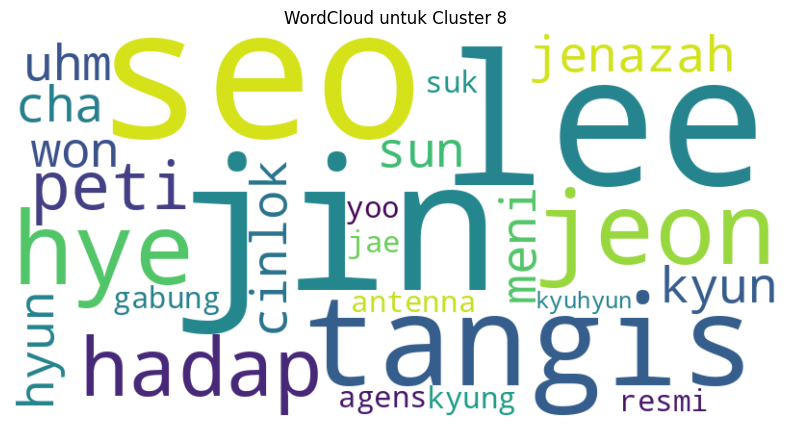

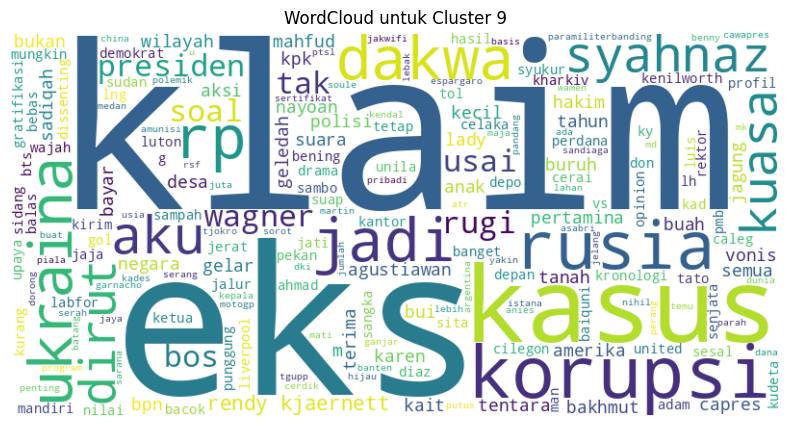

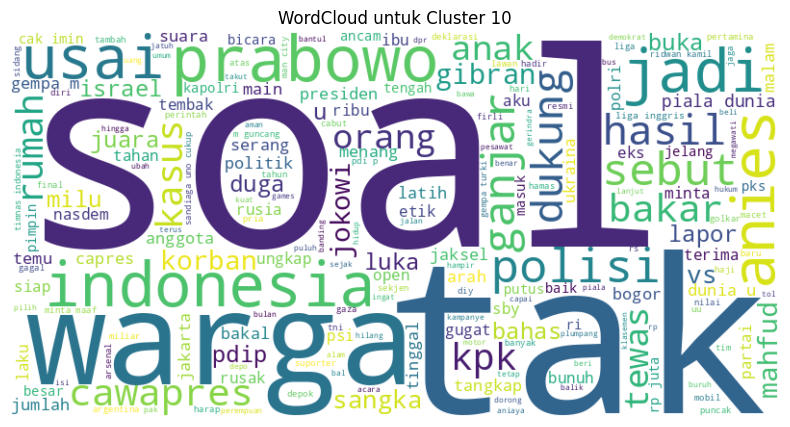


TFIDF Cluster 0 - Top 10 Words:
indonesia: 0.19884321930047263
jadi: 0.16511044838036298
timnas: 0.14096659592708682
soal: 0.14063070163052788
prabowo: 0.13563866107332037
tak: 0.1250270433149861
gempa: 0.1249339657856633
usai: 0.12377585966093926
ganjar: 0.12075358161568847
bakar: 0.11737303825178261

TFIDF Cluster 1 - Top 10 Words:
pitt: 0.34202647431283845
kilang: 0.34202647431283845
jarah: 0.34202647431283845
jolie: 0.34202647431283845
wine: 0.34202647431283845
brad: 0.34202647431283845
angelina: 0.34202647431283845
usaha: 0.27166304238730427
eks: 0.2316510603092272
klaim: 0.2316510603092272

TFIDF Cluster 2 - Top 10 Words:
jadi: 0.20242334326853106
polisi: 0.18026118362008167
indonesia: 0.16697571287563237
soal: 0.1626785739939969
prabowo: 0.12701743374074387
tak: 0.12498767669762939
usai: 0.1138107411172943
jokowi: 0.1127516739795425
ganjar: 0.11252414752300298
tewas: 0.11069187055013939

TFIDF Cluster 3 - Top 10 Words:
ganjar: 0.13402111952137707
prabowo: 0.12903571268882763
kh

In [4]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import TfidfVectorizer
from wordcloud import WordCloud
import seaborn as sns
from sklearn.decomposition import PCA

# Membaca data hasil TF-IDF
data_hasil0 = pd.read_csv("/content/drive/MyDrive/projek_pemteks/hasil_data_scrap_remove_stopword.csv")

# Fungsi untuk menemukan elbow secara otomatis
def find_elbow(inertia_values):
    x = np.arange(len(inertia_values))
    y = np.array(inertia_values)
    # Gradien perbedaan antar nilai inertia
    grad = np.gradient(y)
    elbow_point = np.argmin(grad[1:] - grad[:-1]) + 2  # Offset untuk k mulai dari 2
    return elbow_point

# Filter data berdasarkan nilai prediksi_label
subset_data = data_hasil0[data_hasil0['prediksi_label'] == 0].copy()

# TF-IDF Vectorizer untuk kolom 'title_clean_removestopword'
tfidfvektor = TfidfVectorizer()
tfidfmetrik = tfidfvektor.fit_transform(subset_data['title_clean_removestopword'].to_list())
fitur = tfidfvektor.get_feature_names_out()
tfidf_df11 = pd.DataFrame(tfidfmetrik.toarray(), columns=fitur)
tfidf_df11.to_csv(f"/content/drive/MyDrive/projek_pemteks/TFIDF_Result_scrap_remove_stopword_label_0.csv", index=False)

# Normalisasi data TF-IDF
scaler0 = StandardScaler()
scaled_data0 = scaler0.fit_transform(tfidf_df11)

# PCA
pca0 = PCA()
pca0.fit(scaled_data0)
U3 = np.transpose(pca0.components_)
C3 = pd.DataFrame(scaled_data0.dot(U3))

I = pd.DataFrame(pca0.explained_variance_ratio_)
data3 = C3.iloc[:, [0, 2100]]

# Cumulative variance untuk menentukan jumlah komponen PCA
cumulative_variance = np.cumsum(pca0.explained_variance_ratio_)
num_components_85 = np.argmax(cumulative_variance >= 0.90) + 1  # Komponen yang mencakup >= 85% variansi

# Transformasi data menggunakan PCA dengan komponen terpilih
pca_85 = PCA(n_components=num_components_85)
pca_transformed = pca_85.fit_transform(scaled_data0)
print(num_components_85)
# Simpan hasil PCA ke DataFrame
pca_df = pd.DataFrame(pca_transformed, columns=[f'PC{i+1}' for i in range(num_components_85)])

# Hitung total variansi TF-IDF
tfidf_variances = tfidf_df11.var(axis=0)
tfidf_total_variance = tfidf_variances.sum()

# Hitung variansi total PCA
total_variance_pca_85 = sum(pca_85.explained_variance_ratio_)

# Bandingkan total variansi PCA dengan 85% total variansi TF-IDF
pca_85_greater_than_tfidf = total_variance_pca_85 >= (0.85 * tfidf_total_variance)

print(f"Total Variance TF-IDF: {tfidf_total_variance}")
print(f"Total Variance PCA (85% Components): {total_variance_pca_85}")
print(f"PCA Variance >= 85% TF-IDF Variance? {pca_85_greater_than_tfidf}")

# K-Means dan evaluasi
results = {}
sse_values = []
silhouette_scores = []
k_values = range(2, 16)

for k in k_values:
    kmeans = KMeans(n_clusters=k, max_iter=1000, random_state=42, n_init=10)
    kmeans_labels = kmeans.fit_predict(data3)
    silhouette_avg = silhouette_score(data3, kmeans_labels)
    sse = kmeans.inertia_
    sse_values.append(sse)

    results[f'KMeans_k={k}'] = {'Silhouette Score': silhouette_avg, 'SSE': sse}
    silhouette_scores.append(silhouette_avg)

plt.figure(figsize=(8, 5))
plt.plot(k_values, sse_values, 'bo-', markersize=5)
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Sum of Squared Errors (SSE)")
plt.title("Elbow Method for Optimal k")
plt.show()

plt.figure(figsize=(8, 5))
plt.plot(k_values, silhouette_scores, 'go-', markersize=5)
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Silhouette Score")
plt.title("Silhouette Scores for Different k Values")
plt.show()

# Pilihan jumlah cluster terbaik berdasarkan Elbow Method
optimal_k_elbow = find_elbow(sse_values)
print(f"Jumlah cluster optimal untuk label 0 berdasarkan Elbow Method: {optimal_k_elbow}")

# Pilihan jumlah cluster terbaik berdasarkan Silhouette Score
optimal_k_silhouette = k_values[silhouette_scores.index(max(silhouette_scores))]
print(f"Jumlah cluster optimal untuk label 0 berdasarkan Silhouette Score: {optimal_k_silhouette}")

# Pilihan akhir (menggunakan hasil dari Elbow Method)
optimal_k = optimal_k_elbow
print(f"Jumlah cluster optimal yang digunakan untuk label 0: {optimal_k}")
# optimal_k=19
# Clustering dengan jumlah cluster optimal
kmeans_optimal = KMeans(n_clusters=optimal_k, random_state=42)
subset_data['Cluster'] = kmeans_optimal.fit_predict(data3)

# Hitung Silhouette Score
silhouette_avg = silhouette_score(data3, subset_data['Cluster'])
print(f"Silhouette Score untuk {optimal_k} cluster: {silhouette_avg}")


# Visualisasi distribusi cluster
plt.figure(figsize=(8, 5))
sns.countplot(x='Cluster', data=subset_data, palette='viridis')
plt.title("Distribusi Jumlah Data di Setiap Cluster")
plt.xlabel("Cluster")
plt.ylabel("Jumlah Data")
plt.show()

# Wordcloud untuk setiap cluster
for cluster in range(optimal_k):
    cluster_data = subset_data[subset_data['Cluster'] == cluster]
    text = " ".join(cluster_data['title_clean_removestopword'].to_list())
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.title(f"WordCloud untuk Cluster {cluster}")
    plt.show()

# Top 10 kata paling sering muncul di setiap cluster
for cluster in range(optimal_k):
    cluster_data = subset_data[subset_data['Cluster'] == cluster]
    text = " ".join(cluster_data['title_clean_removestopword'].to_list())
    vectorized_cluster = tfidfvektor.transform([text])
    word_freq = np.array(vectorized_cluster.sum(axis=0)).flatten()
    top_10_indices = word_freq.argsort()[-10:][::-1]
    top_10_words = [(fitur[i], word_freq[i]) for i in top_10_indices]

    print(f"\nTFIDF Cluster {cluster} - Top 10 Words:")
    for word, freq in top_10_words:
        print(f"{word}: {freq}")

from collections import Counter

# Top 10 kata paling sering muncul di setiap cluster berdasarkan jumlah kemunculan
for cluster in range(optimal_k):
    cluster_data = subset_data[subset_data['Cluster'] == cluster]
    # Gabungkan semua teks dalam cluster
    text = " ".join(cluster_data['title_clean_removestopword'].to_list())
    # Tokenisasi kata dan hitung frekuensi
    word_counts = Counter(text.split())
    # Ambil 10 kata dengan frekuensi tertinggi
    top_10_words = word_counts.most_common(10)

    print(f"\nCluster {cluster} - Top 10 Words:")
    for word, freq in top_10_words:
        print(f"{word}: {freq}")


# Menyimpan hasil clustering ke file CSV
subset_data.to_csv(f"/content/drive/MyDrive/projek_pemteks/Clustering_Result_label_0.csv", index=False)
print(f"Hasil clustering untuk label 0 disimpan ke 'Clustering_Result_label_0.csv'.")


In [53]:
import pandas as pd

# Baca data hasil clustering
data = pd.read_csv("/content/drive/MyDrive/projek_pemteks/Clustering_Result_label_0.csv")

# Kelompokkan data berdasarkan cluster
grouped_data = data.groupby('Cluster')['title'].apply(list)

# Tampilkan judul berita dalam setiap cluster
for cluster, titles in grouped_data.items():
    print(f"\nCluster {cluster}:")
    for i, title in enumerate(titles, 1):
        print(f"{i}. {title}")



Cluster 0:
1. Suami Kelupaan Bawa Istri, Ketinggalan di Hutan Saat Ditinggal Kencing
2. AG, Pacar Mario, Ditetapkan sebagai Pelaku Kasus Penganiayaan D
3. Kebakaran Besar di Depo Pertamina Plumpang Jakarta Utara, Diduga Ledakan Pipa Penyebabnya
4. Sultan HB X Sebut Gunung Merapi Meletus untuk Tutup Lubang Tambang
5. Pemerintah Tetapkan Awal Puasa Ramadhan 2023 Jatuh pada Kamis 23 Maret
6. Batal Jadi Tuan Rumah Piala Dunia U-20, Indonesia Kehilangan Potensi Ekonomi Rp 188 Triliun
7. Usai Bertemu Jokowi, Timnas U20 Indonesia Dibubarkan
8. Hakim Kabulkan Gugatan Pembatalan Merek Open Mic, Kini Jadi Milik Umum
9. Bupati Nonaktif Meranti Gadaikan Kantornya ke Bank Rp 100 Miliar
10. Ketum PSSI Erick Thohir Kirim Bantuan, Dokter Periksa Kurnia Meiga
11. Ibu Anggota DPR Bambang Hermanto Dibunuh di Indramayu, Tangan dan Kaki Diikat
12. Hasil Final Singapore Open 2023: Ginting Juara, Pecahkan Rekor 50 Tahun
13. Saat Media Argentina Sebut Messi Ingin Datang ke Indonesia...
14. Pelatih Argentina 

### label 1

692
Total Variance TF-IDF: 0.9926193049505561
Total Variance PCA (85% Components): 0.8963365331486927
PCA Variance >= 85% TF-IDF Variance? True


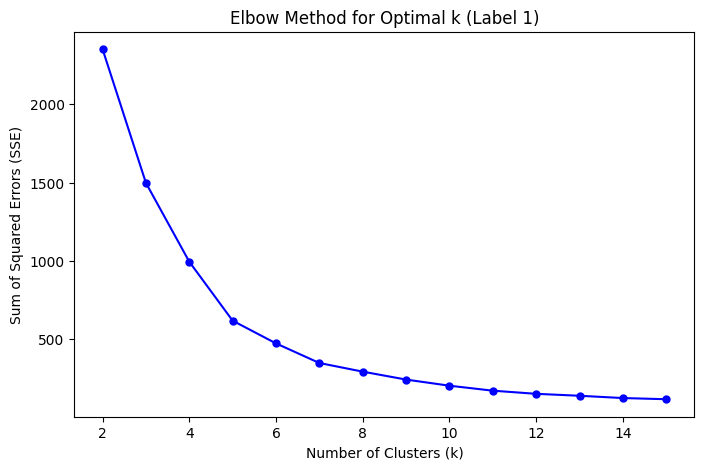

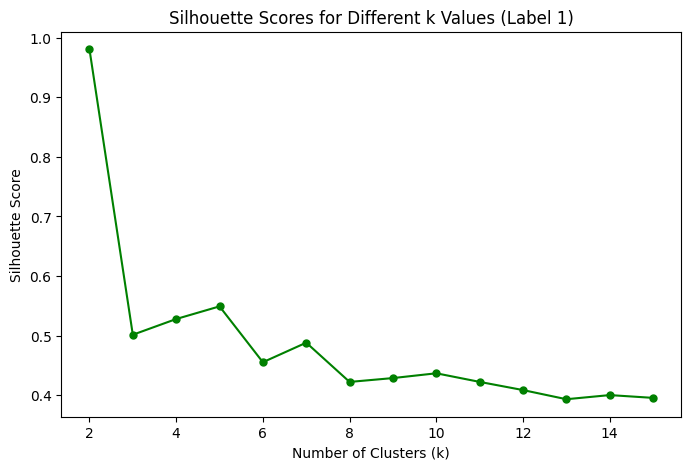

Jumlah cluster optimal untuk label 1 berdasarkan Elbow Method: 13
Jumlah cluster optimal untuk label 1 berdasarkan Silhouette Score: 2
Jumlah cluster optimal yang digunakan untuk label 1: 13
Silhouette Score untuk 13 cluster: 0.40648043036758064


<ipython-input-5-ca894b881bab>:125: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='Cluster', data=subset_data_1, palette='viridis')


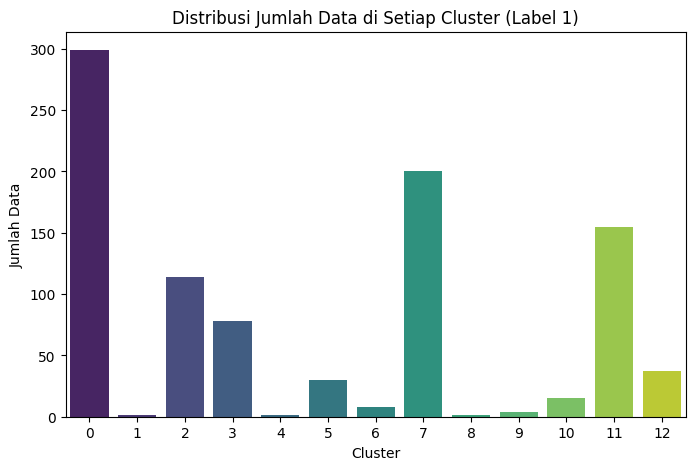

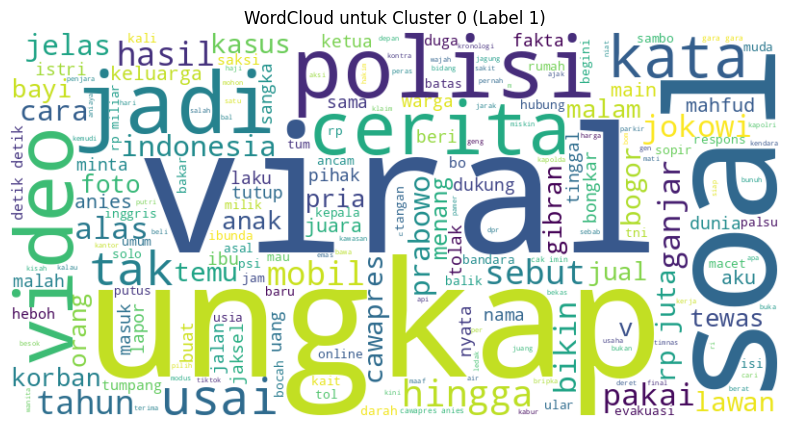

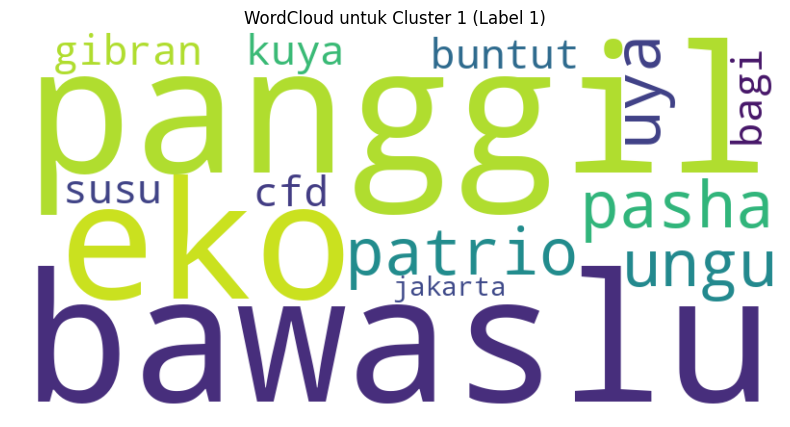

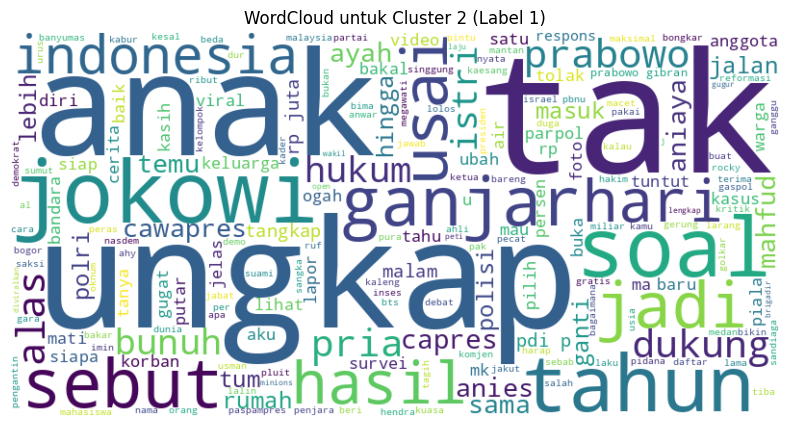

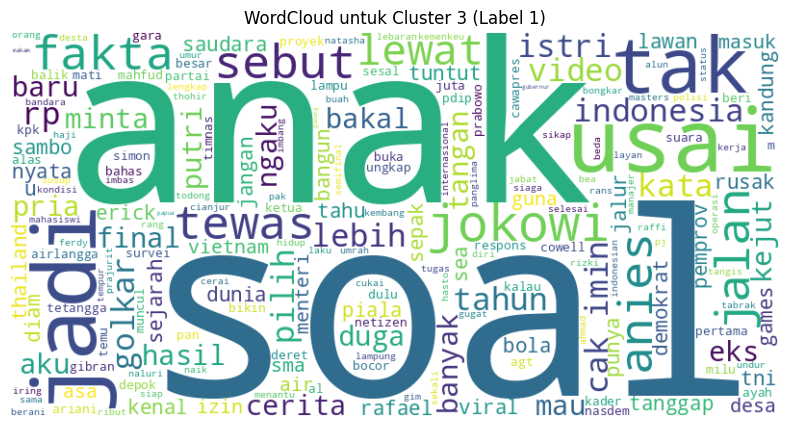

...

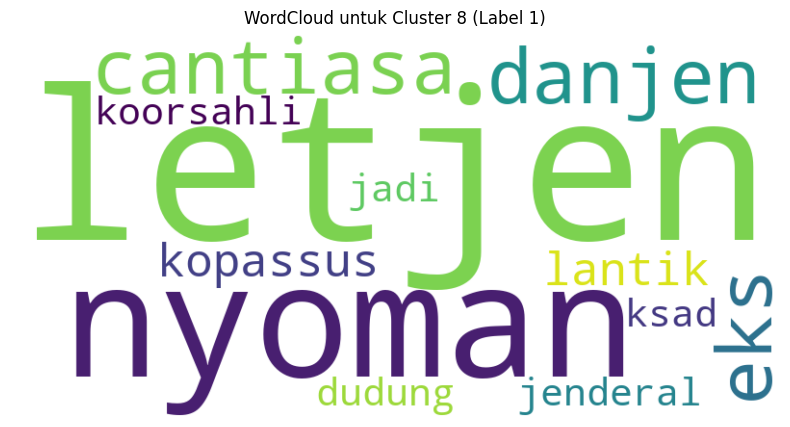

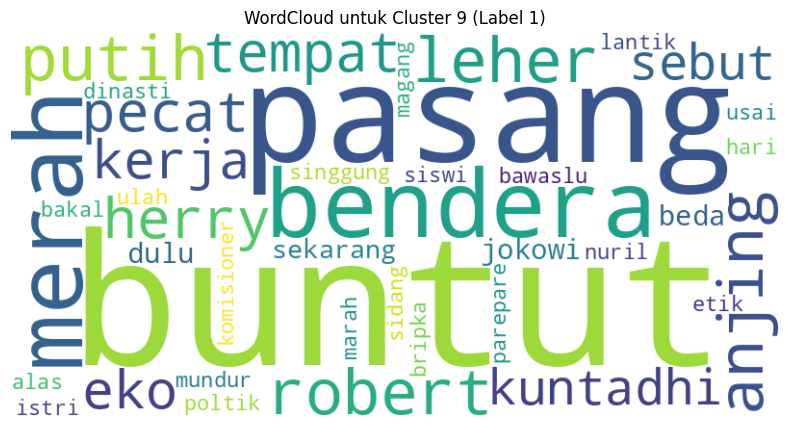

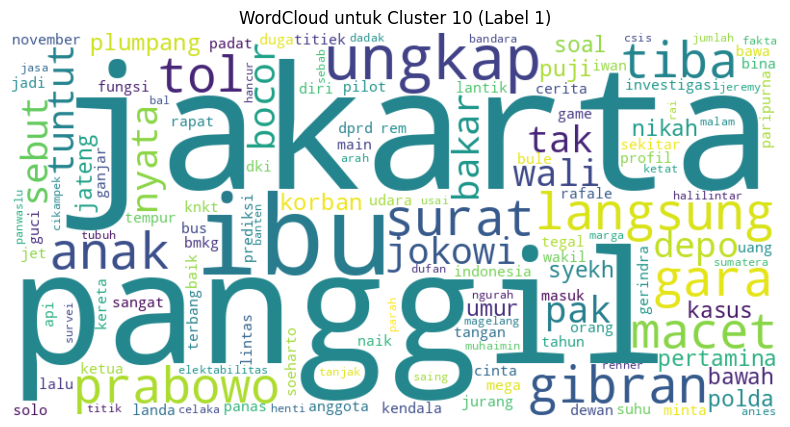

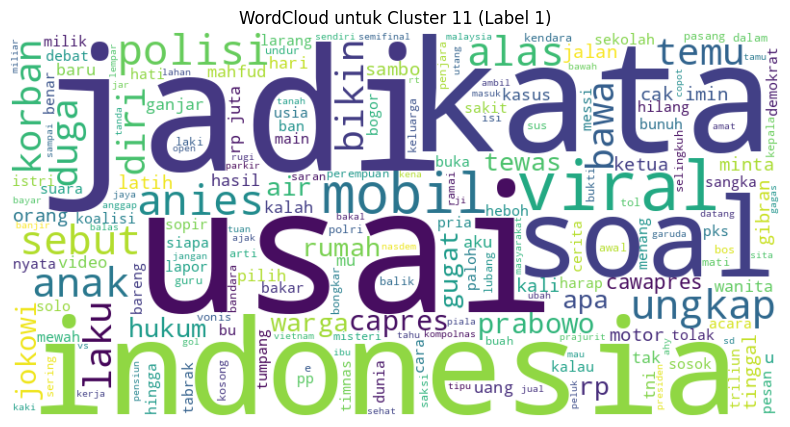

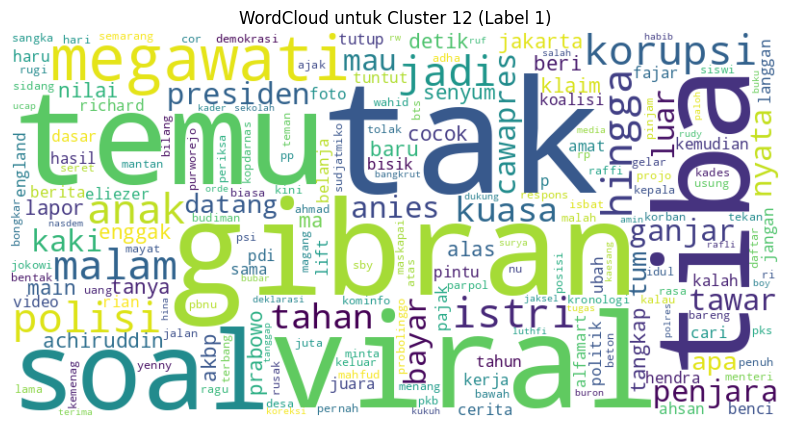


TFIDF Cluster 0 (Label 1) - Top 10 Words:
viral: 0.1901559453770955
ungkap: 0.16094539555283519
polisi: 0.13849996542954635
soal: 0.13440024496490305
video: 0.13202736856760258
cerita: 0.13119680345354848
kata: 0.12457671636043133
jadi: 0.12250438641019881
rp: 0.12125202077771274
hingga: 0.11245209072886096

TFIDF Cluster 1 (Label 1) - Top 10 Words:
patrio: 0.28716118553561404
ungu: 0.28716118553561404
susu: 0.28716118553561404
uya: 0.28716118553561404
kuya: 0.28716118553561404
pasha: 0.28716118553561404
cfd: 0.28716118553561404
bagi: 0.2708926116901174
bawaslu: 0.2708926116901174
eko: 0.2708926116901174

TFIDF Cluster 2 (Label 1) - Top 10 Words:
tak: 0.2021012162313992
anak: 0.15655442970150318
ungkap: 0.15545493515201625
jokowi: 0.15031236897588415
tahun: 0.13866892118203009
prabowo: 0.12418493026426321
soal: 0.12363365785477157
ganjar: 0.12159534923151523
sebut: 0.11511630183020527
rp: 0.10247619599191721

TFIDF Cluster 3 (Label 1) - Top 10 Words:
soal: 0.18647379876641834
anak: 0.

In [5]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import TfidfVectorizer
from wordcloud import WordCloud
import seaborn as sns
from collections import Counter
from sklearn.decomposition import PCA
# Membaca data hasil TF-IDF
data_hasil1 = pd.read_csv("/content/drive/MyDrive/projek_pemteks/hasil_data_scrap_remove_stopword.csv")

# Fungsi untuk menemukan elbow secara otomatis
def find_elbow(inertia_values):
    x = np.arange(len(inertia_values))
    y = np.array(inertia_values)
    # Gradien perbedaan antar nilai inertia
    grad = np.gradient(y)
    elbow_point = np.argmin(grad[1:] - grad[:-1]) + 2  # Offset untuk k mulai dari 2
    return elbow_point

# Filter data berdasarkan nilai prediksi_label
subset_data_1 = data_hasil1[data_hasil1['prediksi_label'] == 1].copy()

# TF-IDF Vectorizer untuk kolom 'title_clean_removestopword'
tfidfvektor_1 = TfidfVectorizer()
tfidfmetrik_1 = tfidfvektor_1.fit_transform(subset_data_1['title_clean_removestopword'].to_list())
fitur_1 = tfidfvektor_1.get_feature_names_out()
tfidf_df_1 = pd.DataFrame(tfidfmetrik_1.toarray(), columns=fitur_1)
tfidf_df_1.to_csv(f"/content/drive/MyDrive/projek_pemteks/TFIDF_Result_scrap_remove_stopword_label_1.csv", index=False)

# Normalisasi data TF-IDF
scaler_1 = StandardScaler()
scaled_data_1 = scaler_1.fit_transform(tfidf_df_1)

# PCA
pca_1 = PCA()
pca_1.fit(scaled_data_1)
U3_1 = np.transpose(pca_1.components_)
C3_1 = pd.DataFrame(scaled_data_1.dot(U3_1))

I_1 = pd.DataFrame(pca_1.explained_variance_ratio_)
data3_1 = C3_1.iloc[:, [0, 700]]


# Cumulative variance untuk menentukan jumlah komponen PCA
cumulative_variance = np.cumsum(pca_1.explained_variance_ratio_)
num_components_85 = np.argmax(cumulative_variance >= 0.90) + 1  # Komponen yang mencakup >= 85% variansi

# Transformasi data menggunakan PCA dengan komponen terpilih
pca_85 = PCA(n_components=num_components_85)
pca_transformed = pca_85.fit_transform(scaled_data_1)
print(num_components_85)
# Simpan hasil PCA ke DataFrame
pca_df = pd.DataFrame(pca_transformed, columns=[f'PC{i+1}' for i in range(num_components_85)])

# Hitung total variansi TF-IDF
tfidf_variances = tfidf_df_1.var(axis=0)
tfidf_total_variance = tfidf_variances.sum()

# Hitung variansi total PCA
total_variance_pca_85 = sum(pca_85.explained_variance_ratio_)

# Bandingkan total variansi PCA dengan 85% total variansi TF-IDF
pca_85_greater_than_tfidf = total_variance_pca_85 >= (0.85 * tfidf_total_variance)

print(f"Total Variance TF-IDF: {tfidf_total_variance}")
print(f"Total Variance PCA (85% Components): {total_variance_pca_85}")
print(f"PCA Variance >= 85% TF-IDF Variance? {pca_85_greater_than_tfidf}")
# K-Means dan evaluasi
results_1 = {}
sse_values_1 = []
silhouette_scores_1 = []
k_values_1 = range(2, 16)

for k in k_values_1:
    kmeans = KMeans(n_clusters=k, max_iter=1000, random_state=42, n_init=10)
    kmeans_labels = kmeans.fit_predict(data3_1)
    silhouette_avg = silhouette_score(data3_1, kmeans_labels)
    sse = kmeans.inertia_
    sse_values_1.append(sse)

    results_1[f'KMeans_k={k}'] = {'Silhouette Score': silhouette_avg, 'SSE': sse}
    silhouette_scores_1.append(silhouette_avg)

plt.figure(figsize=(8, 5))
plt.plot(k_values_1, sse_values_1, 'bo-', markersize=5)
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Sum of Squared Errors (SSE)")
plt.title("Elbow Method for Optimal k (Label 1)")
plt.show()

plt.figure(figsize=(8, 5))
plt.plot(k_values_1, silhouette_scores_1, 'go-', markersize=5)
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Silhouette Score")
plt.title("Silhouette Scores for Different k Values (Label 1)")
plt.show()

# Pilihan jumlah cluster terbaik berdasarkan Elbow Method
optimal_k_elbow_1 = find_elbow(sse_values_1)
print(f"Jumlah cluster optimal untuk label 1 berdasarkan Elbow Method: {optimal_k_elbow_1}")

# Pilihan jumlah cluster terbaik berdasarkan Silhouette Score
optimal_k_silhouette_1 = k_values_1[silhouette_scores_1.index(max(silhouette_scores_1))]
print(f"Jumlah cluster optimal untuk label 1 berdasarkan Silhouette Score: {optimal_k_silhouette_1}")

# Pilihan akhir (menggunakan hasil dari Elbow Method)
optimal_k_1 = optimal_k_elbow_1
print(f"Jumlah cluster optimal yang digunakan untuk label 1: {optimal_k_1}")

# Clustering dengan jumlah cluster optimal
kmeans_optimal_1 = KMeans(n_clusters=optimal_k_1, random_state=42)
subset_data_1['Cluster'] = kmeans_optimal_1.fit_predict(data3_1)

# Hitung Silhouette Score
silhouette_avg = silhouette_score(data3_1, subset_data_1['Cluster'])
print(f"Silhouette Score untuk {optimal_k_1} cluster: {silhouette_avg}")

# Visualisasi distribusi cluster
plt.figure(figsize=(8, 5))
sns.countplot(x='Cluster', data=subset_data_1, palette='viridis')
plt.title("Distribusi Jumlah Data di Setiap Cluster (Label 1)")
plt.xlabel("Cluster")
plt.ylabel("Jumlah Data")
plt.show()

# Wordcloud untuk setiap cluster
for cluster in range(optimal_k_1):
    cluster_data = subset_data_1[subset_data_1['Cluster'] == cluster]
    text = " ".join(cluster_data['title_clean_removestopword'].to_list())
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.title(f"WordCloud untuk Cluster {cluster} (Label 1)")
    plt.show()

# Top 10 kata paling sering muncul di setiap cluster berdasarkan TF-IDF
for cluster in range(optimal_k_1):
    cluster_data = subset_data_1[subset_data_1['Cluster'] == cluster]
    text = " ".join(cluster_data['title_clean_removestopword'].to_list())
    vectorized_cluster = tfidfvektor_1.transform([text])
    word_freq = np.array(vectorized_cluster.sum(axis=0)).flatten()
    top_10_indices = word_freq.argsort()[-10:][::-1]
    top_10_words = [(fitur_1[i], word_freq[i]) for i in top_10_indices]

    print(f"\nTFIDF Cluster {cluster} (Label 1) - Top 10 Words:")
    for word, freq in top_10_words:
        print(f"{word}: {freq}")

# Top 10 kata paling sering muncul di setiap cluster berdasarkan jumlah kemunculan
for cluster in range(optimal_k_1):
    cluster_data = subset_data_1[subset_data_1['Cluster'] == cluster]
    # Gabungkan semua teks dalam cluster
    text = " ".join(cluster_data['title_clean_removestopword'].to_list())
    # Tokenisasi kata dan hitung frekuensi
    word_counts = Counter(text.split())
    # Ambil 10 kata dengan frekuensi tertinggi
    top_10_words = word_counts.most_common(10)

    print(f"\nCluster {cluster} (Label 1) - Top 10 Words:")
    for word, freq in top_10_words:
        print(f"{word}: {freq}")

# Menyimpan hasil clustering ke file CSV
subset_data_1.to_csv(f"/content/drive/MyDrive/projek_pemteks/Clustering_Result_label_1.csv", index=False)
print(f"Hasil clustering untuk label 1 disimpan ke 'Clustering_Result_label_1.csv'.")


In [52]:
import pandas as pd

# Baca data hasil clustering
data = pd.read_csv("/content/drive/MyDrive/projek_pemteks/Clustering_Result_label_1.csv")

# Kelompokkan data berdasarkan cluster
grouped_data = data.groupby('Cluster')['title'].apply(list)

# Tampilkan judul berita dalam setiap cluster
for cluster, titles in grouped_data.items():
    print(f"\nCluster {cluster}:")
    for i, title in enumerate(titles, 1):
        print(f"{i}. {title}")



Cluster 0:
1. Mahasiswi UNY dari Keluarga Miskin di Purbalingga Ini Meninggal Saat Perjuangkan Keringanan UKT
2. Fakta Kasus Bentrokan Dua Kelompok Buruh PT GNI: 2 Pekerja Lokal dan 1 TKA Tewas, Aset Perusahaan Dibakar Massa
3. Cerita di Balik Tukang Becak di Surabaya Cairkan Uang Rp 320 Juta dari Rekening Bukan Miliknya
4. Agus Kembali Pulang Setelah 25 Tahun Kabur akibat Takut Disunat, Dibujuk dengan Cara Mau Diajak Piknik
5. Kekecewaan Mendalam Ibunda Hasya, Anaknya Tewas Ditabrak Pensiunan Polisi, tapi Justru Jadi Tersangka
6. Sang Ibu Sebut Nono Bocah Juara Sempoa Dunia Tolak Hadiah Mobil dari Astra, Ini Alasannya
7. Tutup Permanen Per 31 Maret, Ini Profil Perusahaan JD.ID
8. Cap Go Meh 2023 di Bekasi, Ini Rute Pawai Barongsai dan Naga
9. Wanita Bos Rental PS Diduga Cabuli 17 Anak Mayoritas Laki-laki, Pelaku Sempat Mengaku Jadi Korban
10. Biaya Penerbangan Haji 2023 Jadi Rp 32,7 Juta, Garuda: Mohon Pengertiannya, Kami Hanya Ambil 2,5 Persen
11. Viral, Video Prajurit Gadungan Ajak

## fastex

In [ ]:
data_hasil = pd.read_csv('/content/drive/MyDrive/projek_pemteks/hasil_data_scrap_remove_stopword.csv')
data_hasil.head()

,title,content,sumber,date_convert,title_clean,prediksi_label,prediksi_label_text,title_clean_removestopword
0,Aturan Baru Sri Mulyani: Gaji Minimal Rp 5 Jut...,KOMPAS.com -Pemerintah dan DPR mengubah batas ...,Kompas,2022-12-31,atur baru sri mulyani gaji minimal rp juta ken...,0,non-clickbait,atur baru sri mulyani gaji minimal rp juta ken...
1,Paus Benediktus XVI Meninggal Dunia di Usia 95...,"VATIKAN, KOMPAS.com -MantanPaus Benediktus XVI...",Kompas,2022-12-31,paus benediktus xvi tinggal dunia di usia tahun,0,non-clickbait,paus benediktus xvi tinggal dunia usia tahun
2,"Kondisi Indra Bekti Menurun, Penglihatan Kabur...","JAKARTA, KOMPAS.com -Adik presenterIndra Bekti...",Kompas,2022-12-31,kondisi indra bekti turun lihat kabur dan tens...,0,non-clickbait,kondisi indra bekti turun lihat kabur tensi da...
3,Aldila Jelita Dikritik Usai Buka Donasi untuk ...,"JAKARTA, KOMPAS.com- Istri presenterIndra Bekt...",Kompas,2023-01-01,aldila jelita kritik usai buka donasi untuk bi...,1,clickbait,aldila jelita kritik usai buka donasi biaya ru...
4,"Banjir Semarang Telan Korban Jiwa, Dua Mahasis...",KOMPAS.com- Dua mahasiswa tewas akibat terseng...,Kompas,2023-01-01,banjir semarang telan korban jiwa dua mahasisw...,0,non-clickbait,banjir semarang telan korban jiwa mahasiswa te...


### label 0

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import seaborn as sns
from gensim.models import Word2Vec
from collections import Counter
from gensim.models import FastText
from sklearn.decomposition import PCA

# Membaca data hasil
data_cleaned = pd.read_csv("/content/drive/MyDrive/projek_pemteks/hasil_data_scrap_remove_stopword.csv")

# Tokenisasi setiap judul
# Filter data berdasarkan nilai prediksi_label
filtered_data = data_cleaned[data_cleaned['prediksi_label'] == 0].copy()
filtered_data['tokenized'] = filtered_data['title_clean_removestopword'].apply(lambda x: x.lower().split())

# Latih FastText dengan algoritma CBOW
fasttext_model = FastText(
    sentences=filtered_data['tokenized'].tolist(),  # Input berupa list tokenized sentences
    vector_size=100,  # Dimensi vektor embedding
    window=5,         # Window size
    min_count=1,      # Minimal frekuensi kata
    workers=4         # Jumlah thread
)

# Simpan vektor kata ke dalam DataFrame
vocab_words = fasttext_model.wv.index_to_key  # Daftar kata yang dipelajari
word_vectors = fasttext_model.wv[vocab_words]      # Matriks vektor kata

# Buat DataFrame dari vektor kata
word_vectors_df = pd.DataFrame(word_vectors, index=vocab_words)

# Simpan ke CSV
word_vectors_df.to_csv('/content/drive/MyDrive/projek_pemteks/FastText_Result_0.csv', index_label='word')

print("FastText model has been trained and vectors saved.")

# Fungsi untuk menghitung rata-rata vektor dokumen
def compute_average_vector(tokens, model):
    vectors = [model.wv[token] for token in tokens if token in model.wv]
    if len(vectors) == 0:  # Jika dokumen tidak memiliki kata yang cocok
        return np.zeros(model.vector_size)
    return np.mean(vectors, axis=0)

# Tambahkan kolom rata-rata vektor dokumen
filtered_data['doc_vector'] = filtered_data['tokenized'].apply(lambda tokens: compute_average_vector(tokens, fasttext_model))

# Ekstrak vektor dokumen
document_vectors = np.vstack(filtered_data['doc_vector'].values)

# Standard Scaling pada data rata-rata vektor dokumen
scaler = StandardScaler()
scaled_vectors = scaler.fit_transform(document_vectors)

# PCA
from sklearn.decomposition import PCA
pca_instance = PCA()
pca_instance.fit(scaled_vectors)
principal_components = np.transpose(pca_instance.components_)
pca_transformed_df = pd.DataFrame(scaled_vectors.dot(principal_components))

explained_variance = pd.DataFrame(pca_instance.explained_variance_ratio_)
data_pca_2D = pca_transformed_df.iloc[:, [0, 0]]

# K-Means clustering dan evaluasi
results = {}
sse_list = []
silhouette_list = []
k_range = range(2, 16)

doc_variance = document_vectors.var(axis=0)
total_variance_tf_idf = doc_variance.sum()
# Cumulative variance untuk menentukan jumlah komponen PCA
cumulative_variance = np.cumsum(pca_instance.explained_variance_ratio_)
num_components_85 = np.argmax(cumulative_variance >= (0.90 * total_variance_tf_idf)) + 1  # Komponen yang mencakup >= 85% variansi

# Transformasi data menggunakan PCA dengan komponen terpilih
pca_reduced = PCA(n_components=num_components_85)
pca_transformed_85 = pca_reduced.fit_transform(data_pca_2D)
print(num_components_85)
# Simpan hasil PCA ke DataFrame
pca_reduced_df = pd.DataFrame(pca_transformed_85, columns=[f'PC{i+1}' for i in range(num_components_85)])

# Hitung total variansi TF-IDF

# Hitung variansi total PCA
total_variance_pca_85 = sum(pca_reduced.explained_variance_ratio_)

# Bandingkan total variansi PCA dengan 85% total variansi TF-IDF
pca_85_greater_than_tf_idf = total_variance_pca_85 >= (0.85 * total_variance_tf_idf)

print(f"Total Variance TF-IDF: {total_variance_tf_idf}")
print(f"Total Variance PCA (85% Components): {total_variance_pca_85}")
print(f"PCA Variance >= 85% TF-IDF Variance? {pca_85_greater_than_tf_idf}")

for k in k_range:
    kmeans = KMeans(n_clusters=k, max_iter=1000, random_state=42, n_init=10)
    kmeans_labels = kmeans.fit_predict(scaled_vectors)
    silhouette_avg = silhouette_score(scaled_vectors, kmeans_labels)
    sse = kmeans.inertia_
    sse_list.append(sse)
    silhouette_list.append(silhouette_avg)
    print(f"cluster {k}: {silhouette_avg}")

# Visualisasi Elbow Method
plt.figure(figsize=(8, 5))
plt.plot(k_range, sse_list, 'bo-', markersize=5)
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Sum of Squared Errors (SSE)")
plt.title("Elbow Method for Optimal k")
plt.show()

# Visualisasi Silhouette Scores
plt.figure(figsize=(8, 5))
plt.plot(k_range, silhouette_list, 'go-', markersize=5)
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Silhouette Score")
plt.title("Silhouette Scores for Different k Values")
plt.show()

# Pilihan jumlah cluster terbaik berdasarkan Elbow Method
def find_elbow_point(inertia_values):
    x = np.arange(len(inertia_values))
    y = np.array(inertia_values)
    grad = np.gradient(y)
    elbow_point = np.argmin(grad[1:] - grad[:-1]) + 2  # Offset untuk k mulai dari 2
    return elbow_point

optimal_clusters_elbow = find_elbow_point(sse_list)
print(f"Jumlah cluster optimal berdasarkan Elbow Method: {optimal_clusters_elbow}")

# Pilihan jumlah cluster terbaik berdasarkan Silhouette Score
optimal_clusters_silhouette = k_range[silhouette_list.index(max(silhouette_list))]
print(f"Jumlah cluster optimal berdasarkan Silhouette Score: {optimal_clusters_silhouette}")

# Pilihan akhir jumlah cluster (gunakan Elbow Method)
final_cluster_count = optimal_clusters_elbow
print(f"Jumlah cluster optimal yang digunakan: {final_cluster_count}")

print(f"Jumlah cluster optimal yang digunakan: {final_cluster_count}")

# Clustering dengan jumlah cluster optimal
optimal_kmeans = KMeans(n_clusters=final_cluster_count, random_state=42)
filtered_data['Cluster'] = optimal_kmeans.fit_predict(scaled_vectors)
from sklearn.metrics import silhouette_score

# Hitung Silhouette Score
silhouette_avg = silhouette_score(scaled_vectors, filtered_data['Cluster'])
print(f"Silhouette Score untuk {final_cluster_count} cluster: {silhouette_avg}")

# Visualisasi distribusi cluster
plt.figure(figsize=(8, 5))
sns.countplot(x='Cluster', data=filtered_data, palette='viridis')
plt.title("Distribusi Jumlah Data di Setiap Cluster")
plt.xlabel("Cluster")
plt.ylabel("Jumlah Data")
plt.show()

# Wordcloud untuk setiap cluster
for cluster in range(final_cluster_count):
    cluster_subset = filtered_data[filtered_data['Cluster'] == cluster]
    text_data = " ".join(cluster_subset['title_clean_removestopword'].to_list())
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text_data)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.title(f"WordCloud untuk Cluster {cluster}")
    plt.show()

# Top 10 kata paling sering muncul di setiap cluster berdasarkan jumlah kemunculan
for cluster in range(final_cluster_count):
    cluster_subset = filtered_data[filtered_data['Cluster'] == cluster]
    # Gabungkan semua teks dalam cluster
    text_data = " ".join(cluster_subset['title_clean_removestopword'].to_list())
    # Tokenisasi kata dan hitung frekuensi
    word_counts = Counter(text_data.split())
    # Ambil 10 kata dengan frekuensi tertinggi
    top_10_words = word_counts.most_common(10)

    print(f"\nCluster {cluster} - Top 10 Words:")
    for word, freq in top_10_words:
        print(f"{word}: {freq}")
print(filtered_data['Cluster'].value_counts())
for cluster in range(final_cluster_count):
    print(f"\nCluster {cluster}:")
    print(filtered_data[filtered_data['Cluster'] == cluster]['title_clean_removestopword'].head(10))

# Menyimpan hasil clustering ke file CSV
filtered_data.to_csv(f"/content/drive/MyDrive/projek_pemteks/Clustering_FASTEXT_Result_label_0.csv", index=False)
print(f"Hasil clustering untuk label 0 disimpan ke 'Clustering_Result_label_0.csv'.")


In [54]:
import pandas as pd

# Baca data hasil clustering
data = pd.read_csv("/content/drive/MyDrive/projek_pemteks/Clustering_FASTEXT_Result_label_0.csv")

# Kelompokkan data berdasarkan cluster
grouped_data = data.groupby('Cluster')['title'].apply(list)

# Tampilkan judul berita dalam setiap cluster
for cluster, titles in grouped_data.items():
    print(f"\nCluster {cluster}:")
    for i, title in enumerate(titles, 1):
        print(f"{i}. {title}")


Cluster 0:
1. Link Live Streaming Semifinal Piala AFF 2022, Leg 2 Vietnam Vs Indonesia
2. Ahmad Dhani Resmi Larang Once Mekel Menyanyikan Lagu Dewa 19
3. Ahmad Dhani Beri Ultimatum, Once Mekel Tegaskan Tidak Akan Bawakan Lagu Dewa 19
4. KPU Nyatakan Prima Lolos Verifikasi Administrasi Peserta Pemilu 2024
5. Istri Wakapolri Komjen Gatot Eddy Pramono Meninggal Dunia
6. Abdel Achrian Tidak Tersinggung dengan Ucapan Duka Komeng, Justru Dapat Terhibur
7. Sandiaga Uno Mengaku Keluarkan Hampir Rp 1 Triliun untuk Biaya Kampanye Pilpres 2019
8. Airlangga Tiba di Cikeas untuk Temui SBY, Disambut AHY di Pintu
9. Ketum PSSI Erick Thohir Kirim Bantuan, Dokter Periksa Kurnia Meiga
10. Link Live Streaming MotoGP Jerman, Bagnaia Mulai dari Pole Position
11. Berpacu dengan Waktu, Oksigen Kapal Selam OceanGate Mendekati Kritis
12. Anas Urbaningrum Singgung Pidato Jeddah SBY sebagai "Ekspresi Kezaliman" di Depan Kader PKN
13. Menkes Sebut Akan Ada 2 Jalur Pendidikan Dokter Spesialis, lewat Universitas a

### label 1

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import seaborn as sns
from gensim.models import Word2Vec
from collections import Counter
from gensim.models import FastText
from sklearn.decomposition import PCA

# Membaca data hasil
data_cleaned = pd.read_csv("/content/drive/MyDrive/projek_pemteks/hasil_data_scrap_remove_stopword.csv")

# Tokenisasi setiap judul
# Filter data berdasarkan nilai prediksi_label
filtered_data = data_cleaned[data_cleaned['prediksi_label'] == 1].copy()
filtered_data['tokenized'] = filtered_data['title_clean_removestopword'].apply(lambda x: x.lower().split())

# Latih FastText dengan algoritma CBOW
fasttext_model = FastText(
    sentences=filtered_data['tokenized'].tolist(),  # Input berupa list tokenized sentences
    vector_size=100,  # Dimensi vektor embedding
    window=5,         # Window size
    min_count=1,      # Minimal frekuensi kata
    workers=4         # Jumlah thread
)

# Simpan vektor kata ke dalam DataFrame
vocab_words = fasttext_model.wv.index_to_key  # Daftar kata yang dipelajari
word_vectors = fasttext_model.wv[vocab_words]      # Matriks vektor kata

# Buat DataFrame dari vektor kata
word_vectors_df = pd.DataFrame(word_vectors, index=vocab_words)

# Simpan ke CSV
word_vectors_df.to_csv('/content/drive/MyDrive/projek_pemteks/FastText_Result_1.csv', index_label='word')

print("FastText model has been trained and vectors saved.")

# Fungsi untuk menghitung rata-rata vektor dokumen
def compute_average_vector(tokens, model):
    vectors = [model.wv[token] for token in tokens if token in model.wv]
    if len(vectors) == 0:  # Jika dokumen tidak memiliki kata yang cocok
        return np.zeros(model.vector_size)
    return np.mean(vectors, axis=0)

# Tambahkan kolom rata-rata vektor dokumen
filtered_data['doc_vector'] = filtered_data['tokenized'].apply(lambda tokens: compute_average_vector(tokens, fasttext_model))

# Ekstrak vektor dokumen
document_vectors = np.vstack(filtered_data['doc_vector'].values)

# Standard Scaling pada data rata-rata vektor dokumen
scaler = StandardScaler()
scaled_vectors = scaler.fit_transform(document_vectors)

# PCA
from sklearn.decomposition import PCA
pca_instance = PCA()
pca_instance.fit(scaled_vectors)
principal_components = np.transpose(pca_instance.components_)
pca_transformed_df = pd.DataFrame(scaled_vectors.dot(principal_components))

explained_variance = pd.DataFrame(pca_instance.explained_variance_ratio_)
data_pca_2D = pca_transformed_df.iloc[:, [0, 50]]

# K-Means clustering dan evaluasi
results = {}
sse_list = []
silhouette_list = []
k_range = range(2, 16)

# Cumulative variance untuk menentukan jumlah komponen PCA
cumulative_variance = np.cumsum(pca_instance.explained_variance_ratio_)
num_components_85 = np.argmax(cumulative_variance >= 0.90) + 1  # Komponen yang mencakup >= 85% variansi

# Transformasi data menggunakan PCA dengan komponen terpilih
pca_reduced = PCA(n_components=num_components_85)
pca_transformed_85 = pca_reduced.fit_transform(scaled_vectors)
print(num_components_85)
# Simpan hasil PCA ke DataFrame
pca_reduced_df = pd.DataFrame(pca_transformed_85, columns=[f'PC{i+1}' for i in range(num_components_85)])

# Hitung total variansi TF-IDF
doc_variance = document_vectors.var(axis=0)
total_variance_tf_idf = doc_variance.sum()

# Hitung variansi total PCA
total_variance_pca_85 = sum(pca_reduced.explained_variance_ratio_)

# Bandingkan total variansi PCA dengan 85% total variansi TF-IDF
pca_85_greater_than_tf_idf = total_variance_pca_85 >= (0.85 * total_variance_tf_idf)

print(f"Total Variance TF-IDF: {total_variance_tf_idf}")
print(f"Total Variance PCA (85% Components): {total_variance_pca_85}")
print(f"PCA Variance >= 85% TF-IDF Variance? {pca_85_greater_than_tf_idf}")

for k in k_range:
    kmeans = KMeans(n_clusters=k, max_iter=1000, random_state=42, n_init=10)
    kmeans_labels = kmeans.fit_predict(scaled_vectors)
    silhouette_avg = silhouette_score(scaled_vectors, kmeans_labels)
    sse = kmeans.inertia_
    sse_list.append(sse)
    silhouette_list.append(silhouette_avg)

# Visualisasi Elbow Method
plt.figure(figsize=(8, 5))
plt.plot(k_range, sse_list, 'bo-', markersize=5)
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Sum of Squared Errors (SSE)")
plt.title("Elbow Method for Optimal k")
plt.show()

# Visualisasi Silhouette Scores
plt.figure(figsize=(8, 5))
plt.plot(k_range, silhouette_list, 'go-', markersize=5)
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Silhouette Score")
plt.title("Silhouette Scores for Different k Values")
plt.show()

# Pilihan jumlah cluster terbaik berdasarkan Elbow Method
def find_elbow_point(inertia_values):
    x = np.arange(len(inertia_values))
    y = np.array(inertia_values)
    grad = np.gradient(y)
    elbow_point = np.argmin(grad[1:] - grad[:-1]) + 2  # Offset untuk k mulai dari 2
    return elbow_point

optimal_clusters_elbow = find_elbow_point(sse_list)
print(f"Jumlah cluster optimal berdasarkan Elbow Method: {optimal_clusters_elbow}")

# Pilihan jumlah cluster terbaik berdasarkan Silhouette Score
optimal_clusters_silhouette = k_range[silhouette_list.index(max(silhouette_list))]
print(f"Jumlah cluster optimal berdasarkan Silhouette Score: {optimal_clusters_silhouette}")

# Pilihan akhir jumlah cluster (gunakan Elbow Method)
final_cluster_count = optimal_clusters_elbow
print(f"Jumlah cluster optimal yang digunakan: {final_cluster_count}")

# Clustering dengan jumlah cluster optimal
optimal_kmeans = KMeans(n_clusters=final_cluster_count, random_state=42)
filtered_data['Cluster'] = optimal_kmeans.fit_predict(scaled_vectors)
from sklearn.metrics import silhouette_score

# Hitung Silhouette Score
silhouette_avg = silhouette_score(scaled_vectors, filtered_data['Cluster'])
print(f"Silhouette Score untuk {final_cluster_count} cluster: {silhouette_avg}")

# Visualisasi distribusi cluster
plt.figure(figsize=(8, 5))
sns.countplot(x='Cluster', data=filtered_data, palette='viridis')
plt.title("Distribusi Jumlah Data di Setiap Cluster")
plt.xlabel("Cluster")
plt.ylabel("Jumlah Data")
plt.show()

# Wordcloud untuk setiap cluster
for cluster in range(final_cluster_count):
    cluster_subset = filtered_data[filtered_data['Cluster'] == cluster]
    text_data = " ".join(cluster_subset['title_clean_removestopword'].to_list())
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text_data)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.title(f"WordCloud untuk Cluster {cluster}")
    plt.show()

# Top 10 kata paling sering muncul di setiap cluster berdasarkan jumlah kemunculan
for cluster in range(final_cluster_count):
    cluster_subset = filtered_data[filtered_data['Cluster'] == cluster]
    # Gabungkan semua teks dalam cluster
    text_data = " ".join(cluster_subset['title_clean_removestopword'].to_list())
    # Tokenisasi kata dan hitung frekuensi
    word_counts = Counter(text_data.split())
    # Ambil 10 kata dengan frekuensi tertinggi
    top_10_words = word_counts.most_common(10)

    print(f"\nCluster {cluster} - Top 10 Words:")
    for word, freq in top_10_words:
        print(f"{word}: {freq}")
print(filtered_data['Cluster'].value_counts())
for cluster in range(final_cluster_count):
    print(f"\nCluster {cluster}:")
    print(filtered_data[filtered_data['Cluster'] == cluster]['title_clean_removestopword'].head(10))

# Menyimpan hasil clustering ke file CSV
filtered_data.to_csv(f"/content/drive/MyDrive/projek_pemteks/Clustering_FASTEXT_Result_label_1.csv", index=False)
print(f"Hasil clustering untuk label 1 disimpan ke 'Clustering_Result_label_1.csv'.")


In [74]:
import pandas as pd

# Baca data hasil clustering
data = pd.read_csv("/content/drive/MyDrive/projek_pemteks/Clustering_FASTEXT_Result_label_1.csv")

# Kelompokkan data berdasarkan cluster
grouped_data = data.groupby('Cluster')['title'].apply(list)

# Tampilkan judul berita dalam setiap cluster
for cluster, titles in grouped_data.items():
    print(f"\nCluster {cluster}:")
    for i, title in enumerate(titles, 1):
        print(f"{i}. {title}")


Cluster 0:
1. Enggan Dianggap Politis, KPK Mengaku Usut Perkara di Kemnaker Jauh Sebelum Deklarasi Anies-Muhaimin
2. Ada Dokumen Hendak Dimusnahkan Saat KPK Geledah Kantor Kementan, Diduga Terkait Aliran Dana
3. 4 Penjelasan Menpora Usai Harta 'Hadiah' Hampir Bikin Sejarah di KPK
4. Polisi Masih Selidiki Bagaimana 2 Bayi di Bogor Bisa Tertukar
5. AHY Ngaku Sudah Tahu Nama Cawapres Pilihan Anies
6. Museum Nasional Kebakaran, Bagaimana Nasib Benda Bersejarah di Dalam?
7. UU KPK Direvisi Lagi Jika Menang Pilpres? Ini Jawaban Mahfud

Cluster 1:
1. Resepsi 1 Abad NU Sukses, PBNU Ucapkan Terima Kasih, Janji Tak Gelar Acara Besar Lagi
2. GASPOL! Hari Ini: PDI-P Tolak Israel di Piala Dunia U-20, Takut Jokowi Dimakzulkan?
3. Antre 4 Jam di Pelabuhan Bakauheni, Adit Ngamuk Diserobot Rombongan Mobil Mewah Saat Masuk Kapal
4. Link dan Cara Beli Tiket Konser Coldplay Presale via BCA serta Harganya
5. Balapan Malam Ini, Berikut Link Live Streaming MotoGP Italia 2023
6. PPK Tak Tahu Progres Proyek B

## Word2Vec

### label 0

1
Total Variance W2VC: 0.0011825052788481116
Total Variance PCA (85% Components): 0.4221380650997162
PCA Variance >= 85% W2VC Variance? True


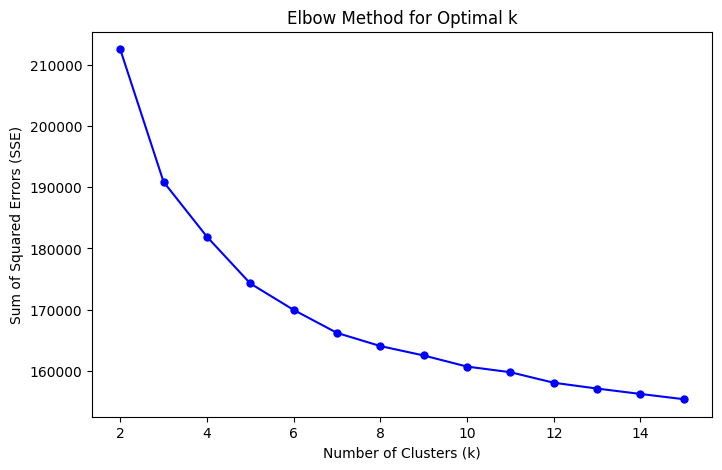

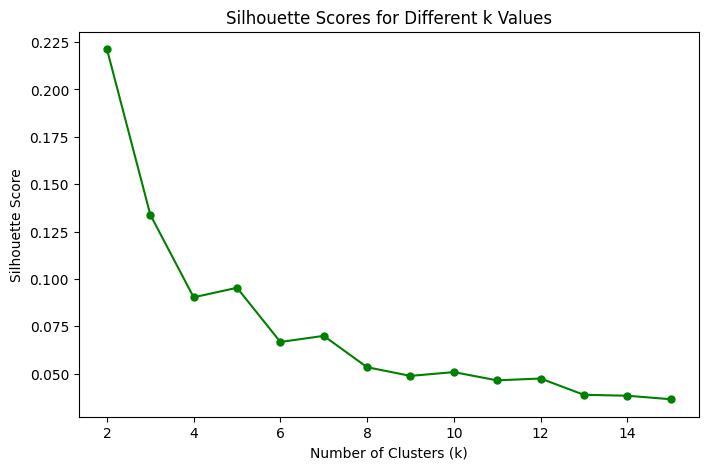

Jumlah cluster optimal berdasarkan Elbow Method: 11
Jumlah cluster optimal berdasarkan Silhouette Score: 2
Jumlah cluster optimal yang digunakan: 11
Silhouette Score untuk 10 cluster: 0.04071437940001488


<ipython-input-6-7f2ad09ed364>:142: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='Cluster', data=subset_data, palette='viridis')


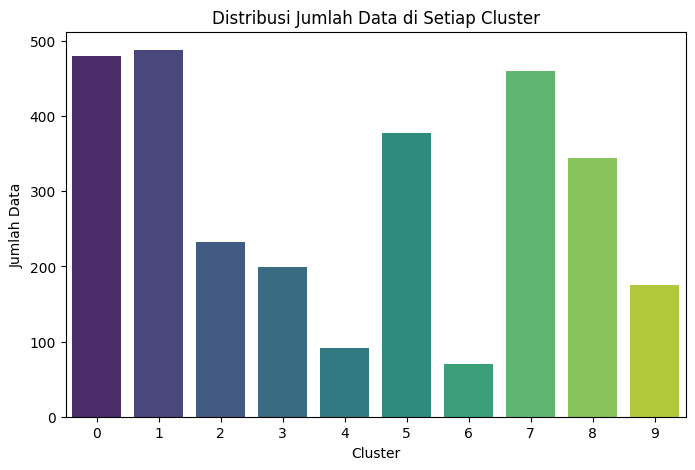

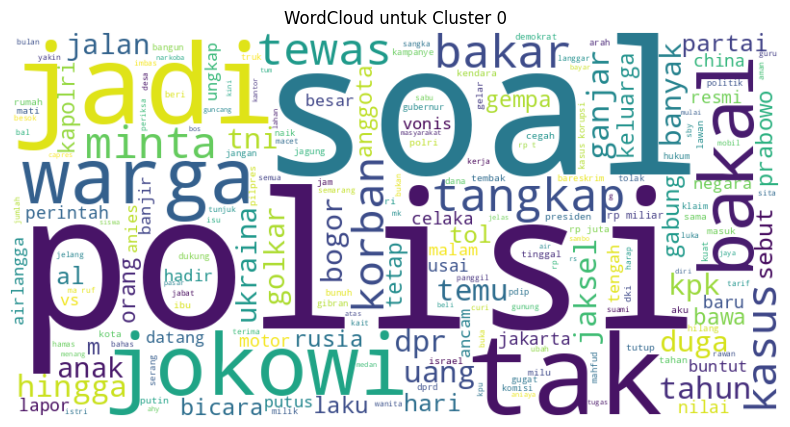

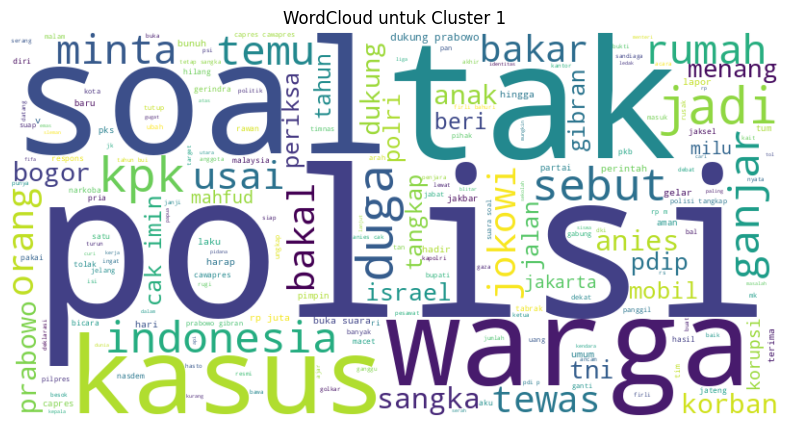

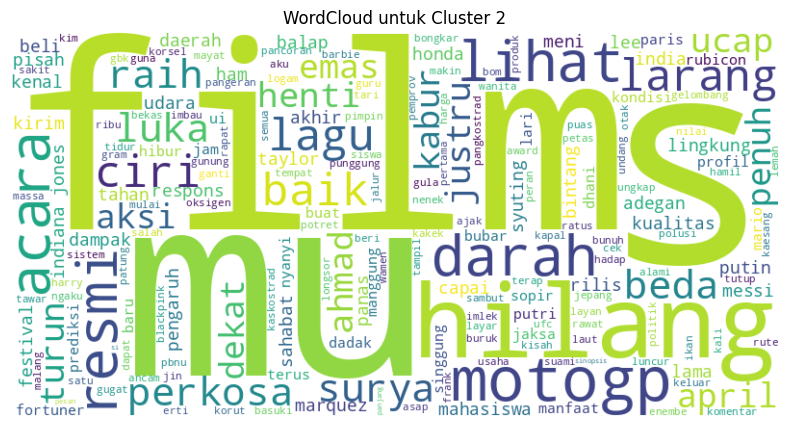

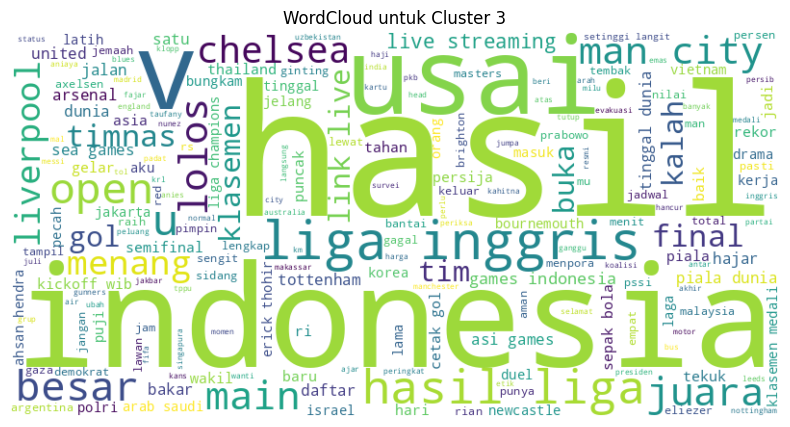

...

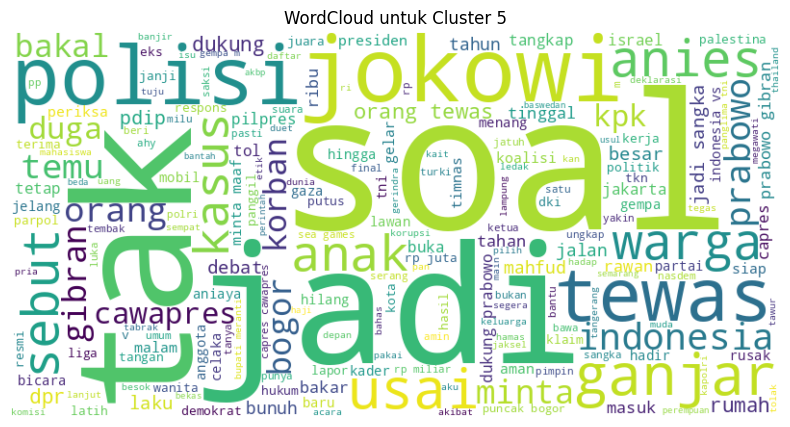

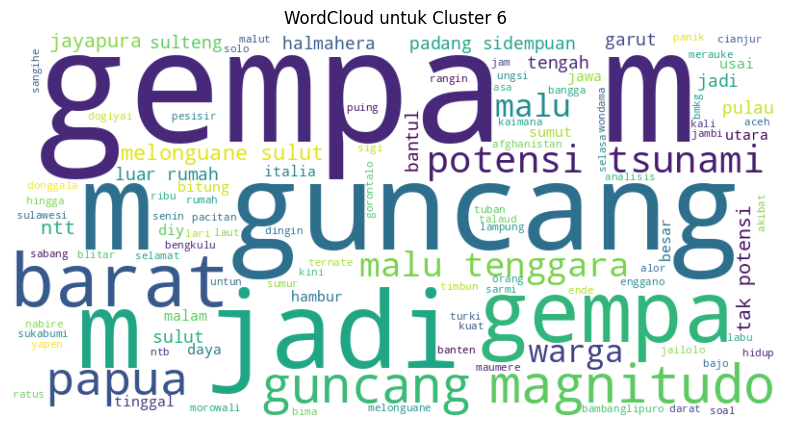

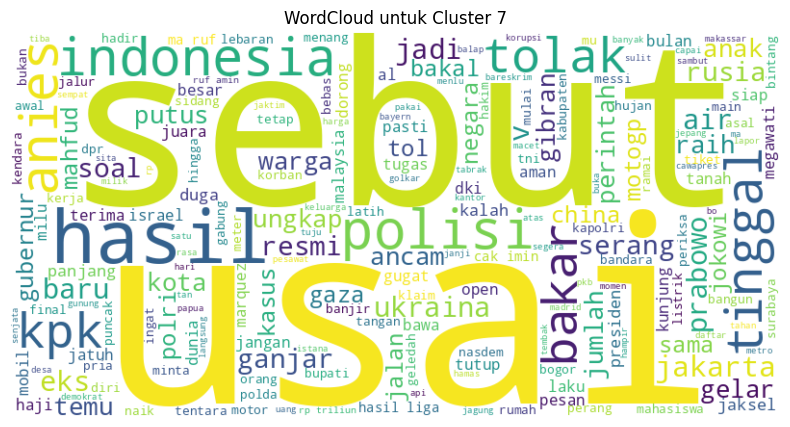

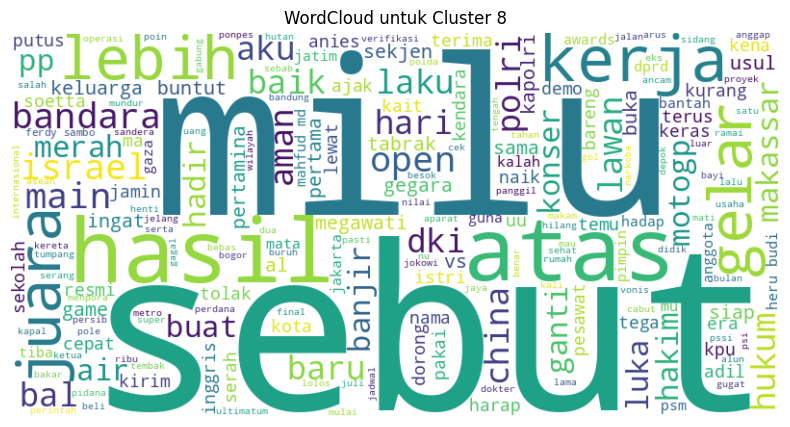

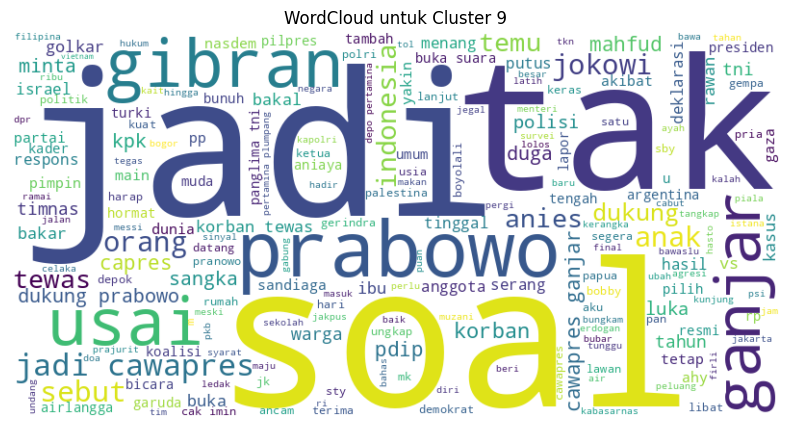


Cluster 0 - Top 10 Words:
polisi: 40
soal: 35
rp: 29
jadi: 29
tak: 29
jokowi: 25
kasus: 21
warga: 21
minta: 19
bakal: 19

Cluster 1 - Top 10 Words:
polisi: 55
soal: 48
tak: 43
warga: 38
kasus: 36
jadi: 36
duga: 35
kpk: 33
prabowo: 33
indonesia: 30

Cluster 2 - Top 10 Words:
the: 8
s: 6
film: 5
mu: 5
hilang: 5
motogp: 5
lihat: 4
darah: 4
acara: 4
resmi: 4

Cluster 3 - Top 10 Words:
hasil: 57
indonesia: 38
liga: 36
usai: 26
vs: 25
inggris: 21
dunia: 18
man: 15
open: 14
u: 14

Cluster 4 - Top 10 Words:
u: 72
indonesia: 63
piala: 57
dunia: 34
timnas: 33
usai: 17
aff: 13
asia: 12
vs: 10
fifa: 10

Cluster 5 - Top 10 Words:
soal: 60
jadi: 55
tewas: 46
tak: 42
prabowo: 40
jokowi: 39
polisi: 38
orang: 35
ganjar: 31
indonesia: 29

Cluster 6 - Top 10 Words:
gempa: 70
m: 61
guncang: 39
jadi: 26
barat: 14
malu: 13
magnitudo: 9
sulut: 8
potensi: 7
tsunami: 7

Cluster 7 - Top 10 Words:
hasil: 21
usai: 18
rp: 16
sebut: 16
polisi: 14
indonesia: 13
anies: 13
tinggal: 12
anak: 11
bakar: 11

Cluster 8 - 

,Cluster,Top Words
0,0,"polisi (40), soal (35), rp (29), jadi (29), ta..."
1,1,"polisi (55), soal (48), tak (43), warga (38), ..."
2,2,"the (8), s (6), film (5), mu (5), hilang (5), ..."
3,3,"hasil (57), indonesia (38), liga (36), usai (2..."
4,4,"u (72), indonesia (63), piala (57), dunia (34)..."
5,5,"soal (60), jadi (55), tewas (46), tak (42), pr..."
6,6,"gempa (70), m (61), guncang (39), jadi (26), b..."
7,7,"hasil (21), usai (18), rp (16), sebut (16), po..."
8,8,"hasil (11), sebut (10), milu (9), atas (8), ke..."
9,9,"jadi (63), soal (40), tak (39), prabowo (37), ..."


In [6]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import seaborn as sns
from gensim.models import Word2Vec
from collections import Counter
from sklearn.decomposition import PCA

# Membaca data hasil
data_hasil = pd.read_csv("/content/drive/MyDrive/projek_pemteks/hasil_data_scrap_remove_stopword.csv")

# Filter data berdasarkan nilai prediksi_label = 0
subset_data = data_hasil[data_hasil['prediksi_label'] == 0].copy()

# Tokenisasi setiap judul
subset_data['tokenized'] = subset_data['title_clean_removestopword'].apply(lambda x: x.lower().split())

# Latih Word2Vec dengan algoritma CBOW
model_cbow = Word2Vec(
    sentences=subset_data['tokenized'].tolist(),  # Input berupa tokenized sentences
    vector_size=100,  # Dimensi vektor embedding
    window=5,         # Window size
    min_count=1,      # Minimal frekuensi kata
    workers=4         # Jumlah thread
)

# Fungsi untuk menghitung rata-rata vektor dokumen
def get_average_vector(tokens, model):
    vectors = [model.wv[token] for token in tokens if token in model.wv]
    if len(vectors) == 0:  # Jika dokumen tidak memiliki kata yang cocok
        return np.zeros(model.vector_size)
    return np.mean(vectors, axis=0)

# Tambahkan kolom rata-rata vektor dokumen
subset_data['doc_vector'] = subset_data['tokenized'].apply(lambda tokens: get_average_vector(tokens, model_cbow))

# Mengubah daftar vektor dokumen menjadi DataFrame
doc_vectors = np.vstack(subset_data['doc_vector'].values)

# Standard Scaling pada data rata-rata vektor dokumen
scaler = StandardScaler()
scaled_data = scaler.fit_transform(doc_vectors)

# PCA
pca_0 = PCA()
pca_0.fit(scaled_data)
U3_0 = np.transpose(pca_0.components_)
C3_0 = pd.DataFrame(scaled_data.dot(U3_0))

I_1 = pd.DataFrame(pca_0.explained_variance_ratio_)
data0 = C3_0.iloc[:, [0, 56]]

# K-Means clustering dan evaluasi
results = {}
sse_values = []
silhouette_scores = []
k_values = range(2, 16)
w2vc = doc_vectors.var(axis=0)
w2vc_total_variance = w2vc.sum()

# Cumulative variance untuk menentukan jumlah komponen PCA
cumulative_variance = np.cumsum(pca_0.explained_variance_ratio_)
num_components_85 = np.argmax(cumulative_variance >= (0.90 * w2vc_total_variance)) + 1  # Komponen yang mencakup >= 85% variansi

# Transformasi data menggunakan PCA dengan komponen terpilih
pca_85 = PCA(n_components=num_components_85)
pca_transformed = pca_85.fit_transform(scaled_data)
print(num_components_85)
# Simpan hasil PCA ke DataFrame
pca_df = pd.DataFrame(pca_transformed, columns=[f'PC{i+1}' for i in range(num_components_85)])

# Hitung total variansi TF-IDF

# Hitung variansi total PCA
total_variance_pca_85 = sum(pca_85.explained_variance_ratio_)

# Bandingkan total variansi PCA dengan 85% total variansi TF-IDF
pca_85_greater_than_w2vc = total_variance_pca_85 >= (0.85 * w2vc_total_variance)

print(f"Total Variance W2VC: {w2vc_total_variance}")
print(f"Total Variance PCA (85% Components): {total_variance_pca_85}")
print(f"PCA Variance >= 85% W2VC Variance? {pca_85_greater_than_w2vc}")

for k in k_values:
    kmeans = KMeans(n_clusters=k, max_iter=1000, random_state=42, n_init=10)
    kmeans_labels = kmeans.fit_predict(scaled_data)
    silhouette_avg = silhouette_score(scaled_data, kmeans_labels)
    sse = kmeans.inertia_
    sse_values.append(sse)
    silhouette_scores.append(silhouette_avg)

# Visualisasi Elbow Method
plt.figure(figsize=(8, 5))
plt.plot(k_values, sse_values, 'bo-', markersize=5)
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Sum of Squared Errors (SSE)")
plt.title("Elbow Method for Optimal k")
plt.show()

# Visualisasi Silhouette Scores
plt.figure(figsize=(8, 5))
plt.plot(k_values, silhouette_scores, 'go-', markersize=5)
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Silhouette Score")
plt.title("Silhouette Scores for Different k Values")
plt.show()

# Pilihan jumlah cluster terbaik berdasarkan Elbow Method
def find_elbow(inertia_values):
    x = np.arange(len(inertia_values))
    y = np.array(inertia_values)
    grad = np.gradient(y)
    elbow_point = np.argmin(grad[1:] - grad[:-1]) + 2  # Offset untuk k mulai dari 2
    return elbow_point

optimal_k_elbow = find_elbow(sse_values)
print(f"Jumlah cluster optimal berdasarkan Elbow Method: {optimal_k_elbow}")

# Pilihan jumlah cluster terbaik berdasarkan Silhouette Score
optimal_k_silhouette = k_values[silhouette_scores.index(max(silhouette_scores))]
print(f"Jumlah cluster optimal berdasarkan Silhouette Score: {optimal_k_silhouette}")

# Pilihan akhir jumlah cluster (gunakan Elbow Method)
optimal_k = optimal_k_elbow
print(f"Jumlah cluster optimal yang digunakan: {optimal_k}")
optimal_k = 10
# Clustering dengan jumlah cluster optimal
kmeans_optimal = KMeans(n_clusters=optimal_k, random_state=42)
subset_data['Cluster'] = kmeans_optimal.fit_predict(scaled_data)


# Hitung Silhouette Score
silhouette_avg = silhouette_score(scaled_data, subset_data['Cluster'])
print(f"Silhouette Score untuk {optimal_k} cluster: {silhouette_avg}")

# Visualisasi distribusi cluster
plt.figure(figsize=(8, 5))
sns.countplot(x='Cluster', data=subset_data, palette='viridis')
plt.title("Distribusi Jumlah Data di Setiap Cluster")
plt.xlabel("Cluster")
plt.ylabel("Jumlah Data")
plt.show()

# Wordcloud untuk setiap cluster
for cluster in range(optimal_k):
    cluster_data = subset_data[subset_data['Cluster'] == cluster]
    text = " ".join(cluster_data['title_clean_removestopword'].to_list())
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.title(f"WordCloud untuk Cluster {cluster}")
    plt.show()

# Top 10 kata paling sering muncul di setiap cluster berdasarkan jumlah kemunculan
for cluster in range(optimal_k):
    cluster_data = subset_data[subset_data['Cluster'] == cluster]
    # Gabungkan semua teks dalam cluster
    text = " ".join(cluster_data['title_clean_removestopword'].to_list())
    # Tokenisasi kata dan hitung frekuensi
    word_counts = Counter(text.split())
    # Ambil 10 kata dengan frekuensi tertinggi
    top_10_words = word_counts.most_common(10)

    print(f"\nCluster {cluster} - Top 10 Words:")
    for word, freq in top_10_words:
        print(f"{word}: {freq}")
print(subset_data['Cluster'].value_counts())
for cluster in range(optimal_k):
    print(f"\nCluster {cluster}:")
    print(subset_data[subset_data['Cluster'] == cluster]['title_clean_removestopword'].head(10))

import pandas as pd

# Membuat list untuk menyimpan hasil
top_words_per_cluster = []

for cluster in range(optimal_k):
    cluster_data_label_1 = subset_data[subset_data['Cluster'] == cluster]
    # Gabungkan semua teks dalam cluster
    text_label_1 = " ".join(cluster_data_label_1['title_clean_removestopword'].to_list())
    # Tokenisasi kata dan hitung frekuensi
    word_counts_label_1 = Counter(text_label_1.split())
    # Ambil 10 kata dengan frekuensi tertinggi
    top_10_words_label_1 = word_counts_label_1.most_common(10)

    # Gabungkan kata dan frekuensinya dalam format "word (frequency)"
    top_10_words_combined = [f"{word} ({freq})" for word, freq in top_10_words_label_1]

    # Simpan hasil dalam list
    top_words_per_cluster.append({
        "Cluster": cluster,
        "Top Words": ", ".join(top_10_words_combined)  # Gabungkan sebagai string
    })

# Konversi hasil ke DataFrame
top_words_df = pd.DataFrame(top_words_per_cluster)

# Tampilkan tabel


# Menyimpan hasil clustering ke file CSV
subset_data.to_csv(f"/content/drive/MyDrive/projek_pemteks/Clustering_Result_word2vec_label_0.csv", index=False)
print(f"Hasil clustering untuk label 0 disimpan ke 'Clustering_Result_label_0.csv'.")
top_words_df


In [ ]:
import pandas as pd

# Baca data hasil clustering
data = pd.read_csv("/content/drive/MyDrive/projek_pemteks/Clustering_Result_word2vec_label_0.csv")

# Kelompokkan data berdasarkan cluster
grouped_data = data.groupby('Cluster')['title'].apply(list)

# Tampilkan judul berita dalam setiap cluster
for cluster, titles in grouped_data.items():
    print(f"\nCluster {cluster}:")
    for i, title in enumerate(titles, 1):
        print(f"{i}. {title}")

In [42]:
import pandas as pd
from collections import Counter

unique_titles_per_cluster_new = []
subset_data_new = pd.read_csv("/content/drive/MyDrive/projek_pemteks/Clustering_Result_word2vec_label_0.csv")

for current_cluster in range(optimal_k):
    cluster_data_current = subset_data_new[subset_data_new['Cluster'] == current_cluster]
    # Gabungkan semua teks dalam cluster
    combined_text_current = " ".join(cluster_data_current['title_clean_removestopword'].to_list())
    # Tokenisasi kata dan hitung frekuensi
    word_counts_current = Counter(combined_text_current.split())
    # Ambil kata paling dominan di cluster ini
    top_word_current = word_counts_current.most_common(1)[0][0]  # Kata dengan frekuensi tertinggi

    # Cari judul berita yang mengandung kata dominan tersebut
    distinguishing_titles_current = cluster_data_current[
        cluster_data_current['title_clean_removestopword'].str.contains(top_word_current, case=False, na=False)
    ]['title'].head(3)  # Ambil maksimal 3 judul yang mengandung kata tersebut

    # Simpan hasil ke dalam list
    unique_titles_per_cluster_new.append({
        "Cluster": current_cluster,
        "Titles": distinguishing_titles_current.tolist()
    })

# Konversi hasil ke DataFrame untuk tampilan yang lebih rapi
distinguishing_titles_df_new = pd.DataFrame(unique_titles_per_cluster_new)

# Tampilkan DataFrame
distinguishing_titles_df_new


,Cluster,Titles
0,0,[Aturan Baru Sri Mulyani: Gaji Minimal Rp 5 Ju...
1,1,[Polisi di Lampung Dikepung Warga Saat Tangkap...
2,2,"[Hasil India Open 2023, Monster Ganda Campuran..."
3,3,"[Balita Tewas di Pasar Rebo, Diduga Jadi Jamin..."
4,4,"[Banjir Semarang Telan Korban Jiwa, Dua Mahasi..."
5,5,"[Soal Teguran Komisi I DPR, Panglima TNI Akan ..."
6,6,"[Gempa Terkini M 5,6 Guncang Pacitan, Tidak Be..."
7,7,[Hasil Malaysia Open 2023: Axelsen Juara dalam...
8,8,[Ahli Unsoed: Jembatan The Geong Banyumas Guna...
9,9,[Hasil Timnas U20 Indonesia Vs Irak 0-2: Garud...


### label 1

78
Total Variance TF-IDF: 0.0003807290631812066
Total Variance PCA (85% Components): 0.8995434939861298
PCA Variance >= 85% TF-IDF Variance? True


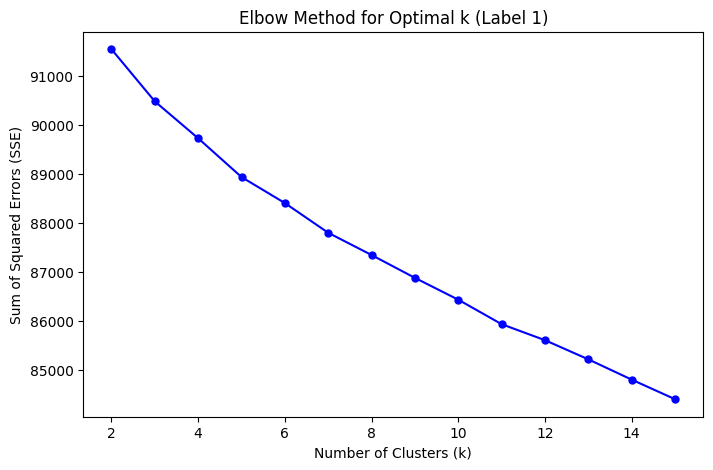

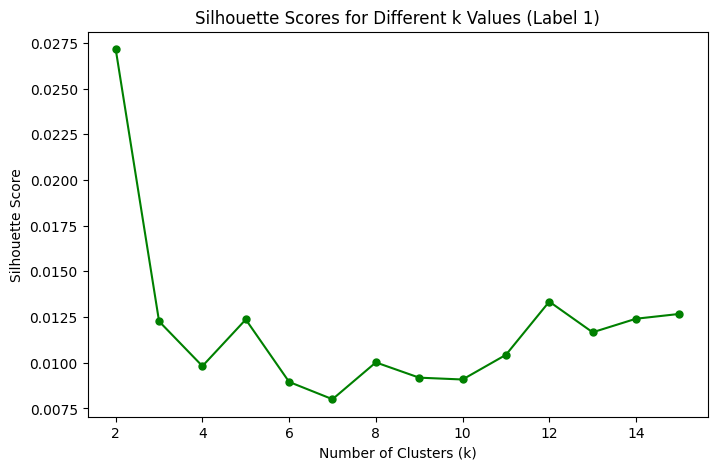

Jumlah cluster optimal berdasarkan Elbow Method (Label 1): 12
Jumlah cluster optimal berdasarkan Silhouette Score (Label 1): 2
Jumlah cluster optimal yang digunakan untuk Label 1: 12
Silhouette Score untuk 12 cluster: 0.013344310224056244


<ipython-input-20-16c533952659>:135: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='Cluster', data=subset_data_label_1, palette='viridis')


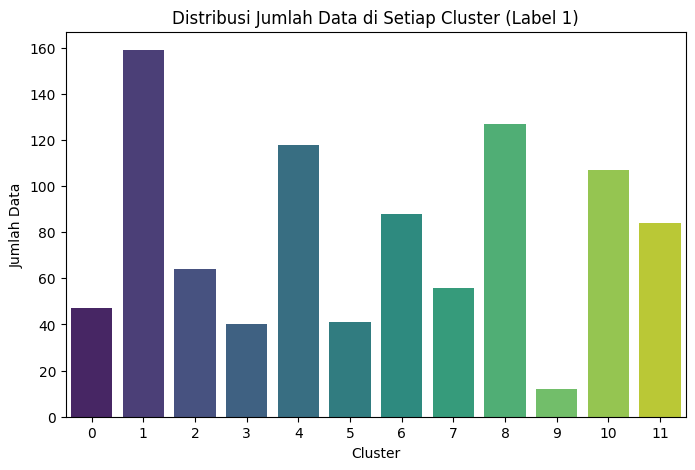

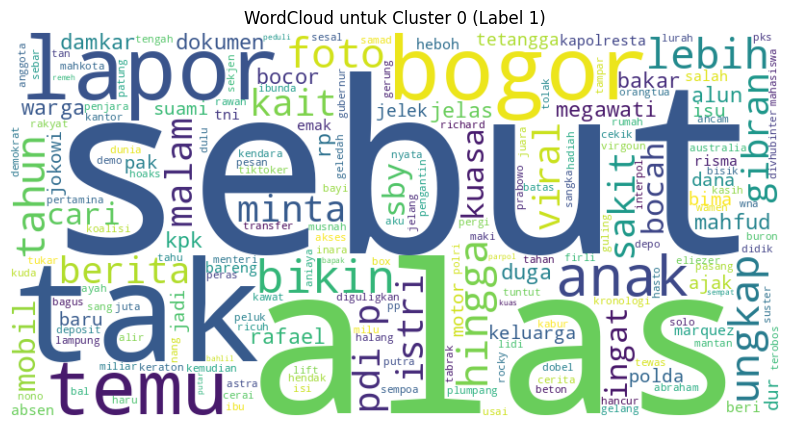

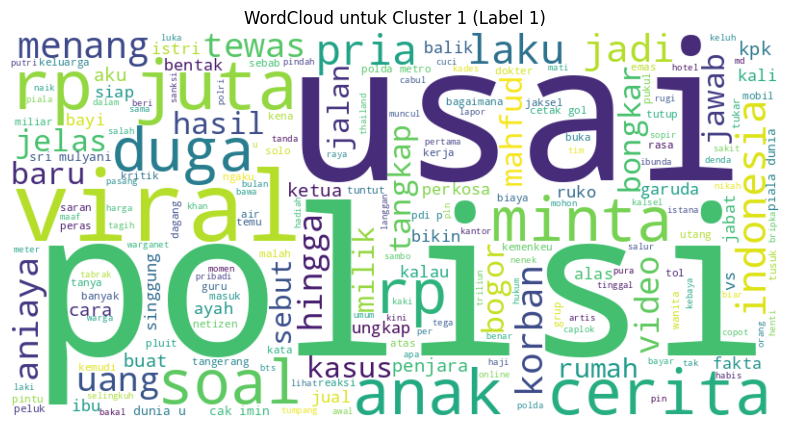

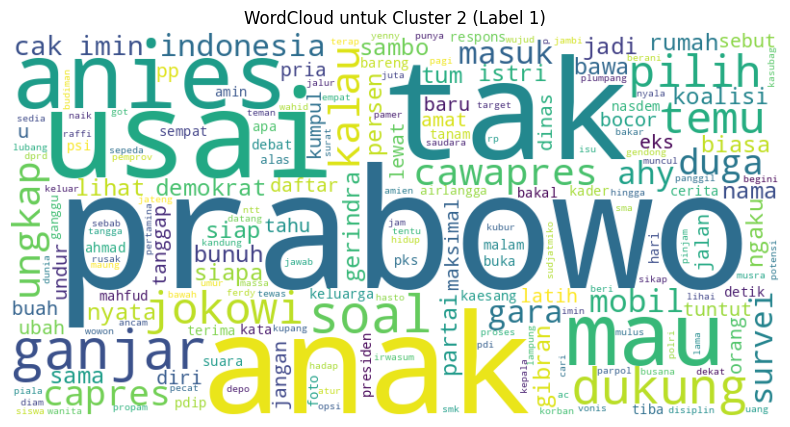

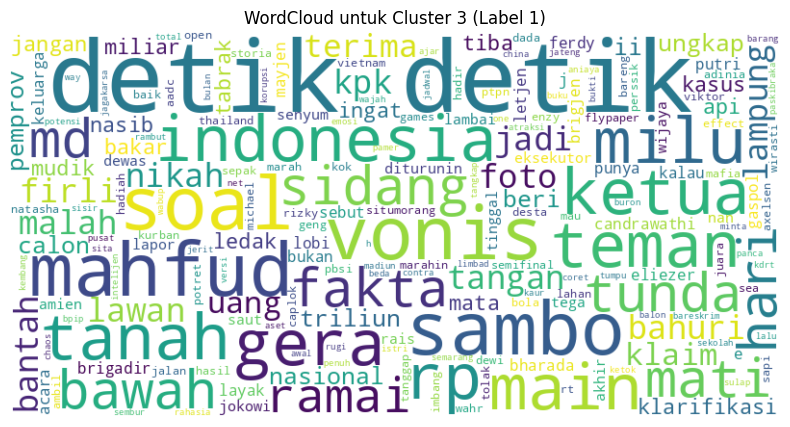

...

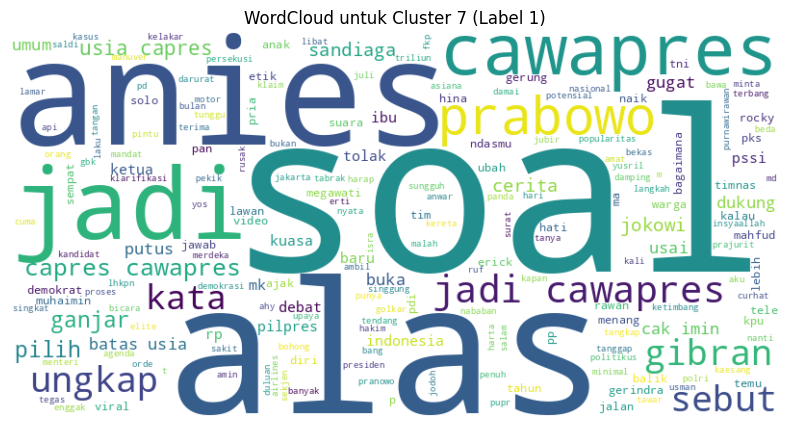

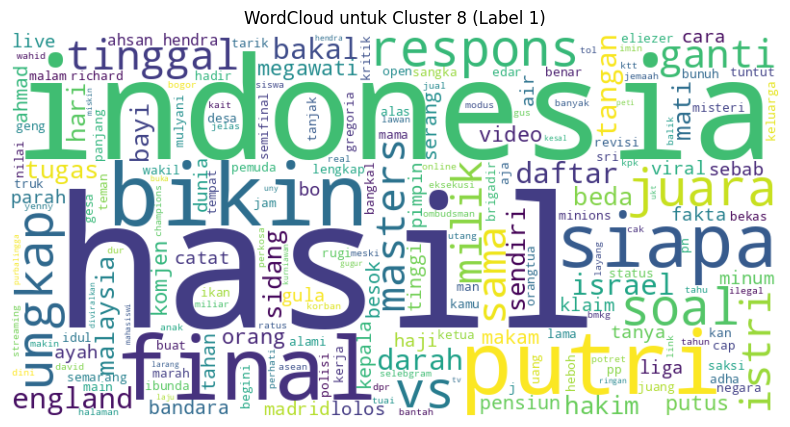

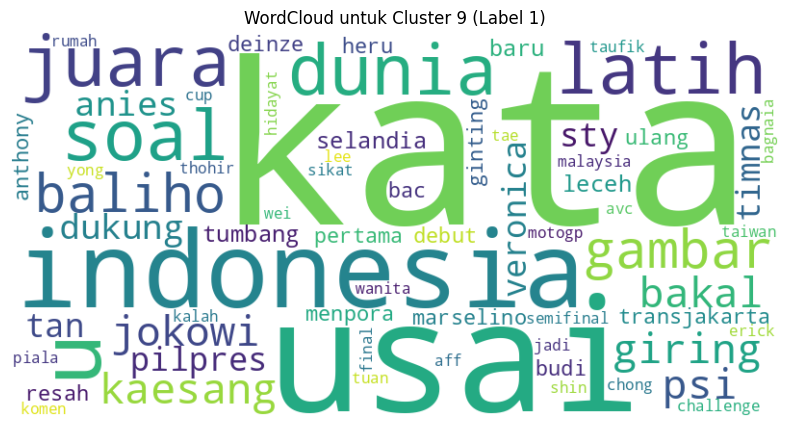

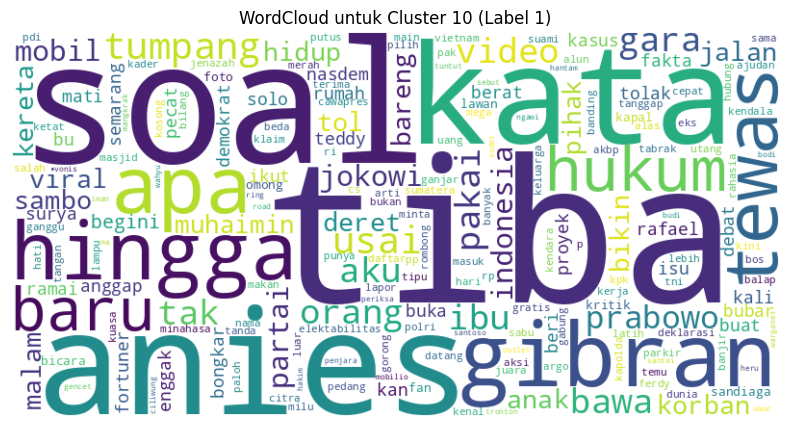

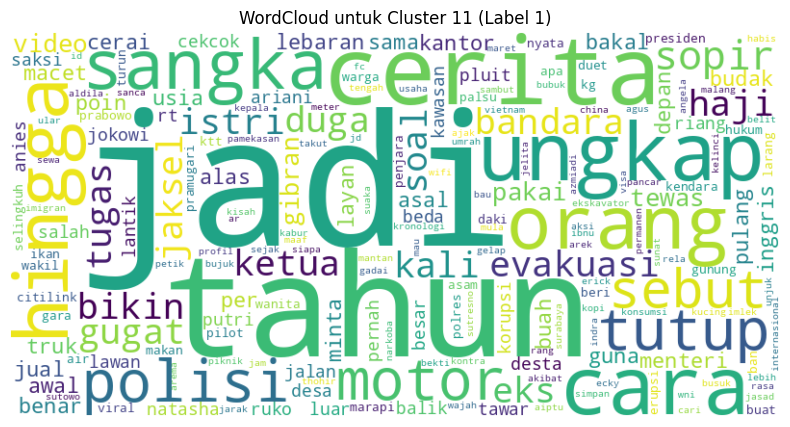


Cluster 0 - Top 10 Words (Label 1):
sebut: 9
alas: 7
tak: 6
bogor: 6
lapor: 6
temu: 5
anak: 5
bikin: 5
lebih: 4
foto: 4

Cluster 1 - Top 10 Words (Label 1):
rp: 30
polisi: 30
usai: 26
viral: 26
juta: 17
cerita: 14
anak: 14
soal: 13
minta: 13
duga: 13

Cluster 2 - Top 10 Words (Label 1):
prabowo: 25
anak: 17
tak: 17
usai: 13
anies: 13
mau: 12
ganjar: 11
soal: 10
dukung: 10
pilih: 8

Cluster 3 - Top 10 Words (Label 1):
detik: 16
sambo: 4
vonis: 4
mahfud: 4
soal: 4
gera: 3
tanah: 3
milu: 3
indonesia: 3
teman: 3

Cluster 4 - Top 10 Words (Label 1):
viral: 13
mobil: 8
bakar: 7
polisi: 7
tinggal: 7
masuk: 7
fakta: 6
warga: 6
prabowo: 6
tewas: 5

Cluster 5 - Top 10 Words (Label 1):
jokowi: 26
temu: 13
video: 7
sebut: 6
ganjar: 4
soal: 4
kata: 4
viral: 3
pdi: 3
p: 3

Cluster 6 - Top 10 Words (Label 1):
ungkap: 25
tak: 23
alas: 10
malam: 10
hasil: 7
diri: 7
bunuh: 6
viral: 6
tni: 6
jalan: 6

Cluster 7 - Top 10 Words (Label 1):
cawapres: 29
jadi: 21
soal: 19
alas: 13
anies: 13
capres: 12
prabow

,Cluster,Top Words
0,0,"sebut (9), alas (7), tak (6), bogor (6), lapor..."
1,1,"rp (30), polisi (30), usai (26), viral (26), j..."
2,2,"prabowo (25), anak (17), tak (17), usai (13), ..."
3,3,"detik (16), sambo (4), vonis (4), mahfud (4), ..."
4,4,"viral (13), mobil (8), bakar (7), polisi (7), ..."
5,5,"jokowi (26), temu (13), video (7), sebut (6), ..."
6,6,"ungkap (25), tak (23), alas (10), malam (10), ..."
7,7,"cawapres (29), jadi (21), soal (19), alas (13)..."
8,8,"hasil (11), indonesia (7), putri (6), final (6..."
9,9,"kata (21), usai (8), indonesia (5), u (3), soa..."


In [20]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import seaborn as sns
from gensim.models import Word2Vec
from collections import Counter

# Membaca data hasil
data_hasil = pd.read_csv("/content/drive/MyDrive/projek_pemteks/hasil_data_scrap_remove_stopword.csv")

# Filter data berdasarkan nilai prediksi_label = 1
subset_data_label_1 = data_hasil[data_hasil['prediksi_label'] == 1].copy()

# Tokenisasi setiap judul
subset_data_label_1['tokenized'] = subset_data_label_1['title_clean_removestopword'].apply(lambda x: x.lower().split())

# Latih Word2Vec dengan algoritma CBOW untuk label 1
model_cbow_label_1 = Word2Vec(
    sentences=subset_data_label_1['tokenized'].tolist(),  # Input berupa tokenized sentences
    vector_size=100,  # Dimensi vektor embedding
    window=5,         # Window size
    min_count=1,      # Minimal frekuensi kata
    workers=4         # Jumlah thread
)

# Fungsi untuk menghitung rata-rata vektor dokumen
def get_average_vector_label_1(tokens, model):
    vectors = [model.wv[token] for token in tokens if token in model.wv]
    if len(vectors) == 0:  # Jika dokumen tidak memiliki kata yang cocok
        return np.zeros(model.vector_size)
    return np.mean(vectors, axis=0)

# Tambahkan kolom rata-rata vektor dokumen untuk label 1
subset_data_label_1['doc_vector'] = subset_data_label_1['tokenized'].apply(lambda tokens: get_average_vector_label_1(tokens, model_cbow_label_1))

# Mengubah daftar vektor dokumen menjadi DataFrame
doc_vectors_label_1 = np.vstack(subset_data_label_1['doc_vector'].values)

# Standard Scaling pada data rata-rata vektor dokumen untuk label 1
scaler_label_1 = StandardScaler()
scaled_data_label_1 = scaler_label_1.fit_transform(doc_vectors_label_1)

# PCA
pca_1 = PCA()
pca_1.fit(scaled_data_label_1)
U3_1 = np.transpose(pca_1.components_)
C3_1 = pd.DataFrame(scaled_data_label_1.dot(U3_1))

I_1 = pd.DataFrame(pca_1.explained_variance_ratio_)
data1 = C3_1.iloc[:, [0, 78]]

# K-Means clustering dan evaluasi untuk label 1
results_label_1 = {}
sse_values_label_1 = []
silhouette_scores_label_1 = []
k_values_label_1 = range(2, 16)

# Cumulative variance untuk menentukan jumlah komponen PCA
cumulative_variance = np.cumsum(pca_1.explained_variance_ratio_)
num_components_85 = np.argmax(cumulative_variance >= 0.90) + 1  # Komponen yang mencakup >= 85% variansi

# Transformasi data menggunakan PCA dengan komponen terpilih
pca_85 = PCA(n_components=num_components_85)
pca_transformed = pca_85.fit_transform(scaled_data_label_1)
print(num_components_85)

# Simpan hasil PCA ke DataFrame
pca_df = pd.DataFrame(pca_transformed, columns=[f'PC{i+1}' for i in range(num_components_85)])

# Hitung total variansi TF-IDF
w2vc = doc_vectors_label_1.var(axis=0)
w2vc_total_variance = w2vc.sum()

# Hitung variansi total PCA
total_variance_pca_85 = sum(pca_85.explained_variance_ratio_)

# Bandingkan total variansi PCA dengan 85% total variansi TF-IDF
pca_85_greater_than_w2vc = total_variance_pca_85 >= (0.85 * w2vc_total_variance)

print(f"Total Variance TF-IDF: {w2vc_total_variance}")
print(f"Total Variance PCA (85% Components): {total_variance_pca_85}")
print(f"PCA Variance >= 85% TF-IDF Variance? {pca_85_greater_than_w2vc}")

for k in k_values_label_1:
    kmeans_label_1 = KMeans(n_clusters=k, max_iter=1000, random_state=42, n_init=10)
    kmeans_labels_label_1 = kmeans_label_1.fit_predict(scaled_data_label_1)
    silhouette_avg_label_1 = silhouette_score(scaled_data_label_1, kmeans_labels_label_1)
    sse = kmeans_label_1.inertia_
    sse_values_label_1.append(sse)
    silhouette_scores_label_1.append(silhouette_avg_label_1)

# Visualisasi Elbow Method untuk label 1
plt.figure(figsize=(8, 5))
plt.plot(k_values_label_1, sse_values_label_1, 'bo-', markersize=5)
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Sum of Squared Errors (SSE)")
plt.title("Elbow Method for Optimal k (Label 1)")
plt.show()

# Visualisasi Silhouette Scores untuk label 1
plt.figure(figsize=(8, 5))
plt.plot(k_values_label_1, silhouette_scores_label_1, 'go-', markersize=5)
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Silhouette Score")
plt.title("Silhouette Scores for Different k Values (Label 1)")
plt.show()

# Pilihan jumlah cluster terbaik berdasarkan Elbow Method untuk label 1
optimal_k_elbow_label_1 = find_elbow(sse_values_label_1)
print(f"Jumlah cluster optimal berdasarkan Elbow Method (Label 1): {optimal_k_elbow_label_1}")

# Pilihan jumlah cluster terbaik berdasarkan Silhouette Score untuk label 1
optimal_k_silhouette_label_1 = k_values_label_1[silhouette_scores_label_1.index(max(silhouette_scores_label_1))]
print(f"Jumlah cluster optimal berdasarkan Silhouette Score (Label 1): {optimal_k_silhouette_label_1}")

# Pilihan akhir jumlah cluster (gunakan Elbow Method) untuk label 1
optimal_k_label_1 = optimal_k_elbow_label_1
print(f"Jumlah cluster optimal yang digunakan untuk Label 1: {optimal_k_label_1}")

# Clustering dengan jumlah cluster optimal untuk Label 1
kmeans_optimal_label_1 = KMeans(n_clusters=optimal_k_label_1, random_state=42)
subset_data_label_1['Cluster'] = kmeans_optimal_label_1.fit_predict(scaled_data_label_1)
from sklearn.metrics import silhouette_score

# Hitung Silhouette Score
silhouette_avg = silhouette_score(scaled_data_label_1, subset_data_label_1['Cluster'])
print(f"Silhouette Score untuk {optimal_k_label_1} cluster: {silhouette_avg}")

# Visualisasi distribusi cluster untuk Label 1
plt.figure(figsize=(8, 5))
sns.countplot(x='Cluster', data=subset_data_label_1, palette='viridis')
plt.title("Distribusi Jumlah Data di Setiap Cluster (Label 1)")
plt.xlabel("Cluster")
plt.ylabel("Jumlah Data")
plt.show()

# Wordcloud untuk setiap cluster (Label 1)
for cluster in range(optimal_k_label_1):
    cluster_data_label_1 = subset_data_label_1[subset_data_label_1['Cluster'] == cluster]
    text_label_1 = " ".join(cluster_data_label_1['title_clean_removestopword'].to_list())
    wordcloud_label_1 = WordCloud(width=800, height=400, background_color='white').generate(text_label_1)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud_label_1, interpolation='bilinear')
    plt.axis("off")
    plt.title(f"WordCloud untuk Cluster {cluster} (Label 1)")
    plt.show()

# Top 10 kata paling sering muncul di setiap cluster berdasarkan jumlah kemunculan (Label 1)
for cluster in range(optimal_k_label_1):
    cluster_data_label_1 = subset_data_label_1[subset_data_label_1['Cluster'] == cluster]
    # Gabungkan semua teks dalam cluster
    text_label_1 = " ".join(cluster_data_label_1['title_clean_removestopword'].to_list())
    # Tokenisasi kata dan hitung frekuensi
    word_counts_label_1 = Counter(text_label_1.split())
    # Ambil 10 kata dengan frekuensi tertinggi
    top_10_words_label_1 = word_counts_label_1.most_common(10)

    print(f"\nCluster {cluster} - Top 10 Words (Label 1):")
    for word, freq in top_10_words_label_1:
        print(f"{word}: {freq}")

import pandas as pd

# Membuat list untuk menyimpan hasil
top_words_per_cluster = []

for cluster in range(optimal_k_label_1):
    cluster_data_label_1 = subset_data_label_1[subset_data_label_1['Cluster'] == cluster]
    # Gabungkan semua teks dalam cluster
    text_label_1 = " ".join(cluster_data_label_1['title_clean_removestopword'].to_list())
    # Tokenisasi kata dan hitung frekuensi
    word_counts_label_1 = Counter(text_label_1.split())
    # Ambil 10 kata dengan frekuensi tertinggi
    top_10_words_label_1 = word_counts_label_1.most_common(10)

    # Gabungkan kata dan frekuensinya dalam format "word (frequency)"
    top_10_words_combined = [f"{word} ({freq})" for word, freq in top_10_words_label_1]

    # Simpan hasil dalam list
    top_words_per_cluster.append({
        "Cluster": cluster,
        "Top Words": ", ".join(top_10_words_combined)  # Gabungkan sebagai string
    })

# Konversi hasil ke DataFrame
top_words_df = pd.DataFrame(top_words_per_cluster)

# Tampilkan tabel

print(subset_data_label_1['Cluster'].value_counts())
# Menyimpan hasil clustering ke file CSV (Label 1)
subset_data_label_1.to_csv(f"/content/drive/MyDrive/projek_pemteks/Clustering_Result_word2vec_label_1.csv", index=False)
print(f"Hasil clustering untuk Label 1 disimpan ke 'Clustering_Result_label_1.csv'.")
top_words_df


In [58]:
import pandas as pd

# Baca data hasil clustering
data = pd.read_csv("/content/drive/MyDrive/projek_pemteks/Clustering_Result_word2vec_label_1.csv")

# Kelompokkan data berdasarkan cluster
grouped_data = data.groupby('Cluster')['title'].apply(list)

# Tampilkan judul berita dalam setiap cluster
for cluster, titles in grouped_data.items():
    print(f"\nCluster {cluster}:")
    for i, title in enumerate(titles, 1):
        print(f"{i}. {title}")


Cluster 0:
1. Enggan Dianggap Politis, KPK Mengaku Usut Perkara di Kemnaker Jauh Sebelum Deklarasi Anies-Muhaimin
2. Ada Dokumen Hendak Dimusnahkan Saat KPK Geledah Kantor Kementan, Diduga Terkait Aliran Dana
3. 4 Penjelasan Menpora Usai Harta 'Hadiah' Hampir Bikin Sejarah di KPK
4. Polisi Masih Selidiki Bagaimana 2 Bayi di Bogor Bisa Tertukar
5. AHY Ngaku Sudah Tahu Nama Cawapres Pilihan Anies
6. Museum Nasional Kebakaran, Bagaimana Nasib Benda Bersejarah di Dalam?
7. UU KPK Direvisi Lagi Jika Menang Pilpres? Ini Jawaban Mahfud

Cluster 1:
1. Resepsi 1 Abad NU Sukses, PBNU Ucapkan Terima Kasih, Janji Tak Gelar Acara Besar Lagi
2. GASPOL! Hari Ini: PDI-P Tolak Israel di Piala Dunia U-20, Takut Jokowi Dimakzulkan?
3. Antre 4 Jam di Pelabuhan Bakauheni, Adit Ngamuk Diserobot Rombongan Mobil Mewah Saat Masuk Kapal
4. Link dan Cara Beli Tiket Konser Coldplay Presale via BCA serta Harganya
5. Balapan Malam Ini, Berikut Link Live Streaming MotoGP Italia 2023
6. PPK Tak Tahu Progres Proyek B

<ipython-input-18-3a3fe9aca9c9>:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Frequency", y="Word", data=top_10_df, palette="viridis")


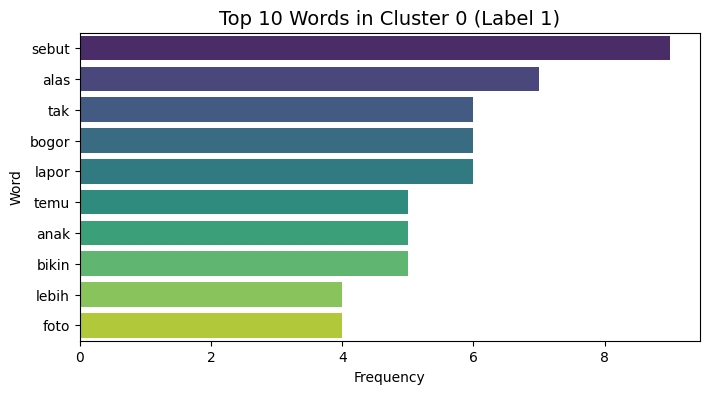

<ipython-input-18-3a3fe9aca9c9>:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Frequency", y="Word", data=top_10_df, palette="viridis")


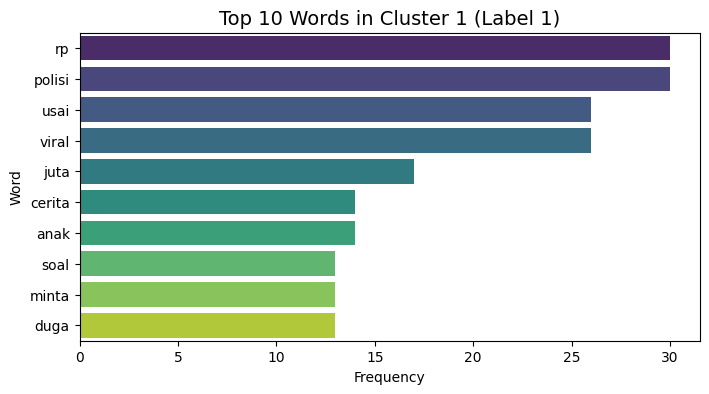

<ipython-input-18-3a3fe9aca9c9>:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Frequency", y="Word", data=top_10_df, palette="viridis")


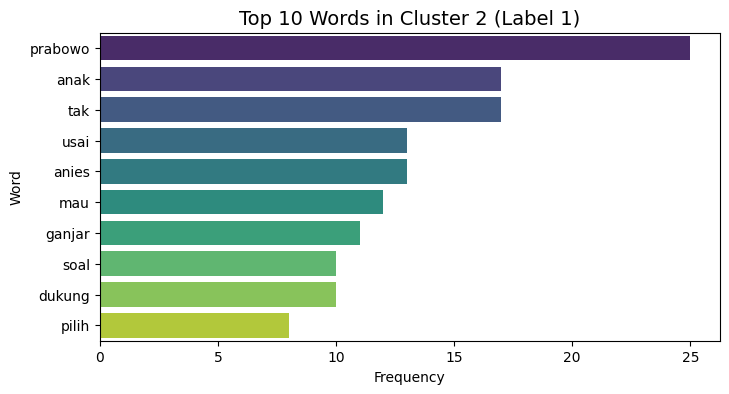

<ipython-input-18-3a3fe9aca9c9>:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Frequency", y="Word", data=top_10_df, palette="viridis")


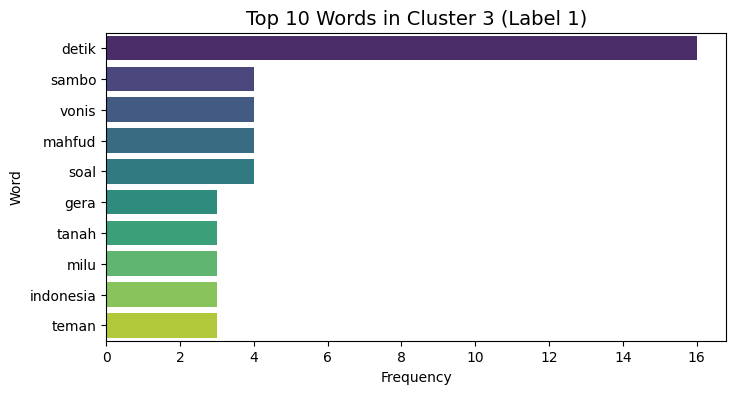

<ipython-input-18-3a3fe9aca9c9>:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Frequency", y="Word", data=top_10_df, palette="viridis")


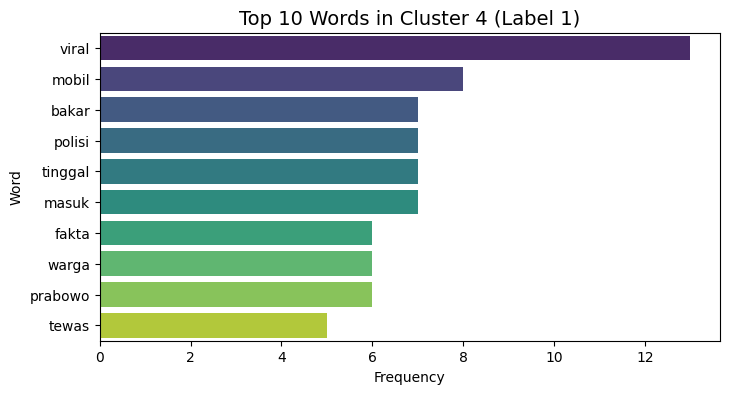

<ipython-input-18-3a3fe9aca9c9>:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Frequency", y="Word", data=top_10_df, palette="viridis")


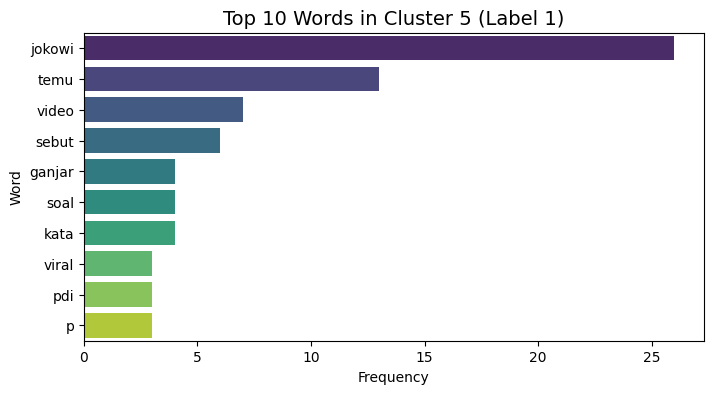

<ipython-input-18-3a3fe9aca9c9>:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Frequency", y="Word", data=top_10_df, palette="viridis")


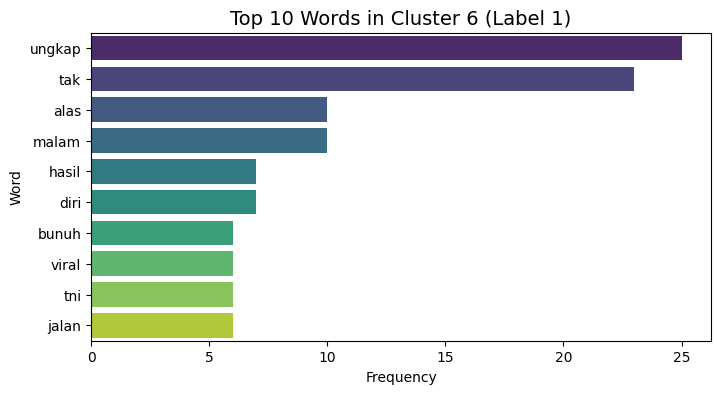

<ipython-input-18-3a3fe9aca9c9>:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Frequency", y="Word", data=top_10_df, palette="viridis")


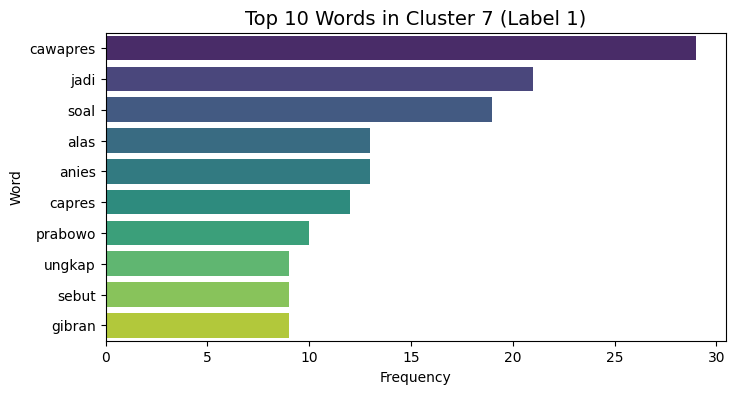

<ipython-input-18-3a3fe9aca9c9>:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Frequency", y="Word", data=top_10_df, palette="viridis")


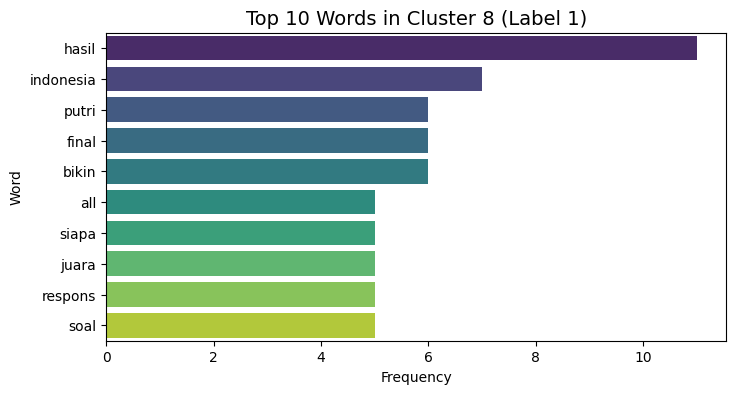

<ipython-input-18-3a3fe9aca9c9>:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Frequency", y="Word", data=top_10_df, palette="viridis")


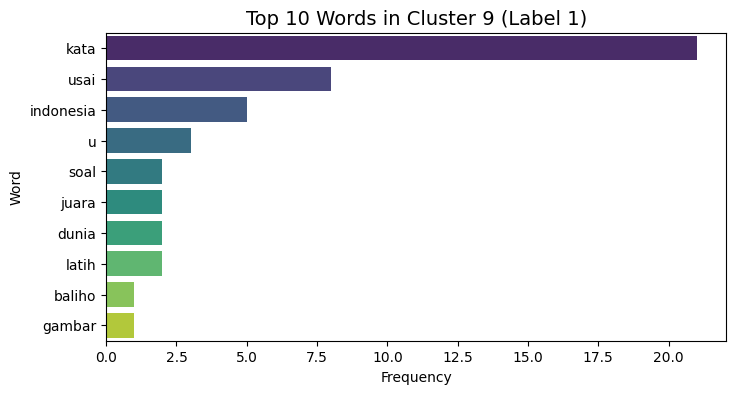

<ipython-input-18-3a3fe9aca9c9>:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Frequency", y="Word", data=top_10_df, palette="viridis")


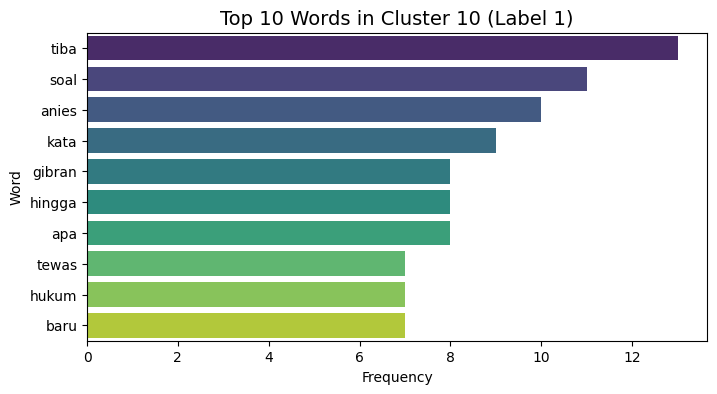

<ipython-input-18-3a3fe9aca9c9>:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Frequency", y="Word", data=top_10_df, palette="viridis")


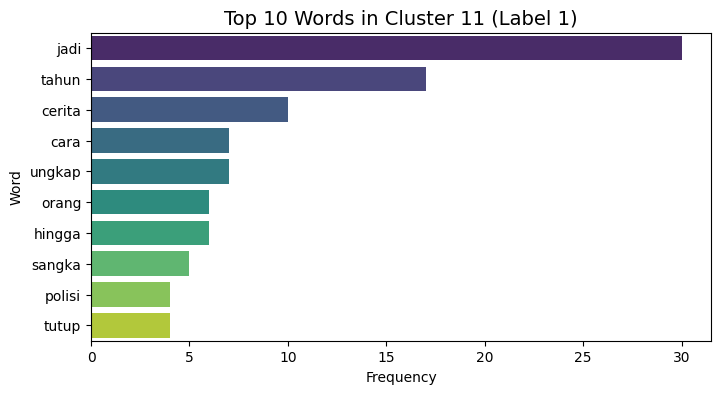

In [18]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plot top 10 words untuk setiap cluster
for cluster in range(optimal_k_label_1):
    cluster_data_label_1 = subset_data_label_1[subset_data_label_1['Cluster'] == cluster]
    text_label_1 = " ".join(cluster_data_label_1['title_clean_removestopword'].to_list())
    word_counts_label_1 = Counter(text_label_1.split())
    top_10_words_label_1 = word_counts_label_1.most_common(10)

    # Buat DataFrame untuk visualisasi
    top_10_df = pd.DataFrame(top_10_words_label_1, columns=["Word", "Frequency"])

    # Plot
    plt.figure(figsize=(8, 4))
    sns.barplot(x="Frequency", y="Word", data=top_10_df, palette="viridis")
    plt.title(f"Top 10 Words in Cluster {cluster} (Label 1)", fontsize=14)
    plt.xlabel("Frequency")
    plt.ylabel("Word")
    plt.show()


In [33]:
unique_titles_per_cluster = []
subset_data_label_1 = pd.read_csv("/content/drive/MyDrive/projek_pemteks/Clustering_Result_word2vec_label_1.csv")
for cluster in range(optimal_k_label_1):
    cluster_data_label_1 = subset_data_label_1[subset_data_label_1['Cluster'] == cluster]
    # Gabungkan semua teks dalam cluster
    text_label_1 = " ".join(cluster_data_label_1['title_clean_removestopword'].to_list())
    # Tokenisasi kata dan hitung frekuensi
    word_counts_label_1 = Counter(text_label_1.split())
    # Ambil kata paling dominan di cluster ini
    top_word = word_counts_label_1.most_common(1)[0][0]  # Kata dengan frekuensi tertinggi

    # Cari judul berita yang mengandung kata dominan tersebut
    distinguishing_titles = cluster_data_label_1[
        cluster_data_label_1['title_clean_removestopword'].str.contains(top_word, case=False, na=False)
    ]['title'].head(3)  # Ambil maksimal 3 judul yang mengandung kata tersebut

    # Simpan hasil ke dalam list
    unique_titles_per_cluster.append({
        "Cluster": cluster,
        "Top Word": top_word,
        "Distinguishing Titles": distinguishing_titles.tolist()
    })

# Konversi hasil ke DataFrame untuk tampilan yang lebih rapi
distinguishing_titles_df = pd.DataFrame(unique_titles_per_cluster)

# Filter judul yang mengandung clickbait
clickbait_indicators = [
    "heboh", "mengejutkan", "tak disangka", "menggemparkan",
    "ini alasannya", "apa yang terjadi", "bikin kaget",
    "tidak percaya", "terungkap", "fakta mengejutkan", "benar-benar", "tidak terduga",
    "terbaru", "viral", "bukti nyata", "terungkap fakta", "kamu pasti tidak tahu",
    "wow", "kejadian langka", "ini dia", "penasaran", "jangan lewatkan", "selalu bikin terkejut",
    "tak pernah terbayangkan", "ternyata", "hebohkan dunia", "berita besar", "menggemparkan netizen",
    "terjadi di dunia nyata", "sedang ramai diperbincangkan", "sekarang juga", "langsung tonton",
    "wajib baca", "kaget banget", "rahasia besar", "misteri yang belum terungkap", "berita terbaik",
    "dijamin", "tidak pernah terpikirkan", "sungguh mengejutkan", "berita sensasional", "kesempatan langka",
    "bukan main", "ini alasan kenapa", "gila", "tidak akan percaya", "kejadian aneh", "berita bombastis",
    "cara mudah", "pecahkan misteri", "fakta menakjubkan", "terkini", "yakin kamu tahu",
    "inilah yang terjadi", "wow banget", "kebetulan", "penemuan mengejutkan", "berita luar biasa",
    "seram", "ini mengubah segalanya", "terkejut", "meninggalkan pertanyaan", "satu-satunya cara",
    "dari semua yang terjadi", "bikin kamu tercengang", "sudah tahu belum", "berita mengguncang",
    "jangan sampai terlambat", "sesuatu yang luar biasa", "hadiah besar", "kebetulan atau tidak",
    "rahasia yang terungkap", "masih hangat", "membuat heboh", "berita mendunia", "terkejut dengan hasilnya",
    "kamu harus tahu", "terjadi perubahan besar", "cerita luar biasa", "tunggu dulu", "berita menggemparkan dunia",
    "tidak ada yang menduga", "kamu gak akan percaya", "jangan sampai ketinggalan", "membuat gempar dunia maya",
    "ini bukan hoax", "ini yang seharusnya kamu ketahui", "akan membuatmu tercengang",
    "terungkapnya misteri", "wow sekali", "penemuan yang mengejutkan", "ini baru pertama kali",
    "berita sensasional terkini", "momen langka", "lihat ini", "kaget banget dengan apa yang terjadi",
    "sebuah kejutan", "peristiwa mengejutkan", "fakta yang memukau", "menghentak dunia",
    "berita mengejutkan hari ini", "hal yang tidak diketahui banyak orang", "mungkin kamu belum tahu",
    "inilah yang benar-benar terjadi", "tidak bisa dipercaya", "kejadian besar", "saksikan sekarang juga",
    "pecahkan teka-teki", "berita dunia", "ini fakta yang perlu diketahui", "rahasia yang perlu diungkap",
    "semua orang akan berbicara tentang ini", "jangan sampai menyesal", "sudahkah kamu tahu",
    "terungkapnya rahasia", "berita penuh kejutan", "tak terbayangkan sebelumnya", "momen yang sangat langka",    "Yang Kamu Tidak Tahu", "Sekarang", "Bersiap-Siap", "Yang Menggemparkan Dunia", "Ini Jawabannya",
    "Yang Terjadi", "Kamu Pasti Kaget", "Tidak Terduga", "Bukti Ditemukan", "Mengubah Segalanya",
    "Hanya Ada di Sini", "Ada yang Terungkap", "Hasil Mengejutkan", "Kamu Harus Tahu", "Ini Yang Menarik",
    "Terjadi Begitu Saja", "Masih Banyak Yang Belum Tahu", "Bagaimana Ini Bisa Terjadi",
    "Berita Terpanas", "Akan Membuatmu Terkejut", "Pasti Mengubah Pikiranmu", "Bukan Sekadar Hoax",    "Terungkap", "Mengejutkan", "Bikin Kaget", "Tidak Percaya", "Heboh", "Aneh", "Buktikan",
    "Jangan Percaya", "Ini Alasan", "Sungguh", "Benar-Benar", "Kamu Tidak Akan Percaya", "Ternyata",
    "Ini yang Terjadi", "Fakta Menakjubkan", "Tunggu Dulu", "Selalu Bikin Heboh", "Kebetulan", "Langsung Lihat",
    "Jangan Lewatkan", "Wajib Tahu", "Saksikan", "Misteri Terungkap", "Semua Orang Tak Sangka",
    "Cek Fakta", "Baca Ini", "Inilah Yang Terjadi", "Ini Dia", "Tunggu Sampai Kamu Lihat", "Penasaran",
    "Berita Terbaru", "Bikin Terkejut", "Jangan Sampai Ketinggalan", "Satu-satunya", "Hanya Di Sini", "Luar Biasa"
]

# Fungsi untuk memeriksa apakah judul mengandung indikator clickbait
def is_clickbait(title, indicators):
    for indicator in indicators:
        if indicator in title.lower():
            return True
    return False

# Filter judul berdasarkan indikator clickbait dan tampilkan semua judul
filtered_clickbait_titles = []

for item in unique_titles_per_cluster:
    cluster = item['Cluster']
    titles = item['Distinguishing Titles']

    # Tentukan apakah setiap judul termasuk clickbait atau tidak
    filtered_titles = [title for title in titles]  # Menampilkan semua judul

    # Tambahkan hasil ke list
    filtered_clickbait_titles.append({
        "Cluster": cluster,
        "Titles": filtered_titles
    })

# Konversi hasil filter ke DataFrame
filtered_clickbait_df = pd.DataFrame(filtered_clickbait_titles)

filtered_clickbait_df


,Cluster,Filtered Titles
0,0,[Sang Ibu Sebut Nono Bocah Juara Sempoa Dunia ...
1,1,[LSM Minta Uang Damai Rp 200 Juta Kasus Pemerk...
2,2,[Daftar 6 Nama Capres-Cawapres 2024 yang Muncu...
3,3,"[Detik-detik Terakhir Sebelum Meninggal, Nani ..."
4,4,"[Video Viral CVT Honda PCX 160 Jebol, Ini Penj..."
5,5,[Ketika Jokowi Menyebut Gibran dengan Panggila...
6,6,[Korban Pembunuhan Berantai di Cianjur Sudah L...
7,7,[PAN Ungkap Alasan Dukung Ganjar-Erick Jadi Ca...
8,8,[Hasil Lengkap Malaysia Open 2023 Hari Ini: Mi...
9,9,"[Soal Baliho Bergambar Kaesang dengan Jokowi, ..."


# SIMILARITY DATA SCRAP

## Cosine Similarity

### TFIDF

****NO REMOVE STOPWORDS****

In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity

df = pd.read_csv(r"/content/drive/MyDrive/Pemrosesan Teks/data_scrap_full.csv")

vectorizer = TfidfVectorizer()
title_tfidf = vectorizer.fit_transform(df['title_clean_no_remove_stopwords'])
content_tfidf = vectorizer.transform(df['content_clean_no_remove_stopwords'])

df['similarity_no_remove'] = [
    cosine_similarity(title_tfidf[i], content_tfidf[i])[0][0]
    for i in range(len(df))
]

thresholds = [0.3, 0.5, 0.7]

for threshold in thresholds:
    df[f'label_threshold_{threshold}'] = df['similarity'].apply(lambda x: 1 if x < threshold else 0)

output_file = r"/content/drive/MyDrive/Pemrosesan Teks/data_scrap_full.csv"
df.to_csv(output_file, index=False, encoding='utf-8')
print(f"Data with similarity and labels saved to {output_file}")


Data with similarity and labels saved to /content/drive/MyDrive/Pemrosesan Teks/data_scrap_full.csv


In [ ]:
file = r"/content/drive/MyDrive/Pemrosesan Teks/data_scrap_full.csv"
df = pd.read_csv(file)
df.head()

,title,content,sumber,date_convert,title_clean_no_remove_stopwords,content_clean_no_remove_stopwords,title_clean_remove_stopwords,content_clean_remove_stopwords,similarity_remove_stopwords,similarity_no_remove,label_threshold_0.3,label_threshold_0.5,label_threshold_0.7,label_threshold_0.3_remove_stopwords,label_threshold_0.5_remove_stopwords,label_threshold_0.7_remove_stopwords
0,Aturan Baru Sri Mulyani: Gaji Minimal Rp 5 Jut...,KOMPAS.com -Pemerintah dan DPR mengubah batas ...,Kompas,12/31/2022,atur baru sri mulyani gaji minimal rp juta ken...,kompascom perintah dan dpr ubah batas hasil ke...,aturan sri mulyani gaji minimal rp juta kena p...,kompas com pemerintah dpr mengubah batas pengh...,0.610109,0.514275,0,0,1,0,0,1
1,Paus Benediktus XVI Meninggal Dunia di Usia 95...,"VATIKAN, KOMPAS.com -MantanPaus Benediktus XVI...",Kompas,12/31/2022,paus benediktus xvi tinggal dunia di usia tahun,vatikan kompascom mantanpaus benediktus xvi me...,paus benediktus xvi meninggal dunia usia,vatikan kompas com mantanpaus benediktus xvi m...,0.751534,0.696443,0,0,0,0,0,0
2,"Kondisi Indra Bekti Menurun, Penglihatan Kabur...","JAKARTA, KOMPAS.com -Adik presenterIndra Bekti...",Kompas,12/31/2022,kondisi indra bekti turun lihat kabur dan tens...,jakarta kompascom adik presenterindra bekti ci...,kondisi indra bekti menurun penglihatan kabur ...,jakarta kompas com adik presenterindra bekti c...,0.548712,0.561120,0,0,1,0,0,1
3,Aldila Jelita Dikritik Usai Buka Donasi untuk ...,"JAKARTA, KOMPAS.com- Istri presenterIndra Bekt...",Kompas,1/1/2023,aldila jelita kritik usai buka donasi untuk bi...,jakarta kompascom istri presenterindra bektial...,aldila jelita dikritik buka donasi biaya rumah...,jakarta kompas com istri presenterindra bekti ...,0.601667,0.554581,0,0,1,0,0,1
4,"Banjir Semarang Telan Korban Jiwa, Dua Mahasis...",KOMPAS.com- Dua mahasiswa tewas akibat terseng...,Kompas,1/1/2023,banjir semarang telan korban jiwa dua mahasisw...,kompascom dua mahasiswa tewas akibat sengat li...,banjir semarang telan korban jiwa mahasiswa te...,kompas com mahasiswa tewas akibat tersengat li...,0.433578,0.353634,0,1,1,0,1,1


****REMOVE STOPWORDS****

In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity

df = pd.read_csv(r"/content/drive/MyDrive/Pemrosesan Teks/data_scrap_full.csv")  # Kolom: title_cleaned, content_cleaned

vectorizer = TfidfVectorizer()
title_tfidf = vectorizer.fit_transform(df['title_clean_remove_stopwords'])
content_tfidf = vectorizer.transform(df['content_clean_remove_stopwords'])

df['similarity'] = [
    cosine_similarity(title_tfidf[i], content_tfidf[i])[0][0]
    for i in range(len(df))
]

thresholds = [0.3, 0.5, 0.7]

for threshold in thresholds:
    df[f'label_threshold_{threshold}_remove_stopwords'] = df['similarity'].apply(lambda x: 1 if x < threshold else 0)

output_file = r"/content/drive/MyDrive/Pemrosesan Teks/data_scrap_full.csv"
df.to_csv(output_file, index=False, encoding='utf-8')
print(f"Data with similarity and labels saved to {output_file}")


Data with similarity and labels saved to /content/drive/MyDrive/Pemrosesan Teks/data_scrap_full.csv


In [ ]:
file = r"/content/drive/MyDrive/Pemrosesan Teks/data_scrap_full.csv"
df = pd.read_csv(file)
df.head()

,title,content,sumber,date_convert,title_clean_no_remove_stopwords,content_clean_no_remove_stopwords,title_clean_remove_stopwords,content_clean_remove_stopwords,similarity_remove_stopwords,similarity_no_remove,label_threshold_0.3,label_threshold_0.5,label_threshold_0.7,label_threshold_0.3_remove_stopwords,label_threshold_0.5_remove_stopwords,label_threshold_0.7_remove_stopwords
0,Aturan Baru Sri Mulyani: Gaji Minimal Rp 5 Jut...,KOMPAS.com -Pemerintah dan DPR mengubah batas ...,Kompas,12/31/2022,atur baru sri mulyani gaji minimal rp juta ken...,kompascom perintah dan dpr ubah batas hasil ke...,aturan sri mulyani gaji minimal rp juta kena p...,kompas com pemerintah dpr mengubah batas pengh...,0.610109,0.514275,0,0,1,0,0,1
1,Paus Benediktus XVI Meninggal Dunia di Usia 95...,"VATIKAN, KOMPAS.com -MantanPaus Benediktus XVI...",Kompas,12/31/2022,paus benediktus xvi tinggal dunia di usia tahun,vatikan kompascom mantanpaus benediktus xvi me...,paus benediktus xvi meninggal dunia usia,vatikan kompas com mantanpaus benediktus xvi m...,0.751534,0.696443,0,0,0,0,0,0
2,"Kondisi Indra Bekti Menurun, Penglihatan Kabur...","JAKARTA, KOMPAS.com -Adik presenterIndra Bekti...",Kompas,12/31/2022,kondisi indra bekti turun lihat kabur dan tens...,jakarta kompascom adik presenterindra bekti ci...,kondisi indra bekti menurun penglihatan kabur ...,jakarta kompas com adik presenterindra bekti c...,0.548712,0.561120,0,0,1,0,0,1
3,Aldila Jelita Dikritik Usai Buka Donasi untuk ...,"JAKARTA, KOMPAS.com- Istri presenterIndra Bekt...",Kompas,1/1/2023,aldila jelita kritik usai buka donasi untuk bi...,jakarta kompascom istri presenterindra bektial...,aldila jelita dikritik buka donasi biaya rumah...,jakarta kompas com istri presenterindra bekti ...,0.601667,0.554581,0,0,1,0,0,1
4,"Banjir Semarang Telan Korban Jiwa, Dua Mahasis...",KOMPAS.com- Dua mahasiswa tewas akibat terseng...,Kompas,1/1/2023,banjir semarang telan korban jiwa dua mahasisw...,kompascom dua mahasiswa tewas akibat sengat li...,banjir semarang telan korban jiwa mahasiswa te...,kompas com mahasiswa tewas akibat tersengat li...,0.433578,0.353634,0,1,1,0,1,1


### Word2Vec

****NO REMOVE STOPWORDS****

In [ ]:
import pandas as pd
from sklearn.metrics.pairwise import cosine_similarity
from gensim.models import Word2Vec
import numpy as np

df = pd.read_csv(r"/content/drive/MyDrive/Pemrosesan Teks/data_scrap_full.csv")

df['title_tokens_no_remove_stopwords'] = df['title_clean_no_remove_stopwords'].apply(lambda x: x.split())
df['content_tokens_no_remove_stopwords'] = df['content_clean_no_remove_stopwords'].apply(lambda x: x.split())

all_tokens = df['title_tokens_no_remove_stopwords'].tolist() + df['content_tokens_no_remove_stopwords'].tolist()
word2vec_model = Word2Vec(sentences=all_tokens, vector_size=100, window=5, min_count=1, workers=4, sg=0)

def document_vector(tokens, model):
    valid_tokens = [token for token in tokens if token in model.wv]
    if not valid_tokens:  # Jika tidak ada kata yang valid, kembalikan vektor nol
        return np.zeros(model.vector_size)
    return np.mean([model.wv[token] for token in valid_tokens], axis=0)

# Menghitung vektor dokumen untuk judul dan konten
df['title_vector_no_remove_stopwords'] = df['title_tokens_no_remove_stopwords'].apply(lambda tokens: document_vector(tokens, word2vec_model))
df['content_vector_no_remove_stopwords'] = df['content_tokens_no_remove_stopwords'].apply(lambda tokens: document_vector(tokens, word2vec_model))

df['similarity_word2vec_no_remove_stopwords'] = [
    cosine_similarity([df['title_vector_no_remove_stopwords'].iloc[i]], [df['content_vector_no_remove_stopwords'].iloc[i]])[0][0]
    for i in range(len(df))
]

thresholds = [0.8631725, 0.8981749, 0.9257667]
for threshold in thresholds:
    df[f'label_word2vec_threshold_{threshold}'] = df['similarity_word2vec_no_remove_stopwords'].apply(lambda x: 1 if x < threshold else 0)

output_file = r"/content/drive/MyDrive/Pemrosesan Teks/data_scrap_full.csv"
df.to_csv(output_file, index=False, encoding='utf-8')
print(f"Data with Word2Vec similarity and labels saved to {output_file}")


Data with Word2Vec similarity and labels saved to /content/drive/MyDrive/Pemrosesan Teks/data_scrap_full.csv


In [ ]:
file = r"/content/drive/MyDrive/Pemrosesan Teks/data_scrap_full.csv"
df = pd.read_csv(file)
df.head()

,title,content,sumber,date_convert,title_clean_no_remove_stopwords,content_clean_no_remove_stopwords,title_clean_remove_stopwords,content_clean_remove_stopwords,similarity_remove_stopwords,similarity_no_remove,...,label_word2vec_remove_threshold_0.5,label_word2vec_remove_threshold_0.7,title_tokens,content_tokens,title_vector,content_vector,similarity_word2vec,label_word2vec_threshold_0.8631725,label_word2vec_threshold_0.8981749,label_word2vec_threshold_0.9257667
0,Aturan Baru Sri Mulyani: Gaji Minimal Rp 5 Jut...,KOMPAS.com -Pemerintah dan DPR mengubah batas ...,Kompas,12/31/2022,atur baru sri mulyani gaji minimal rp juta ken...,kompascom perintah dan dpr ubah batas hasil ke...,aturan sri mulyani gaji minimal rp juta kena p...,kompas com pemerintah dpr mengubah batas pengh...,0.610109,0.514275,...,0,0,"['atur', 'baru', 'sri', 'mulyani', 'gaji', 'mi...","['kompascom', 'perintah', 'dan', 'dpr', 'ubah'...",[-0.44530123 0.7949553 0.07549612 -1.061363...,[-0.10352021 0.88108504 0.18473053 -1.096733...,0.913439,0,0,1
1,Paus Benediktus XVI Meninggal Dunia di Usia 95...,"VATIKAN, KOMPAS.com -MantanPaus Benediktus XVI...",Kompas,12/31/2022,paus benediktus xvi tinggal dunia di usia tahun,vatikan kompascom mantanpaus benediktus xvi me...,paus benediktus xvi meninggal dunia usia,vatikan kompas com mantanpaus benediktus xvi m...,0.751534,0.696443,...,0,0,"['paus', 'benediktus', 'xvi', 'tinggal', 'duni...","['vatikan', 'kompascom', 'mantanpaus', 'benedi...",[ 0.29715645 0.27180165 -0.24845159 -1.004055...,[ 1.6362623e-03 6.1301559e-01 -2.8124586e-02 ...,0.783584,1,1,1
2,"Kondisi Indra Bekti Menurun, Penglihatan Kabur...","JAKARTA, KOMPAS.com -Adik presenterIndra Bekti...",Kompas,12/31/2022,kondisi indra bekti turun lihat kabur dan tens...,jakarta kompascom adik presenterindra bekti ci...,kondisi indra bekti menurun penglihatan kabur ...,jakarta kompas com adik presenterindra bekti c...,0.548712,0.561120,...,0,0,"['kondisi', 'indra', 'bekti', 'turun', 'lihat'...","['jakarta', 'kompascom', 'adik', 'presenterind...",[-0.14719327 0.39143762 0.02692344 -0.587467...,[-0.13287728 0.69098246 -0.05840145 -0.669272...,0.918548,0,0,1
3,Aldila Jelita Dikritik Usai Buka Donasi untuk ...,"JAKARTA, KOMPAS.com- Istri presenterIndra Bekt...",Kompas,1/1/2023,aldila jelita kritik usai buka donasi untuk bi...,jakarta kompascom istri presenterindra bektial...,aldila jelita dikritik buka donasi biaya rumah...,jakarta kompas com istri presenterindra bekti ...,0.601667,0.554581,...,0,0,"['aldila', 'jelita', 'kritik', 'usai', 'buka',...","['jakarta', 'kompascom', 'istri', 'presenterin...",[-0.42739704 0.36131442 -0.16994223 -0.568448...,[-0.21721311 0.61508274 -0.03543399 -0.672978...,0.921256,0,0,1
4,"Banjir Semarang Telan Korban Jiwa, Dua Mahasis...",KOMPAS.com- Dua mahasiswa tewas akibat terseng...,Kompas,1/1/2023,banjir semarang telan korban jiwa dua mahasisw...,kompascom dua mahasiswa tewas akibat sengat li...,banjir semarang telan korban jiwa mahasiswa te...,kompas com mahasiswa tewas akibat tersengat li...,0.433578,0.353634,...,0,0,"['banjir', 'semarang', 'telan', 'korban', 'jiw...","['kompascom', 'dua', 'mahasiswa', 'tewas', 'ak...",[ 0.06395924 0.38493538 -0.15368734 -1.025838...,[-0.11586004 0.5595479 -0.14862585 -0.815262...,0.904304,0,0,1


****REMOVE STOPWORDS****

In [ ]:
import pandas as pd
from sklearn.metrics.pairwise import cosine_similarity
from gensim.models import Word2Vec
import numpy as np

df = pd.read_csv(r"/content/drive/MyDrive/Pemrosesan Teks/data_scrap_full.csv")

df['title_tokens_remove_stopwords'] = df['title_clean_remove_stopwords'].apply(lambda x: x.split())
df['content_tokens_remove_stopwords'] = df['content_clean_remove_stopwords'].apply(lambda x: x.split())

all_tokens = df['title_tokens_remove_stopwords'].tolist() + df['content_tokens_remove_stopwords'].tolist()
word2vec_model = Word2Vec(sentences=all_tokens, vector_size=100, window=5, min_count=1, workers=4, sg=0)

def document_vector(tokens, model):
    valid_tokens = [token for token in tokens if token in model.wv]
    if not valid_tokens:  # Jika tidak ada kata yang valid, kembalikan vektor nol
        return np.zeros(model.vector_size)
    return np.mean([model.wv[token] for token in valid_tokens], axis=0)

# Menghitung vektor dokumen untuk judul dan konten
df['title_vector_remove_stopwords'] = df['title_tokens_remove_stopwords'].apply(lambda tokens: document_vector(tokens, word2vec_model))
df['content_vector_remove_stopwords'] = df['content_tokens_remove_stopwords'].apply(lambda tokens: document_vector(tokens, word2vec_model))

df['similarity_word2vec_remove_stopwords'] = [
    cosine_similarity([df['title_vector_remove_stopwords'].iloc[i]], [df['content_vector_remove_stopwords'].iloc[i]])[0][0]
    for i in range(len(df))
]

thresholds = [0.936877755, 0.9600696, 0.9748752700000001]
for threshold in thresholds:
    df[f'label_word2vec_remove_threshold_{threshold}'] = df['similarity_word2vec_remove_stopwords'].apply(lambda x: 1 if x < threshold else 0)

output_file = r"/content/drive/MyDrive/Pemrosesan Teks/data_scrap_full.csv"
df.to_csv(output_file, index=False, encoding='utf-8')
print(f"Data with Word2Vec similarity and labels saved to {output_file}")


Data with Word2Vec similarity and labels saved to /content/drive/MyDrive/Pemrosesan Teks/data_scrap_full.csv


In [ ]:
file = r"/content/drive/MyDrive/Pemrosesan Teks/data_scrap_full.csv"
dff = pd.read_csv(file)
dff.head()

,title,content,sumber,date_convert,title_clean_no_remove_stopwords,content_clean_no_remove_stopwords,title_clean_remove_stopwords,content_clean_remove_stopwords,similarity_remove_stopwords,similarity_no_remove,...,label_word2vec_threshold_0.5,label_word2vec_threshold_0.7,title_tokens_remove_stopwords,content_tokens_remove_stopwords,title_vector_remove_stopwords,content_vector_remove_stopwords,similarity_word2vec_remove_stopwords,label_word2vec_remove_threshold_0.3,label_word2vec_remove_threshold_0.5,label_word2vec_remove_threshold_0.7
0,Aturan Baru Sri Mulyani: Gaji Minimal Rp 5 Jut...,KOMPAS.com -Pemerintah dan DPR mengubah batas ...,Kompas,12/31/2022,atur baru sri mulyani gaji minimal rp juta ken...,kompascom perintah dan dpr ubah batas hasil ke...,aturan sri mulyani gaji minimal rp juta kena p...,kompas com pemerintah dpr mengubah batas pengh...,0.610109,0.514275,...,0,0,"['aturan', 'sri', 'mulyani', 'gaji', 'minimal'...","['kompas', 'com', 'pemerintah', 'dpr', 'mengub...",[ 1.2388990e-01 6.2826139e-01 5.4769862e-01 ...,[ 0.10417191 0.52919906 0.32664925 -0.120019...,0.986160,0,0,0
1,Paus Benediktus XVI Meninggal Dunia di Usia 95...,"VATIKAN, KOMPAS.com -MantanPaus Benediktus XVI...",Kompas,12/31/2022,paus benediktus xvi tinggal dunia di usia tahun,vatikan kompascom mantanpaus benediktus xvi me...,paus benediktus xvi meninggal dunia usia,vatikan kompas com mantanpaus benediktus xvi m...,0.751534,0.696443,...,0,0,"['paus', 'benediktus', 'xvi', 'meninggal', 'du...","['vatikan', 'kompas', 'com', 'mantanpaus', 'be...",[ 0.025264 0.44992146 0.23065297 0.161330...,[ 0.03051342 0.33200678 0.16173533 -0.011248...,0.843193,0,0,0
2,"Kondisi Indra Bekti Menurun, Penglihatan Kabur...","JAKARTA, KOMPAS.com -Adik presenterIndra Bekti...",Kompas,12/31/2022,kondisi indra bekti turun lihat kabur dan tens...,jakarta kompascom adik presenterindra bekti ci...,kondisi indra bekti menurun penglihatan kabur ...,jakarta kompas com adik presenterindra bekti c...,0.548712,0.561120,...,0,0,"['kondisi', 'indra', 'bekti', 'menurun', 'peng...","['jakarta', 'kompas', 'com', 'adik', 'presente...",[ 0.12273334 0.37150526 0.2848985 -0.007799...,[ 0.05920808 0.48005682 0.2520089 -0.060439...,0.914613,0,0,0
3,Aldila Jelita Dikritik Usai Buka Donasi untuk ...,"JAKARTA, KOMPAS.com- Istri presenterIndra Bekt...",Kompas,1/1/2023,aldila jelita kritik usai buka donasi untuk bi...,jakarta kompascom istri presenterindra bektial...,aldila jelita dikritik buka donasi biaya rumah...,jakarta kompas com istri presenterindra bekti ...,0.601667,0.554581,...,0,0,"['aldila', 'jelita', 'dikritik', 'buka', 'dona...","['jakarta', 'kompas', 'com', 'istri', 'present...",[-0.056471 0.49860692 0.30155233 0.111106...,[ 0.0111418 0.44447502 0.24625045 -0.054477...,0.936922,0,0,0
4,"Banjir Semarang Telan Korban Jiwa, Dua Mahasis...",KOMPAS.com- Dua mahasiswa tewas akibat terseng...,Kompas,1/1/2023,banjir semarang telan korban jiwa dua mahasisw...,kompascom dua mahasiswa tewas akibat sengat li...,banjir semarang telan korban jiwa mahasiswa te...,kompas com mahasiswa tewas akibat tersengat li...,0.433578,0.353634,...,0,0,"['banjir', 'semarang', 'telan', 'korban', 'jiw...","['kompas', 'com', 'mahasiswa', 'tewas', 'akiba...",[ 0.3403726 0.5039991 0.47818685 -0.062860...,[ 0.23000312 0.5669321 0.39092773 -0.039067...,0.973033,0,0,0


****Distribusi Threshold****

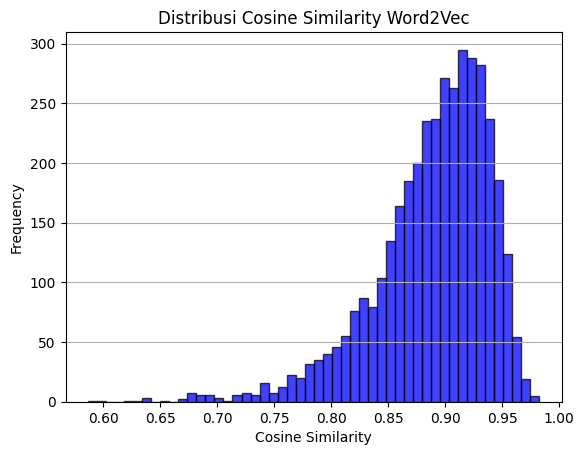

Thresholds berdasarkan distribusi: [0.8631725, 0.8981749, 0.9257667]
<bound method NDFrame.head of                                                   title  \
0     Aturan Baru Sri Mulyani: Gaji Minimal Rp 5 Jut...   
1     Paus Benediktus XVI Meninggal Dunia di Usia 95...   
2     Kondisi Indra Bekti Menurun, Penglihatan Kabur...   
3     Aldila Jelita Dikritik Usai Buka Donasi untuk ...   
4     Banjir Semarang Telan Korban Jiwa, Dua Mahasis...   
...                                                 ...   
3858  15 Prajurit TNI Ditahan Usai Diduga Aniaya Rel...   
3859  Istri Kesal Calon Anak Diberi Nama Seperti Kuc...   
3860  RSUD Sumedang Retak Imbas Gempa M 4,8 di Malam...   
3861  Arsenal di Akhir 2023: Mimpi Posisi Satu, Terd...   
3862  Gelombang Besar Hantam Pantai California, Warg...   

                                                content  sumber date_convert  \
0     KOMPAS.com -Pemerintah dan DPR mengubah batas ...  Kompas   12/31/2022   
1     VATIKAN, KOMPAS.com -Manta

In [ ]:
import matplotlib.pyplot as plt

df = pd.read_csv(r"/content/drive/MyDrive/Pemrosesan Teks/data_scrap_full.csv")

# Menghitung distribusi cosine similarity
similarity_values = df['similarity_word2vec_no_remove_stopwords']

# Visualisasi distribusi similarity
plt.hist(similarity_values, bins=50, alpha=0.75, color='blue', edgecolor='black')
plt.title('Distribusi Cosine Similarity Word2Vec')
plt.xlabel('Cosine Similarity')
plt.ylabel('Frequency')
plt.grid(axis='y')
plt.show()

# Menentukan threshold berdasarkan distribusi
thresholds = [
    similarity_values.quantile(0.25),  # Q1 (25th percentile)
    similarity_values.quantile(0.5),  # Median (50th percentile)
    similarity_values.quantile(0.75)  # Q3 (75th percentile)
]

print(f"Thresholds berdasarkan distribusi: {thresholds}")

# Menambahkan label berdasarkan threshold baru
for threshold in thresholds:
    df[f'label_word2vec_threshold_{threshold:.2f}'] = df['similarity_word2vec_no_remove_stopwords'].apply(lambda x: 1 if x < threshold else 0)

print(df.head)


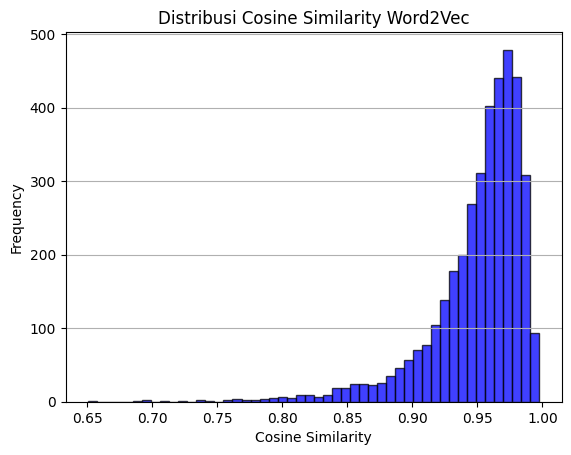

Thresholds berdasarkan distribusi: [0.936877755, 0.9600696, 0.9748752700000001]
<bound method NDFrame.head of                                                   title  \
0     Aturan Baru Sri Mulyani: Gaji Minimal Rp 5 Jut...   
1     Paus Benediktus XVI Meninggal Dunia di Usia 95...   
2     Kondisi Indra Bekti Menurun, Penglihatan Kabur...   
3     Aldila Jelita Dikritik Usai Buka Donasi untuk ...   
4     Banjir Semarang Telan Korban Jiwa, Dua Mahasis...   
...                                                 ...   
3858  15 Prajurit TNI Ditahan Usai Diduga Aniaya Rel...   
3859  Istri Kesal Calon Anak Diberi Nama Seperti Kuc...   
3860  RSUD Sumedang Retak Imbas Gempa M 4,8 di Malam...   
3861  Arsenal di Akhir 2023: Mimpi Posisi Satu, Terd...   
3862  Gelombang Besar Hantam Pantai California, Warg...   

                                                content  sumber date_convert  \
0     KOMPAS.com -Pemerintah dan DPR mengubah batas ...  Kompas   12/31/2022   
1     VATIKAN, KOMPAS

In [ ]:
import matplotlib.pyplot as plt

df = pd.read_csv(r"/content/drive/MyDrive/Pemrosesan Teks/data_scrap_full.csv")

# Menghitung distribusi cosine similarity
similarity_values = df['similarity_word2vec_remove_stopwords']

# Visualisasi distribusi similarity
plt.hist(similarity_values, bins=50, alpha=0.75, color='blue', edgecolor='black')
plt.title('Distribusi Cosine Similarity Word2Vec')
plt.xlabel('Cosine Similarity')
plt.ylabel('Frequency')
plt.grid(axis='y')
plt.show()

# Menentukan threshold berdasarkan distribusi
thresholds = [
    similarity_values.quantile(0.25),  # Q1 (25th percentile)
    similarity_values.quantile(0.5),  # Median (50th percentile)
    similarity_values.quantile(0.75)  # Q3 (75th percentile)
]

print(f"Thresholds berdasarkan distribusi: {thresholds}")

# Menambahkan label berdasarkan threshold baru
for threshold in thresholds:
    df[f'label_word2vec_threshold_{threshold:.2f}'] = df['similarity_word2vec_no_remove_stopwords'].apply(lambda x: 1 if x < threshold else 0)

print(df.head)


### analisis akurasi

Akurasi untuk label_threshold_0.3: 0.7059280352057986
Akurasi untuk label_threshold_0.5: 0.45871084649236343
Akurasi untuk label_threshold_0.7: 0.2560186383639658
Akurasi untuk label_threshold_0.3_remove_stopwords: 0.7059280352057986
Akurasi untuk label_threshold_0.5_remove_stopwords: 0.45871084649236343
Akurasi untuk label_threshold_0.7_remove_stopwords: 0.2560186383639658
Akurasi untuk label_word2vec_threshold_0.8631725: 0.5878850634222107
Akurasi untuk label_word2vec_threshold_0.8981749: 0.42816463888169815
Akurasi untuk label_word2vec_threshold_0.9257667: 0.31115713176287857
Akurasi untuk label_word2vec_remove_threshold_0.936877755: 0.638105099663474
Akurasi untuk label_word2vec_remove_threshold_0.9600696: 0.5104840797307791
Akurasi untuk label_word2vec_remove_threshold_0.9748752700000001: 0.3789800673052032

Kolom dengan akurasi tertinggi:
Kolom: label_threshold_0.3, Akurasi: 0.7059280352057986

Classification Report:
              precision    recall  f1-score   support

        

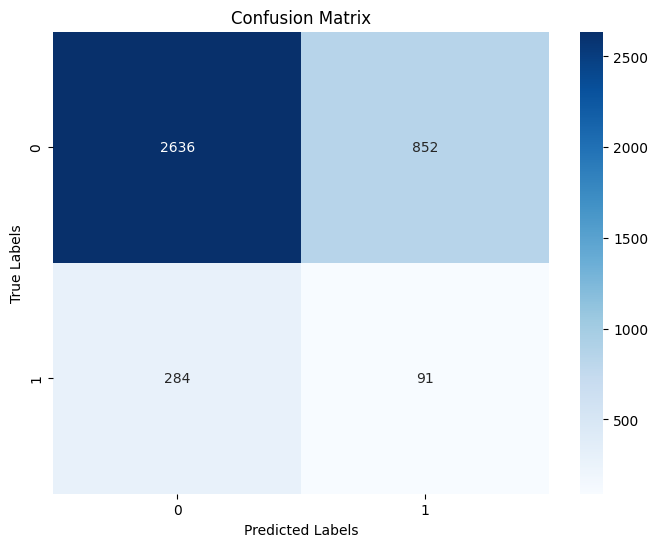

<ipython-input-44-84ce68ab6251>:52: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=label_counts.index, y=label_counts.values, palette="viridis")


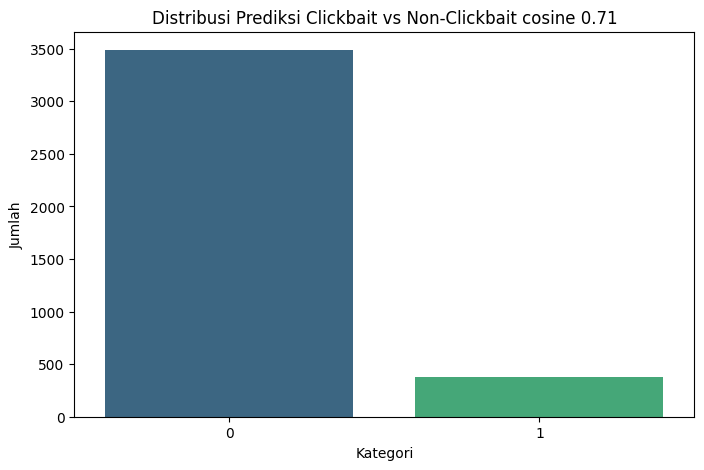

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
def accuracy(y_true, y_pred):
    accuracy = np.sum(y_true == y_pred) / len(y_true)
    return accuracy

data_predik = pd.read_csv(r"/content/drive/MyDrive/projek_pemteks/data_scrap_full.csv")
data_label_rf = pd.read_csv(r"/content/drive/MyDrive/projek_pemteks/hasil_prediksi_scraping_rf_tfidf_no_remove_stopword.csv")

lis_col = []
for i in data_predik.columns:
    if i.startswith('label_'):
      lis_col.append(i)

dict_akurasi= {}
for i in lis_col:
  y_true = data_predik[i]
  y_pred = data_label_rf['prediksi_label']
  acc = accuracy(y_true, y_pred)
  dict_akurasi[i] = acc
  print(f"Akurasi untuk {i}: {acc}")

kolom = max(dict_akurasi, key=dict_akurasi.get)
best_acc = dict_akurasi[kolom]

print("\nKolom dengan akurasi tertinggi:")
print(f"Kolom: {kolom}, Akurasi: {best_acc}")

y_true_best = data_predik[kolom]
y_pred_best = data_label_rf['prediksi_label']

print("\nClassification Report:")
print(classification_report(y_true_best, y_pred_best))

import matplotlib.pyplot as plt
import seaborn as sns




# Visualisasi confusion matrix
conf_matrix = confusion_matrix(y_true_best, y_pred_best)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=np.unique(y_true_best), yticklabels=np.unique(y_true_best))
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

print('\n\n\n\n')
label_counts = y_true_best.value_counts()
plt.figure(figsize=(8, 5))
sns.barplot(x=label_counts.index, y=label_counts.values, palette="viridis")
plt.title('Distribusi Prediksi Clickbait vs Non-Clickbait cosine 0.71')
plt.xlabel('Kategori')
plt.ylabel('Jumlah')
plt.show()

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns


label_counts = dff1['prediksi_label_text'].value_counts()
plt.figure(figsize=(8, 5))
sns.barplot(x=label_counts.index, y=label_counts.values, palette="viridis")
plt.title('Distribusi Prediksi Clickbait vs Non-Clickbait')
plt.xlabel('Kategori')
plt.ylabel('Jumlah')
plt.show()

## Jaccard Similarity

### TFIDF

****NO REMOVE STOPWORDS****

In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import jaccard_score
from scipy.sparse import csr_matrix

df = pd.read_csv(r"/content/drive/MyDrive/Pemrosesan Teks/data_scrap_jaccard_similarity.csv")

tfidf_vectorizer = TfidfVectorizer(tokenizer=lambda x: x.split(), lowercase=False)

title_tfidf = tfidf_vectorizer.fit_transform(df['title_clean_no_remove_stopwords'])
content_tfidf = tfidf_vectorizer.transform(df['content_clean_no_remove_stopwords'])

def jaccard_similarity(vec1: csr_matrix, vec2: csr_matrix):
    intersection = (vec1.multiply(vec2)).sum(axis=1)
    union = (vec1 + vec2).astype(bool).sum(axis=1)
    return (intersection / union).A1  # A1 untuk array 1D

df['similarity_jaccard_tfidf'] = jaccard_similarity(title_tfidf, content_tfidf)

thresholds = [0.002, 0.003, 0.004]  # Atur sesuai analisis distribusi similarity
for threshold in thresholds:
    df[f'label_jaccard_threshold_{threshold}'] = df['similarity_jaccard_tfidf'].apply(lambda x: 1 if x < threshold else 0)

output_file = r"/content/drive/MyDrive/Pemrosesan Teks/data_scrap_jaccard_similarity.csv"
df.to_csv(output_file, index=False, encoding='utf-8')
print(f"Data with Word2Vec similarity and labels saved to {output_file}")

/usr/local/lib/python3.10/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


Data with Word2Vec similarity and labels saved to /content/drive/MyDrive/Pemrosesan Teks/data_scrap_jaccard_similarity.csv


In [ ]:
file = r"/content/drive/MyDrive/Pemrosesan Teks/data_scrap_jaccard_similarity.csv"
df = pd.read_csv(file)
df.head()

,title,content,sumber,date_convert,title_clean_no_remove_stopwords,content_clean_no_remove_stopwords,title_clean_remove_stopwords,content_clean_remove_stopwords,similarity_jaccard_tfidf,label_jaccard_threshold_0.002,label_jaccard_threshold_0.003,label_jaccard_threshold_0.004
0,Aturan Baru Sri Mulyani: Gaji Minimal Rp 5 Jut...,KOMPAS.com -Pemerintah dan DPR mengubah batas ...,Kompas,12/31/2022,atur baru sri mulyani gaji minimal rp juta ken...,kompascom perintah dan dpr ubah batas hasil ke...,aturan sri mulyani gaji minimal rp juta kena p...,kompas com pemerintah dpr mengubah batas pengh...,0.003276,0,0,1
1,Paus Benediktus XVI Meninggal Dunia di Usia 95...,"VATIKAN, KOMPAS.com -MantanPaus Benediktus XVI...",Kompas,12/31/2022,paus benediktus xvi tinggal dunia di usia tahun,vatikan kompascom mantanpaus benediktus xvi me...,paus benediktus xvi meninggal dunia usia,vatikan kompas com mantanpaus benediktus xvi m...,0.006570,0,0,0
2,"Kondisi Indra Bekti Menurun, Penglihatan Kabur...","JAKARTA, KOMPAS.com -Adik presenterIndra Bekti...",Kompas,12/31/2022,kondisi indra bekti turun lihat kabur dan tens...,jakarta kompascom adik presenterindra bekti ci...,kondisi indra bekti menurun penglihatan kabur ...,jakarta kompas com adik presenterindra bekti c...,0.004749,0,0,0
3,Aldila Jelita Dikritik Usai Buka Donasi untuk ...,"JAKARTA, KOMPAS.com- Istri presenterIndra Bekt...",Kompas,1/1/2023,aldila jelita kritik usai buka donasi untuk bi...,jakarta kompascom istri presenterindra bektial...,aldila jelita dikritik buka donasi biaya rumah...,jakarta kompas com istri presenterindra bekti ...,0.003722,0,0,1
4,"Banjir Semarang Telan Korban Jiwa, Dua Mahasis...",KOMPAS.com- Dua mahasiswa tewas akibat terseng...,Kompas,1/1/2023,banjir semarang telan korban jiwa dua mahasisw...,kompascom dua mahasiswa tewas akibat sengat li...,banjir semarang telan korban jiwa mahasiswa te...,kompas com mahasiswa tewas akibat tersengat li...,0.002675,0,1,1


****DISTRIBUSI THRESHOLD NO REMOVE STOPWORDS****

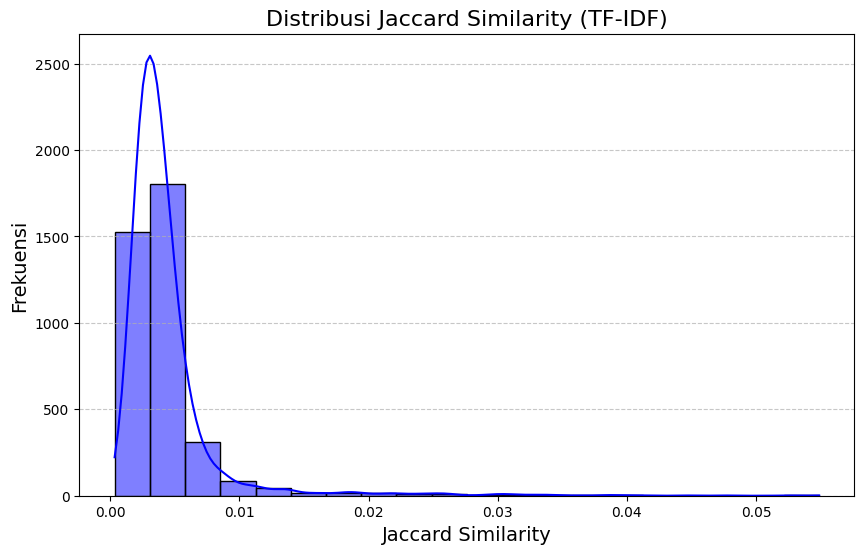

Statistik Distribusi Jaccard Similarity:
Min     : 0.0004
Max     : 0.0549
Mean    : 0.0043
Median  : 0.0035
Std Dev : 0.0039


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load dataset
df = pd.read_csv(r"/content/drive/MyDrive/Pemrosesan Teks/data_scrap_jaccard_similarity.csv")


# Menghitung distribusi similarity (menggunakan Jaccard similarity dari langkah sebelumnya)
similarity_scores = df['similarity_jaccard_tfidf']

# Plot histogram distribusi similarity
plt.figure(figsize=(10, 6))
sns.histplot(similarity_scores, bins=20, kde=True, color='blue')
plt.title('Distribusi Jaccard Similarity (TF-IDF)', fontsize=16)
plt.xlabel('Jaccard Similarity', fontsize=14)
plt.ylabel('Frekuensi', fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

print("Statistik Distribusi Jaccard Similarity:")
print(f"Min     : {similarity_scores.min():.4f}")
print(f"Max     : {similarity_scores.max():.4f}")
print(f"Mean    : {similarity_scores.mean():.4f}")
print(f"Median  : {similarity_scores.median():.4f}")
print(f"Std Dev : {similarity_scores.std():.4f}")


****REMOVE STOPWORDS****

In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import jaccard_score
from scipy.sparse import csr_matrix

df = pd.read_csv(r"/content/drive/MyDrive/Pemrosesan Teks/data_scrap_jaccard_similarity.csv")

tfidf_vectorizer = TfidfVectorizer(tokenizer=lambda x: x.split(), lowercase=False)

title_tfidf = tfidf_vectorizer.fit_transform(df['title_clean_remove_stopwords'])
content_tfidf = tfidf_vectorizer.transform(df['content_clean_remove_stopwords'])

def jaccard_similarity(vec1: csr_matrix, vec2: csr_matrix):
    intersection = (vec1.multiply(vec2)).sum(axis=1)
    union = (vec1 + vec2).astype(bool).sum(axis=1)
    return (intersection / union).A1  # A1 untuk array 1D

df['similarity_jaccard_tfidf_remove_stopwords'] = jaccard_similarity(title_tfidf, content_tfidf)

thresholds = [0.0022, 0.0072, 0.0087] # Atur sesuai analisis distribusi similarity
for threshold in thresholds:
    df[f'label_jaccard_threshold_{threshold}_remove_stopwords'] = df['similarity_jaccard_tfidf_remove_stopwords'].apply(lambda x: 1 if x < threshold else 0)

output_file = r"/content/drive/MyDrive/Pemrosesan Teks/data_scrap_jaccard_similarity.csv"
df.to_csv(output_file, index=False, encoding='utf-8')
print(f"Data with Word2Vec similarity and labels saved to {output_file}")

/usr/local/lib/python3.10/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


Data with Word2Vec similarity and labels saved to /content/drive/MyDrive/Pemrosesan Teks/data_scrap_jaccard_similarity.csv


In [ ]:
file = r"/content/drive/MyDrive/Pemrosesan Teks/data_scrap_jaccard_similarity.csv"
df = pd.read_csv(file)
# columns_to_drop = ['label_jaccard_threshold_0.002_remove_stopwords', 'label_jaccard_threshold_0.003_remove_stopwords', 'label_jaccard_threshold_0.004_remove_stopwords']
# df = df.drop(columns=columns_to_drop)
df.head()

,title,content,sumber,date_convert,title_clean_no_remove_stopwords,content_clean_no_remove_stopwords,title_clean_remove_stopwords,content_clean_remove_stopwords,similarity_jaccard_tfidf,label_jaccard_threshold_0.002,label_jaccard_threshold_0.003,label_jaccard_threshold_0.004,similarity_jaccard_tfidf_remove_stopwords,label_jaccard_threshold_0.002_remove_stopwords,label_jaccard_threshold_0.003_remove_stopwords,label_jaccard_threshold_0.004_remove_stopwords,label_jaccard_threshold_0.0022_remove_stopwords,label_jaccard_threshold_0.0072_remove_stopwords,label_jaccard_threshold_0.0087_remove_stopwords
0,Aturan Baru Sri Mulyani: Gaji Minimal Rp 5 Jut...,KOMPAS.com -Pemerintah dan DPR mengubah batas ...,Kompas,12/31/2022,atur baru sri mulyani gaji minimal rp juta ken...,kompascom perintah dan dpr ubah batas hasil ke...,aturan sri mulyani gaji minimal rp juta kena p...,kompas com pemerintah dpr mengubah batas pengh...,0.003276,0,0,1,0.008028,0,0,0,0,0,1
1,Paus Benediktus XVI Meninggal Dunia di Usia 95...,"VATIKAN, KOMPAS.com -MantanPaus Benediktus XVI...",Kompas,12/31/2022,paus benediktus xvi tinggal dunia di usia tahun,vatikan kompascom mantanpaus benediktus xvi me...,paus benediktus xvi meninggal dunia usia,vatikan kompas com mantanpaus benediktus xvi m...,0.006570,0,0,0,0.019270,0,0,0,0,0,0
2,"Kondisi Indra Bekti Menurun, Penglihatan Kabur...","JAKARTA, KOMPAS.com -Adik presenterIndra Bekti...",Kompas,12/31/2022,kondisi indra bekti turun lihat kabur dan tens...,jakarta kompascom adik presenterindra bekti ci...,kondisi indra bekti menurun penglihatan kabur ...,jakarta kompas com adik presenterindra bekti c...,0.004749,0,0,0,0.009610,0,0,0,0,0,0
3,Aldila Jelita Dikritik Usai Buka Donasi untuk ...,"JAKARTA, KOMPAS.com- Istri presenterIndra Bekt...",Kompas,1/1/2023,aldila jelita kritik usai buka donasi untuk bi...,jakarta kompascom istri presenterindra bektial...,aldila jelita dikritik buka donasi biaya rumah...,jakarta kompas com istri presenterindra bekti ...,0.003722,0,0,1,0.007714,0,0,0,0,0,1
4,"Banjir Semarang Telan Korban Jiwa, Dua Mahasis...",KOMPAS.com- Dua mahasiswa tewas akibat terseng...,Kompas,1/1/2023,banjir semarang telan korban jiwa dua mahasisw...,kompascom dua mahasiswa tewas akibat sengat li...,banjir semarang telan korban jiwa mahasiswa te...,kompas com mahasiswa tewas akibat tersengat li...,0.002675,0,1,1,0.005476,0,0,0,0,1,1


****DISTRIBUSI THRESHOLD REMOVE STOPWORDS****

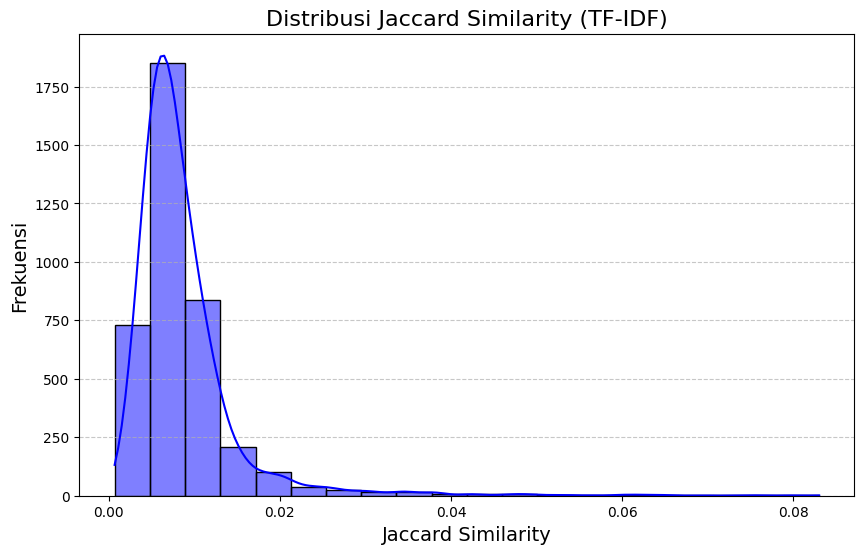

Statistik Distribusi Jaccard Similarity:
Min     : 0.0007
Max     : 0.0830
Mean    : 0.0087
Median  : 0.0072
Std Dev : 0.0065


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load dataset
df = pd.read_csv(r"/content/drive/MyDrive/Pemrosesan Teks/data_scrap_jaccard_similarity.csv")


# Menghitung distribusi similarity (menggunakan Jaccard similarity dari langkah sebelumnya)
similarity_scores = df['similarity_jaccard_tfidf_remove_stopwords']

# Plot histogram distribusi similarity
plt.figure(figsize=(10, 6))
sns.histplot(similarity_scores, bins=20, kde=True, color='blue')
plt.title('Distribusi Jaccard Similarity (TF-IDF)', fontsize=16)
plt.xlabel('Jaccard Similarity', fontsize=14)
plt.ylabel('Frekuensi', fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

print("Statistik Distribusi Jaccard Similarity:")
print(f"Min     : {similarity_scores.min():.4f}")
print(f"Max     : {similarity_scores.max():.4f}")
print(f"Mean    : {similarity_scores.mean():.4f}")
print(f"Median  : {similarity_scores.median():.4f}")
print(f"Std Dev : {similarity_scores.std():.4f}")


### WORD2VEC

****REMOVE STOPWORDS****

Statistik Distribusi Jaccard Similarity:
Min     : 0.0082
Max     : 0.5833
Mean    : 0.0738
Median  : 0.0654
Std Dev : 0.0445


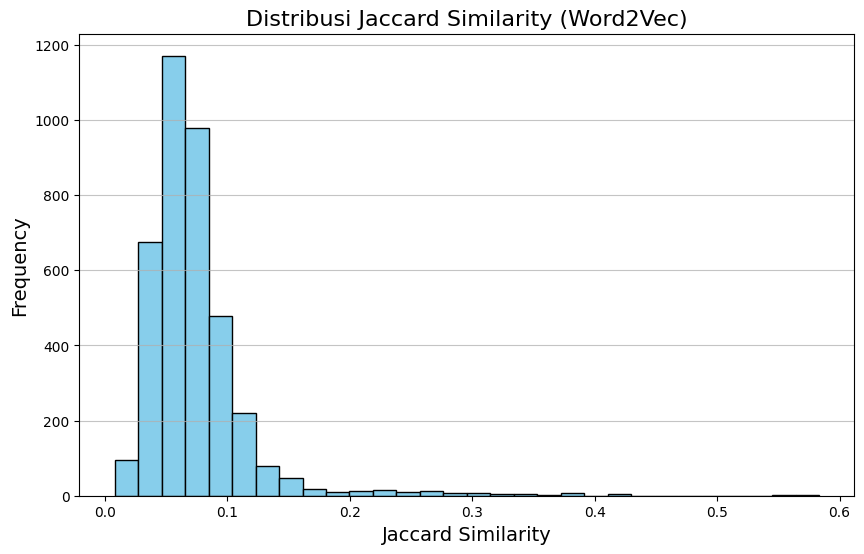

In [ ]:
import pandas as pd
from gensim.models import Word2Vec
import numpy as np

df = pd.read_csv(r"/content/drive/MyDrive/Pemrosesan Teks/data_scrap_jaccard_similarity.csv")

# Tokenisasi untuk Word2Vec
df['title_tokens_remove_stopwords'] = df['title_clean_remove_stopwords'].apply(lambda x: x.split())
df['content_tokens_remove_stopwords'] = df['content_clean_remove_stopwords'].apply(lambda x: x.split())

all_tokens = df['title_tokens_remove_stopwords'].tolist() + df['content_tokens_remove_stopwords'].tolist()
word2vec_model = Word2Vec(sentences=all_tokens, vector_size=100, window=5, min_count=1, workers=4, sg=0)

def jaccard_similarity_word2vec(tokens1, tokens2, model):
    # Filter tokens yang ada dalam Word2Vec vocab
    set1 = set([token for token in tokens1 if token in model.wv])
    set2 = set([token for token in tokens2 if token in model.wv])

    # Hitung Jaccard Similarity
    intersection = len(set1.intersection(set2))
    union = len(set1.union(set2))
    if union == 0:
        return 0.0
    return intersection / union

df['similarity_jaccard_word2vec_remove_stopwords'] = df.apply(
    lambda row: jaccard_similarity_word2vec(row['title_tokens_remove_stopwords'], row['content_tokens_remove_stopwords'], word2vec_model),
    axis=1
)
# Statistik deskriptif
min_val = df['similarity_jaccard_word2vec_remove_stopwords'].min()
max_val = df['similarity_jaccard_word2vec_remove_stopwords'].max()
mean_val = df['similarity_jaccard_word2vec_remove_stopwords'].mean()
median_val = df['similarity_jaccard_word2vec_remove_stopwords'].median()
std_val = df['similarity_jaccard_word2vec_remove_stopwords'].std()

print("Statistik Distribusi Jaccard Similarity:")
print(f"Min     : {min_val:.4f}")
print(f"Max     : {max_val:.4f}")
print(f"Mean    : {mean_val:.4f}")
print(f"Median  : {median_val:.4f}")
print(f"Std Dev : {std_val:.4f}")

# Visualisasi distribusi
plt.figure(figsize=(10, 6))
plt.hist(df['similarity_jaccard_word2vec_remove_stopwords'], bins=30, color='skyblue', edgecolor='black')
plt.title('Distribusi Jaccard Similarity (Word2Vec)', fontsize=16)
plt.xlabel('Jaccard Similarity', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.grid(axis='y', alpha=0.75)
plt.show()


In [ ]:
thresholds = [
    mean_val - std_val,  # Di bawah rata-rata minus standar deviasi
    median_val,          # Median
    mean_val + std_val   # Di atas rata-rata plus standar deviasi
]

for threshold in thresholds:
    df[f'label_jaccard_threshold_{threshold:.4f}'] = df['similarity_jaccard_word2vec_remove_stopwords'].apply(
        lambda x: 1 if x < threshold else 0
    )

output_file = r"/content/drive/MyDrive/Pemrosesan Teks/data_scrap_jaccard_similarity.csv"
df.to_csv(output_file, index=False, encoding='utf-8')
print(f"Data with Word2Vec similarity and labels saved to {output_file}")

Data with Word2Vec similarity and labels saved to /content/drive/MyDrive/Pemrosesan Teks/data_scrap_jaccard_similarity.csv


In [ ]:
import pandas as pd
file = r"/content/drive/MyDrive/Pemrosesan Teks/data_scrap_jaccard_similarity.csv"
df = pd.read_csv(file)
# columns_to_drop = ['label_jaccard_threshold_0.1_remove_stopwords', 'label_jaccard_threshold_0.2_remove_stopwords', 'label_jaccard_threshold_0.3_remove_stopwords']
# df = df.drop(columns=columns_to_drop)
df.head()

,title,content,sumber,date_convert,title_clean_no_remove_stopwords,content_clean_no_remove_stopwords,title_clean_remove_stopwords,content_clean_remove_stopwords,similarity_jaccard_tfidf,label_jaccard_threshold_0.002,...,label_jaccard_threshold_0.004_remove_stopwords,label_jaccard_threshold_0.0022_remove_stopwords,label_jaccard_threshold_0.0072_remove_stopwords,label_jaccard_threshold_0.0087_remove_stopwords,title_tokens_remove_stopwords,content_tokens_remove_stopwords,similarity_jaccard_word2vec_remove_stopwords,label_jaccard_threshold_0.0293,label_jaccard_threshold_0.0654,label_jaccard_threshold_0.1183
0,Aturan Baru Sri Mulyani: Gaji Minimal Rp 5 Jut...,KOMPAS.com -Pemerintah dan DPR mengubah batas ...,Kompas,12/31/2022,atur baru sri mulyani gaji minimal rp juta ken...,kompascom perintah dan dpr ubah batas hasil ke...,aturan sri mulyani gaji minimal rp juta kena p...,kompas com pemerintah dpr mengubah batas pengh...,0.003276,0,...,0,0,0,1,"['aturan', 'sri', 'mulyani', 'gaji', 'minimal'...","['kompas', 'com', 'pemerintah', 'dpr', 'mengub...",0.048951,0,1,1
1,Paus Benediktus XVI Meninggal Dunia di Usia 95...,"VATIKAN, KOMPAS.com -MantanPaus Benediktus XVI...",Kompas,12/31/2022,paus benediktus xvi tinggal dunia di usia tahun,vatikan kompascom mantanpaus benediktus xvi me...,paus benediktus xvi meninggal dunia usia,vatikan kompas com mantanpaus benediktus xvi m...,0.006570,0,...,0,0,0,0,"['paus', 'benediktus', 'xvi', 'meninggal', 'du...","['vatikan', 'kompas', 'com', 'mantanpaus', 'be...",0.083333,0,0,1
2,"Kondisi Indra Bekti Menurun, Penglihatan Kabur...","JAKARTA, KOMPAS.com -Adik presenterIndra Bekti...",Kompas,12/31/2022,kondisi indra bekti turun lihat kabur dan tens...,jakarta kompascom adik presenterindra bekti ci...,kondisi indra bekti menurun penglihatan kabur ...,jakarta kompas com adik presenterindra bekti c...,0.004749,0,...,0,0,0,0,"['kondisi', 'indra', 'bekti', 'menurun', 'peng...","['jakarta', 'kompas', 'com', 'adik', 'presente...",0.090909,0,0,1
3,Aldila Jelita Dikritik Usai Buka Donasi untuk ...,"JAKARTA, KOMPAS.com- Istri presenterIndra Bekt...",Kompas,1/1/2023,aldila jelita kritik usai buka donasi untuk bi...,jakarta kompascom istri presenterindra bektial...,aldila jelita dikritik buka donasi biaya rumah...,jakarta kompas com istri presenterindra bekti ...,0.003722,0,...,0,0,0,1,"['aldila', 'jelita', 'dikritik', 'buka', 'dona...","['jakarta', 'kompas', 'com', 'istri', 'present...",0.067164,0,0,1
4,"Banjir Semarang Telan Korban Jiwa, Dua Mahasis...",KOMPAS.com- Dua mahasiswa tewas akibat terseng...,Kompas,1/1/2023,banjir semarang telan korban jiwa dua mahasisw...,kompascom dua mahasiswa tewas akibat sengat li...,banjir semarang telan korban jiwa mahasiswa te...,kompas com mahasiswa tewas akibat tersengat li...,0.002675,0,...,0,0,1,1,"['banjir', 'semarang', 'telan', 'korban', 'jiw...","['kompas', 'com', 'mahasiswa', 'tewas', 'akiba...",0.057377,0,1,1


****NO REMOVE STOPWORDS****

Statistik Distribusi Jaccard Similarity:
Min     : 0.0082
Max     : 0.5833
Mean    : 0.0738
Median  : 0.0654
Std Dev : 0.0445


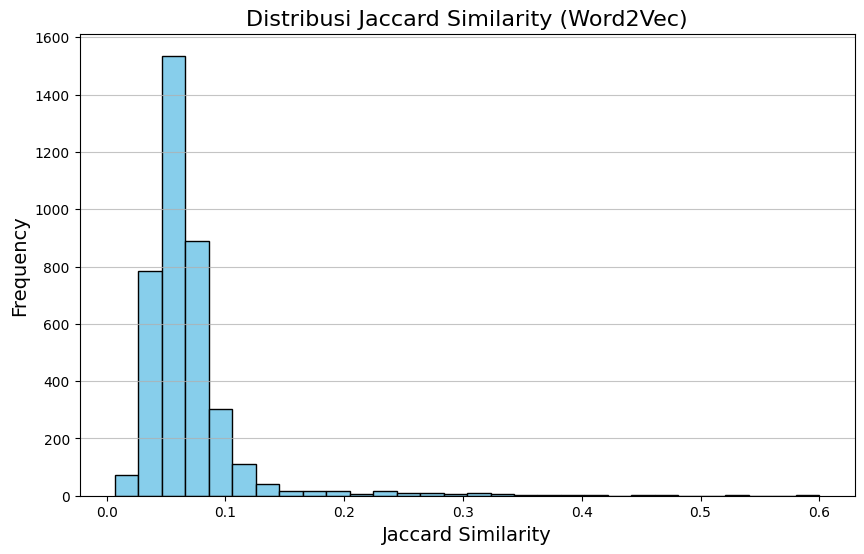

In [ ]:
import pandas as pd
from gensim.models import Word2Vec
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

df = pd.read_csv(r"/content/drive/MyDrive/Pemrosesan Teks/data_scrap_jaccard_similarity.csv")

# Tokenisasi untuk Word2Vec
df['title_tokens_no_remove_stopwords'] = df['title_clean_no_remove_stopwords'].apply(lambda x: x.split())
df['content_tokens_no_remove_stopwords'] = df['content_clean_no_remove_stopwords'].apply(lambda x: x.split())

all_tokens = df['title_tokens_no_remove_stopwords'].tolist() + df['content_tokens_no_remove_stopwords'].tolist()
word2vec_model = Word2Vec(sentences=all_tokens, vector_size=100, window=5, min_count=1, workers=4, sg=0)

def jaccard_similarity_word2vec(tokens1, tokens2, model):
    # Filter tokens yang ada dalam Word2Vec vocab
    set1 = set([token for token in tokens1 if token in model.wv])
    set2 = set([token for token in tokens2 if token in model.wv])

    # Hitung Jaccard Similarity
    intersection = len(set1.intersection(set2))
    union = len(set1.union(set2))
    if union == 0:
        return 0.0
    return intersection / union

df['similarity_jaccard_word2vec_no_remove_stopwords'] = df.apply(
    lambda row: jaccard_similarity_word2vec(row['title_tokens_no_remove_stopwords'], row['content_tokens_no_remove_stopwords'], word2vec_model),
    axis=1
)
# Statistik deskriptif
min_val = df['similarity_jaccard_word2vec_remove_stopwords'].min()
max_val = df['similarity_jaccard_word2vec_remove_stopwords'].max()
mean_val = df['similarity_jaccard_word2vec_remove_stopwords'].mean()
median_val = df['similarity_jaccard_word2vec_remove_stopwords'].median()
std_val = df['similarity_jaccard_word2vec_remove_stopwords'].std()

print("Statistik Distribusi Jaccard Similarity:")
print(f"Min     : {min_val:.4f}")
print(f"Max     : {max_val:.4f}")
print(f"Mean    : {mean_val:.4f}")
print(f"Median  : {median_val:.4f}")
print(f"Std Dev : {std_val:.4f}")

# Visualisasi distribusi
plt.figure(figsize=(10, 6))
plt.hist(df['similarity_jaccard_word2vec_no_remove_stopwords'], bins=30, color='skyblue', edgecolor='black')
plt.title('Distribusi Jaccard Similarity (Word2Vec)', fontsize=16)
plt.xlabel('Jaccard Similarity', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.grid(axis='y', alpha=0.75)
plt.show()


In [ ]:
thresholds = [
    mean_val - std_val,  # Di bawah rata-rata minus standar deviasi
    median_val,          # Median
    mean_val + std_val   # Di atas rata-rata plus standar deviasi
]

for threshold in thresholds:
    df[f'label_jaccard_threshold_{threshold:.4f}_no_remove_stopwords'] = df['similarity_jaccard_word2vec_no_remove_stopwords'].apply(
        lambda x: 1 if x < threshold else 0
    )

output_file = r"/content/drive/MyDrive/Pemrosesan Teks/data_scrap_jaccard_similarity.csv"
df.to_csv(output_file, index=False, encoding='utf-8')
print(f"Data with Word2Vec similarity and labels saved to {output_file}")

Data with Word2Vec similarity and labels saved to /content/drive/MyDrive/Pemrosesan Teks/data_scrap_jaccard_similarity.csv


In [ ]:
file = r"/content/drive/MyDrive/Pemrosesan Teks/data_scrap_jaccard_similarity.csv"
df = pd.read_csv(file)
# columns_to_drop = ['label_jaccard_threshold_0.002_remove_stopwords', 'label_jaccard_threshold_0.003_remove_stopwords', 'label_jaccard_threshold_0.004_remove_stopwords']
# df = df.drop(columns=columns_to_drop)
df.head()

,title,content,sumber,date_convert,title_clean_no_remove_stopwords,content_clean_no_remove_stopwords,title_clean_remove_stopwords,content_clean_remove_stopwords,similarity_jaccard_tfidf,label_jaccard_threshold_0.002,...,label_jaccard_threshold_0.1183,label_jaccard_threshold_0.1_remove_stopwords,label_jaccard_threshold_0.2_remove_stopwords,label_jaccard_threshold_0.3_remove_stopwords,title_tokens_no_remove_stopwords,content_tokens_no_remove_stopwords,similarity_jaccard_word2vec_no_remove_stopwords,label_jaccard_threshold_0.0293_no_remove_stopwords,label_jaccard_threshold_0.0654_no_remove_stopwords,label_jaccard_threshold_0.1183_no_remove_stopwords
0,Aturan Baru Sri Mulyani: Gaji Minimal Rp 5 Jut...,KOMPAS.com -Pemerintah dan DPR mengubah batas ...,Kompas,12/31/2022,atur baru sri mulyani gaji minimal rp juta ken...,kompascom perintah dan dpr ubah batas hasil ke...,aturan sri mulyani gaji minimal rp juta kena p...,kompas com pemerintah dpr mengubah batas pengh...,0.003276,0,...,1,1,1,1,"['atur', 'baru', 'sri', 'mulyani', 'gaji', 'mi...","['kompascom', 'perintah', 'dan', 'dpr', 'ubah'...",0.040816,0,1,1
1,Paus Benediktus XVI Meninggal Dunia di Usia 95...,"VATIKAN, KOMPAS.com -MantanPaus Benediktus XVI...",Kompas,12/31/2022,paus benediktus xvi tinggal dunia di usia tahun,vatikan kompascom mantanpaus benediktus xvi me...,paus benediktus xvi meninggal dunia usia,vatikan kompas com mantanpaus benediktus xvi m...,0.006570,0,...,1,1,1,1,"['paus', 'benediktus', 'xvi', 'tinggal', 'duni...","['vatikan', 'kompascom', 'mantanpaus', 'benedi...",0.060150,0,1,1
2,"Kondisi Indra Bekti Menurun, Penglihatan Kabur...","JAKARTA, KOMPAS.com -Adik presenterIndra Bekti...",Kompas,12/31/2022,kondisi indra bekti turun lihat kabur dan tens...,jakarta kompascom adik presenterindra bekti ci...,kondisi indra bekti menurun penglihatan kabur ...,jakarta kompas com adik presenterindra bekti c...,0.004749,0,...,1,1,1,1,"['kondisi', 'indra', 'bekti', 'turun', 'lihat'...","['jakarta', 'kompascom', 'adik', 'presenterind...",0.071429,0,0,1
3,Aldila Jelita Dikritik Usai Buka Donasi untuk ...,"JAKARTA, KOMPAS.com- Istri presenterIndra Bekt...",Kompas,1/1/2023,aldila jelita kritik usai buka donasi untuk bi...,jakarta kompascom istri presenterindra bektial...,aldila jelita dikritik buka donasi biaya rumah...,jakarta kompas com istri presenterindra bekti ...,0.003722,0,...,1,1,1,1,"['aldila', 'jelita', 'kritik', 'usai', 'buka',...","['jakarta', 'kompascom', 'istri', 'presenterin...",0.055556,0,1,1
4,"Banjir Semarang Telan Korban Jiwa, Dua Mahasis...",KOMPAS.com- Dua mahasiswa tewas akibat terseng...,Kompas,1/1/2023,banjir semarang telan korban jiwa dua mahasisw...,kompascom dua mahasiswa tewas akibat sengat li...,banjir semarang telan korban jiwa mahasiswa te...,kompas com mahasiswa tewas akibat tersengat li...,0.002675,0,...,1,1,1,1,"['banjir', 'semarang', 'telan', 'korban', 'jiw...","['kompascom', 'dua', 'mahasiswa', 'tewas', 'ak...",0.059524,0,1,1


### analisis akurasi

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
data_predik = pd.read_csv(r"/content/drive/MyDrive/projek_pemteks/data_scrap_full.csv")
data_predik.head()

,title,content,sumber,date_convert,title_clean_no_remove_stopwords,content_clean_no_remove_stopwords,title_clean_remove_stopwords,content_clean_remove_stopwords,similarity_remove_stopwords,similarity_no_remove,...,label_word2vec_threshold_0.8981749,label_word2vec_threshold_0.9257667,title_tokens_remove_stopwords,content_tokens_remove_stopwords,title_vector_remove_stopwords,content_vector_remove_stopwords,similarity_word2vec_remove_stopwords,label_word2vec_remove_threshold_0.936877755,label_word2vec_remove_threshold_0.9600696,label_word2vec_remove_threshold_0.9748752700000001
0,Aturan Baru Sri Mulyani: Gaji Minimal Rp 5 Jut...,KOMPAS.com -Pemerintah dan DPR mengubah batas ...,Kompas,12/31/2022,atur baru sri mulyani gaji minimal rp juta ken...,kompascom perintah dan dpr ubah batas hasil ke...,aturan sri mulyani gaji minimal rp juta kena p...,kompas com pemerintah dpr mengubah batas pengh...,0.610109,0.514275,...,0,1,"['aturan', 'sri', 'mulyani', 'gaji', 'minimal'...","['kompas', 'com', 'pemerintah', 'dpr', 'mengub...",[ 0.23059726 0.69110453 0.5002357 -0.203354...,[ 1.92022637e-01 5.74816167e-01 3.02309334e-...,0.985882,0,0,0
1,Paus Benediktus XVI Meninggal Dunia di Usia 95...,"VATIKAN, KOMPAS.com -MantanPaus Benediktus XVI...",Kompas,12/31/2022,paus benediktus xvi tinggal dunia di usia tahun,vatikan kompascom mantanpaus benediktus xvi me...,paus benediktus xvi meninggal dunia usia,vatikan kompas com mantanpaus benediktus xvi m...,0.751534,0.696443,...,1,1,"['paus', 'benediktus', 'xvi', 'meninggal', 'du...","['vatikan', 'kompas', 'com', 'mantanpaus', 'be...",[ 0.17597152 0.45488456 0.14893591 -0.236438...,[ 0.11223068 0.35177058 0.16579017 -0.063159...,0.837914,1,1,1
2,"Kondisi Indra Bekti Menurun, Penglihatan Kabur...","JAKARTA, KOMPAS.com -Adik presenterIndra Bekti...",Kompas,12/31/2022,kondisi indra bekti turun lihat kabur dan tens...,jakarta kompascom adik presenterindra bekti ci...,kondisi indra bekti menurun penglihatan kabur ...,jakarta kompas com adik presenterindra bekti c...,0.548712,0.561120,...,0,1,"['kondisi', 'indra', 'bekti', 'menurun', 'peng...","['jakarta', 'kompas', 'com', 'adik', 'presente...",[ 0.22485219 0.45703125 0.27638018 -0.096561...,[ 0.13802646 0.4999075 0.2668819 -0.071658...,0.912046,1,1,1
3,Aldila Jelita Dikritik Usai Buka Donasi untuk ...,"JAKARTA, KOMPAS.com- Istri presenterIndra Bekt...",Kompas,1/1/2023,aldila jelita kritik usai buka donasi untuk bi...,jakarta kompascom istri presenterindra bektial...,aldila jelita dikritik buka donasi biaya rumah...,jakarta kompas com istri presenterindra bekti ...,0.601667,0.554581,...,0,1,"['aldila', 'jelita', 'dikritik', 'buka', 'dona...","['jakarta', 'kompas', 'com', 'istri', 'present...",[ 0.14519054 0.48989278 0.35846534 -0.049308...,[ 0.09745385 0.43076655 0.26293185 -0.050166...,0.940289,0,1,1
4,"Banjir Semarang Telan Korban Jiwa, Dua Mahasis...",KOMPAS.com- Dua mahasiswa tewas akibat terseng...,Kompas,1/1/2023,banjir semarang telan korban jiwa dua mahasisw...,kompascom dua mahasiswa tewas akibat sengat li...,banjir semarang telan korban jiwa mahasiswa te...,kompas com mahasiswa tewas akibat tersengat li...,0.433578,0.353634,...,0,1,"['banjir', 'semarang', 'telan', 'korban', 'jiw...","['kompas', 'com', 'mahasiswa', 'tewas', 'akiba...",[ 4.9320093e-01 5.7473677e-01 3.6342460e-01 ...,[ 3.55180681e-01 5.91223359e-01 3.17418188e-...,0.974180,0,0,1


In [ ]:
data_label_rf = pd.read_csv(r"/content/drive/MyDrive/projek_pemteks/hasil_prediksi_scraping_rf_tfidf_no_remove_stopword.csv")
data_label_rf.head()

,title,content,sumber,date_convert,title_clean,prediksi_label,prediksi_label_text
0,Aturan Baru Sri Mulyani: Gaji Minimal Rp 5 Jut...,KOMPAS.com -Pemerintah dan DPR mengubah batas ...,Kompas,2022-12-31,atur baru sri mulyani gaji minimal rp juta ken...,0,non-clickbait
1,Paus Benediktus XVI Meninggal Dunia di Usia 95...,"VATIKAN, KOMPAS.com -MantanPaus Benediktus XVI...",Kompas,2022-12-31,paus benediktus xvi tinggal dunia di usia tahun,0,non-clickbait
2,"Kondisi Indra Bekti Menurun, Penglihatan Kabur...","JAKARTA, KOMPAS.com -Adik presenterIndra Bekti...",Kompas,2022-12-31,kondisi indra bekti turun lihat kabur dan tens...,0,non-clickbait
3,Aldila Jelita Dikritik Usai Buka Donasi untuk ...,"JAKARTA, KOMPAS.com- Istri presenterIndra Bekt...",Kompas,2023-01-01,aldila jelita kritik usai buka donasi untuk bi...,1,clickbait
4,"Banjir Semarang Telan Korban Jiwa, Dua Mahasis...",KOMPAS.com- Dua mahasiswa tewas akibat terseng...,Kompas,2023-01-01,banjir semarang telan korban jiwa dua mahasisw...,0,non-clickbait


Akurasi untuk label_jaccard_threshold_0.002: 0.7054103028734144
Akurasi untuk label_jaccard_threshold_0.003: 0.5783070152731038
Akurasi untuk label_jaccard_threshold_0.004: 0.45353352316852186
Akurasi untuk label_jaccard_threshold_0.0022_remove_stopwords: 0.7486409526274916
Akurasi untuk label_jaccard_threshold_0.0072_remove_stopwords: 0.5135904737250842
Akurasi untuk label_jaccard_threshold_0.0087_remove_stopwords: 0.4338596945379239
Akurasi untuk label_jaccard_threshold_0.0293: 0.7424281646388817
Akurasi untuk label_jaccard_threshold_0.0654: 0.49546984209163863
Akurasi untuk label_jaccard_threshold_0.1183: 0.2793165933212529
Akurasi untuk label_jaccard_threshold_0.0293_no_remove_stopwords: 0.7408749676417292
Akurasi untuk label_jaccard_threshold_0.0654_no_remove_stopwords: 0.40874967641729226
Akurasi untuk label_jaccard_threshold_0.1183_no_remove_stopwords: 0.26947967900595393

Kolom dengan akurasi tertinggi:
Kolom: label_jaccard_threshold_0.0022_remove_stopwords, Akurasi: 0.74864095

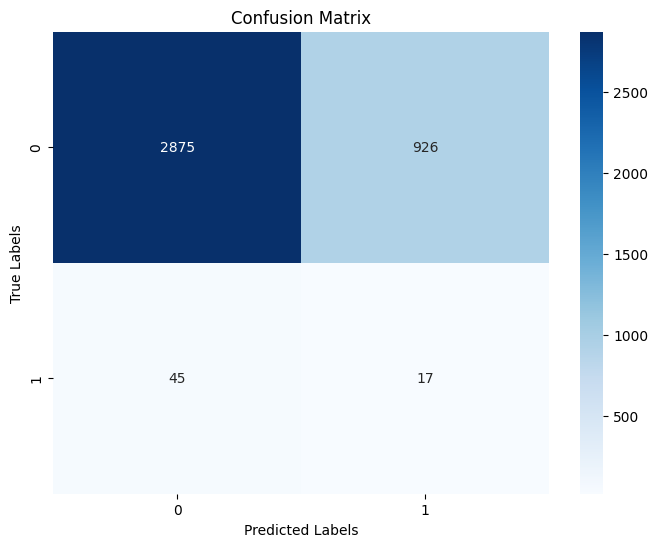

<ipython-input-46-5437d9e0dc02>:52: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=label_counts.index, y=label_counts.values, palette="viridis")


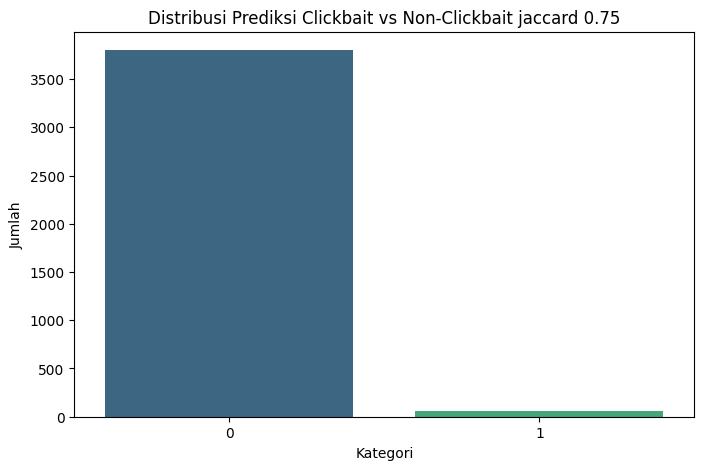

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
def accuracy(y_true, y_pred):
    accuracy = np.sum(y_true == y_pred) / len(y_true)
    return accuracy

data_predik = pd.read_csv(r"/content/drive/MyDrive/projek_pemteks/data_scrap_jaccard_similarity.csv")
data_label_rf = pd.read_csv(r"/content/drive/MyDrive/projek_pemteks/hasil_prediksi_scraping_rf_tfidf_no_remove_stopword.csv")

lis_col = []
for i in data_predik.columns:
    if i.startswith('label_'):
      lis_col.append(i)

dict_akurasi= {}
for i in lis_col:
  y_true = data_predik[i]
  y_pred = data_label_rf['prediksi_label']
  acc = accuracy(y_true, y_pred)
  dict_akurasi[i] = acc
  print(f"Akurasi untuk {i}: {acc}")

kolom = max(dict_akurasi, key=dict_akurasi.get)
best_acc = dict_akurasi[kolom]

print("\nKolom dengan akurasi tertinggi:")
print(f"Kolom: {kolom}, Akurasi: {best_acc}")

y_true_best = data_predik[kolom]
y_pred_best = data_label_rf['prediksi_label']

print("\nClassification Report:")
print(classification_report(y_true_best, y_pred_best))

import matplotlib.pyplot as plt
import seaborn as sns




# Visualisasi confusion matrix
conf_matrix = confusion_matrix(y_true_best, y_pred_best)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=np.unique(y_true_best), yticklabels=np.unique(y_true_best))
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

print('\n\n\n\n')
label_counts = y_true_best.value_counts()
plt.figure(figsize=(8, 5))
sns.barplot(x=label_counts.index, y=label_counts.values, palette="viridis")
plt.title('Distribusi Prediksi Clickbait vs Non-Clickbait jaccard 0.75')
plt.xlabel('Kategori')
plt.ylabel('Jumlah')
plt.show()

Akurasi s: 0.7486409526274916


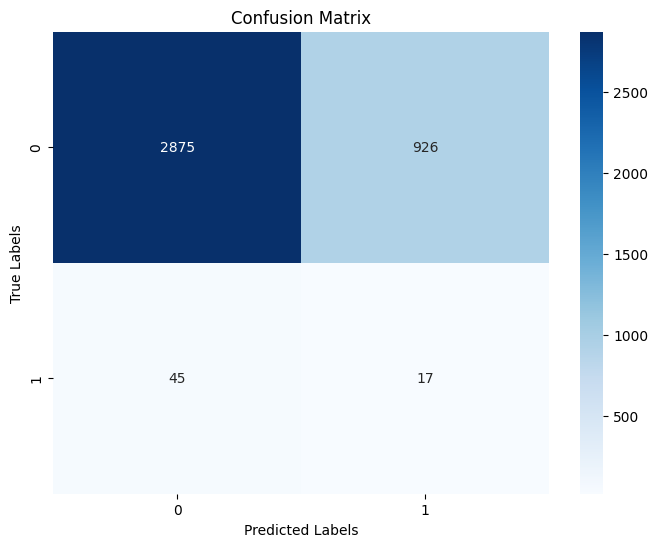

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
def accuracy(y_true, y_pred):
    accuracy = np.sum(y_true == y_pred) / len(y_true)
    return accuracy

data_simi = pd.read_csv(r"/content/drive/MyDrive/projek_pemteks/data_scrap_jaccard_similarity.csv")
data_label_rf = pd.read_csv(r"/content/drive/MyDrive/projek_pemteks/hasil_prediksi_scraping_rf_tfidf_no_remove_stopword.csv")

y_rf = data_label_rf['prediksi_label']
y_simi = data_simi['label_jaccard_threshold_0.0022_remove_stopwords']

acc = accuracy(y_simi,y_rf)
print(f"Akurasi s: {acc}")
# Visualisasi confusion matrix
conf_matrix = confusion_matrix(y_simi, y_rf)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=np.unique(y_simi), yticklabels=np.unique(y_simi))
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()


# Klasifikasi dengan Fitur Kata Kata Menggunakan Data Kaggle